<h1 align='center'>Image classification using Knn and Nearest Centroid Classifier</h1>

### Dataset

For the training and evaluation i will use FashionMNIST dataset. Fashion-MNIST is a dataset of Zalando's article images—consisting of a training set of 60,000 examples and a test set of 10,000 examples. Each example is a 28x28 grayscale image, associated with a label from 10 classes.

## Import LIbraries

In [2]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

In [27]:
import tensorflow as tf
import numpy as np
import time
import os
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold
from scipy.stats import mode
from sklearn.metrics import confusion_matrix, precision_score, recall_score, accuracy_score, ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import cosine_distances,manhattan_distances
from matplotlib.colors import ListedColormap
from sklearn.utils import check_random_state
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from collections import defaultdict
from sklearn.neighbors import NearestCentroid
from sklearn.cluster import KMeans


## Functions

### Load the dataset

In [4]:
def load_dataset() -> tuple :
    """
    Load the fashionMNIST dataset
    """
    
    fashion_mnist = tf.keras.datasets.fashion_mnist
    return fashion_mnist.load_data()

### Euclidean distance without root

The main target is to rank the images. The function of the square root $f(x) = \sqrt{x}$ is a strictly increasing function.

Therefore, we have: if $\sqrt{A} > \sqrt{B}$ then $A > B$. Thus we dont calculate the square root to increase speed.

In [42]:
def euclidean(saved_embeddings, new_embeddings):
    """
    Compute the squared difference between the new images and the images from the training set.

    Args:
        saved_embeddings (_type_): the images from the trainig set
        new_embeddings (_type_): the new image
    """
    # (a-b)^2 = a^2 - 2ab + b^2
    return np.sum(saved_embeddings**2, axis=1,keepdims=True) - 2 * saved_embeddings @ new_embeddings.T + np.sum(new_embeddings**2, axis=1,keepdims=True).T

### Cosine distances

Cosine similarity is a metric, helpful in determining, how similar the data objects are irrespective of their size. It can be helpful to avoid the problem of the same clothes-different brightness. However cosine similarity return a number from 0 to 1 where 1 indicates similarity and 0 non-similarity. The fact that knn sorts the distances and selects the k nearest is a problem because cosine similarity indicates the similarity as the biggest number (1). So we will use cosine distances: $1-cosine_similarity$. As a result 0 means similarity 

In [58]:
def cos_distance(saved_embeddings, new_embeddings):
    """
    Compute the cosine distances between the new images and the images from the training set.

    Args:
        saved_embeddings (_type_): the images from the trainig set
        new_embeddings (_type_): the new image
    """
    return cosine_distances(saved_embeddings, new_embeddings)

### Manhatan distance

In [50]:
def manhatan(saved_embeddings, new_embeddings):
    """
     Compute the manhatan distance between the new images and the images from the training set.

    Args:
        saved_embeddings (_type_): the images from the trainig set
        new_embeddings (_type_): the new image
    """
    return manhattan_distances(saved_embeddings, new_embeddings)

### Normalization

Normalization of the pixels is neccesery, because without normalization we will face Datatype Overflow. The values of pixels are between 0-255 and the are stored as unit8 (Unsigned Integer 8-bit). In the euclidean distance, when we calculate $ a^2 + b^2 - 2ab$ then $a^2$ and $b^2$ may take values > 255 (e.g $255^2 = 65,025$). These numbers are bigger than the numbers unit8 can store, so the euclidean distance is full of wrong numbers. Using Normalization we solve the datatype overflow problem.

In [41]:
def norm(X_train, X_test):
    """
    Normalize the data using min-max or z-score.

    Args:
        X_train (_type_): the training set
        X_test (_type_): the test set
    """
    # Min-Max Scaling
    x_train_embeddings = X_train.astype(float) / 255.0
    x_test_embeddings = X_test.astype(float) / 255.0

    # Z-score Normalization
    #row_mean = x_train_embeddings.mean(axis=1, keepdims=True)
    #row_std = x_train_embeddings.std(axis=1,keepdims=True)
    #x_train_embeddings = (x_train_embeddings - row_mean) / row_std 
    #row_mean2 = x_test_embeddings.mean(axis=1, keepdims=True)
    #row_std2 = x_test_embeddings.std(axis=1,keepdims=True)
    #x_test_embeddings = (x_test_embeddings - row_mean2) / row_std2 

    return x_train_embeddings, x_test_embeddings

### Visual Analysis

In [62]:
def plot_and_save_analysis(y_true, y_pred, x_test_images, model_name):
    """
    Create the confusion matrix and plot some True-False preidctions.
    """
   
    output_dir = f"analysis_{model_name.replace(' ', '_')}"
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix - {model_name}')
    plt.ylabel('True Class')
    plt.xlabel('Predicted Class')
    
    cm_filename = os.path.join(output_dir, "confusion_matrix7.svg")
    plt.savefig(cm_filename, format='svg', bbox_inches='tight')
    plt.close()

    correct_indices = np.where(y_true == y_pred)[0]
    wrong_6_as_0 = np.where((y_true == 6) & (y_pred == 4))[0]
    wrong_4_as_2 = np.where((y_true == 6) & (y_pred == 4))[0]

    correct_indices = np.where(y_true == y_pred)[0]
    wrong_6_as_0 = np.where((y_true == 4) & (y_pred == 2))[0]
    wrong_4_as_2 = np.where((y_true == 4) & (y_pred == 2))[0]

    
    if len(correct_indices) >= 2:
        
        c1, c2 = np.random.choice(correct_indices, 2, replace=False)
        
        fig, axes = plt.subplots(1, 2, figsize=(8, 4))
        fig.suptitle(f'True Predictions - {model_name}', fontsize=14)

        axes[0].imshow(x_test_images[c1].reshape(28, 28), cmap='gray')
        axes[0].set_title(f"True: {y_true[c1]} | Pred: {y_pred[c1]}")
        axes[0].axis('off')
        
        axes[1].imshow(x_test_images[c2].reshape(28, 28), cmap='gray')
        axes[1].set_title(f"True: {y_true[c2]} | Pred: {y_pred[c2]}")
        axes[1].axis('off')

        correct_filename = os.path.join(output_dir, "correct_examples7.svg")
        plt.savefig(correct_filename, format='svg', bbox_inches='tight')
        plt.show() 
        

    
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    fig.suptitle(f'False Predictions - {model_name}', fontsize=14)

    if len(wrong_6_as_0) > 0:
        w1 = np.random.choice(wrong_6_as_0)
        axes[0].imshow(x_test_images[w1].reshape(28, 28), cmap='gray')
        axes[0].set_title(f"True: 7 | Pred: 1")
        axes[0].axis('off')
    else:
        axes[0].text(0.5, 0.5, "Not Found\nTrue=6, Pred=0!", ha='center')
        axes[0].axis('off')

    if len(wrong_4_as_2) > 0:
        w2 = np.random.choice(wrong_4_as_2)
        axes[1].imshow(x_test_images[w2].reshape(28, 28), cmap='gray')
        axes[1].set_title(f"True: 4  | Pred: 9 ")
        axes[1].axis('off')
    else:
        axes[1].text(0.5, 0.5, "NOt Found\nTrue=4, Pred=2!", ha='center')
        axes[1].axis('off')

    wrong_filename = os.path.join(output_dir, "wrong_examples7.svg")
    plt.savefig(wrong_filename, format='svg', bbox_inches='tight')
    plt.show() 


## Feature Extraction

### Top-bottom mean brightness

In [8]:
def top_bottom(X):
    """
    Calculate the mean brightness slicing the image to half in horizontal axis.

    Args:
        X (_type_): the images set
    """
    top_mean = np.mean(X[:, :14, :], axis=(1, 2))
    bottom_mean = np.mean(X[:, 14:, :], axis=(1, 2))
    
    return np.column_stack((top_mean, bottom_mean))
    

### Flattening the image

In [39]:
def flattening(X):
    """
    flat the 28x28 image to a 784 vector

    Args:
        X (_type_): the images set
    """

    return X.reshape(X.shape[0], -1)

### Mean horizontal-Vertical brightness

In [10]:
def mean_per_axis(X):
    """
    Calculate the mean brightness per row and per column and concatenate.

    Args:
        X (_type_): the images set
    """

    mean_per_row = np.mean(X,axis=1)
    mean_per_col = np.mean(X,axis=2)

    return np.hstack([mean_per_row,mean_per_col])

## Model Evaluation

For the multi-class evaluation we will use

1) Accuracy
2) Recall per class
3) Precision per class
4) Macro Recall
5) Macro Precision
6) Confusion Matrix

In [38]:
def evaluation(y_pred,y_true):
    """
    Print an evaluation report using the metrics above

    Args:
        y_pred (_np.ndarray): the labels the model predicted
        y_true (np.ndarray): the real labels
    """
    # Confusion Matrix
    cm = confusion_matrix(y_true,y_pred)
    display = ConfusionMatrixDisplay(confusion_matrix=cm)
    acc = accuracy_score(y_true,y_pred)
    macro_rec = recall_score(y_true,y_pred, average='macro')
    macro_pre = precision_score(y_true,y_pred, average='macro')
    print(f" Accuracy Score: {acc}")
    print(f" Recall per class: {recall_score(y_true,y_pred,average=None)}")
    print(f" Precision per class: {precision_score(y_true,y_pred,average=None)}")
    print(f" Macro Recall: {macro_rec}")
    print(f" Macro Precision: {macro_pre}")

    display.plot()
    plt.show()

    return acc, macro_rec, macro_pre

## Knn Implementation

In [37]:
class Knn:
    def __init__(self,k : int, distance_metric : callable):
        """
        Initialize the Knn algorithm

        Args:
            k (int): the number of neighbours
            distance_metric (function): the metric that will be used to calculate the distance
        """
        self.k = k
        self.calculate_distance = distance_metric

    def fit(self, X, y):
        self.X = X
        self.y = y

    def predict(self, X_input):
        """
         Calculate the distances between input x and all the images from the training set. Return the label that the majority of K neighbours have.
        Args:
            X_input (np.ndarray): new image
        """
        # Calculate the distances
        distances = self.calculate_distance(self.X, X_input)

        # Using the np.argpartition we avoid sorting the whole array and we just transfer the k lowest values at the beggining of the array
        nearest_neighbours_indexes = np.argpartition(distances,self.k - 1,axis=0)[:self.k,:]

        # take the labels from the k nearest
        nearest_neighbours_labels = self.y[nearest_neighbours_indexes]

        return mode(nearest_neighbours_labels,axis=0).mode
             


        

## Main

### Load the dataset

In [9]:
(x_train, y_train), (x_test,y_test) = load_dataset()

print(f"Training set shape: {x_train.shape}")
print(f"Test set shape: {x_test.shape}")
print(f"Training Labels shape: {y_train.shape}")
print(f"Test Labels shape: {y_test.shape}")

Training set shape: (60000, 28, 28)
Test set shape: (10000, 28, 28)
Training Labels shape: (60000,)
Test Labels shape: (10000,)


### Check Class balance

In [18]:
print(f"Training set class bincount: {np.bincount(y_train)}")
print(f"Test set class bincount: {np.bincount(y_test)}")

Training set class bincount: [6000 6000 6000 6000 6000 6000 6000 6000 6000 6000]
Test set class bincount: [1000 1000 1000 1000 1000 1000 1000 1000 1000 1000]


### Knn using k=11 to measure the prediction time

since the KNN algorithm does not involve a training phase. Therefore, the computational complexity that matters in this case is the prediction complexity. There will be no evaluation in this section. The evaluation is in the section below.

In [21]:
# Flaten the 28x28 image to 784 vector
x_train_embeddings = flattening(x_train)
x_test_embeddings = flattening(x_test)

# Normalize the pixels values
x_train_embeddings, x_test_embeddings = norm(x_train_embeddings,x_test_embeddings)

k_n = 11
knn = Knn(k_n,distance_metric=manhatan)
start_time = time.time()
knn.fit(x_train_embeddings, y_train)
y_predicted = knn.predict(x_test_embeddings)
dur = time.time() - start_time
print(f"For 10,000 test samples the predict time needed is: {dur:.3f} sec")
print(f"For 1 test sample the predict time needed is approximently: {dur/10000 :.3f} sec, {dur/10000 * 1000:.3f} msec")


For 10,000 test samples the predict time needed is: 361.179 sec
For 1 test sample the predict time needed is approximently: 0.036 sec, 36.118 msec


### Knn using k=1 to see the concept of overfiting

Since there is no training, we can't compare training/validation loss. However using k=1 we know that the trianing loss is 0. In other words the accuracy for known data is 100%. However the test set accuracy is not the same.

 Accuracy Score: 0.8497
 Recall per class: [0.8   0.975 0.782 0.85  0.734 0.863 0.619 0.949 0.958 0.967]
 Precision per class: [0.77896787 0.9828629  0.73015873 0.88726514 0.77019937 0.99195402
 0.60567515 0.90209125 0.9825641  0.89537037]
 Macro Recall: 0.8497
 Macro Precision: 0.8527108904515475


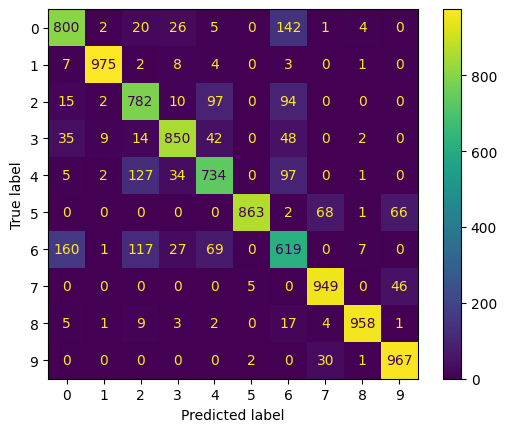

(0.8497, 0.8497, 0.8527108904515475)


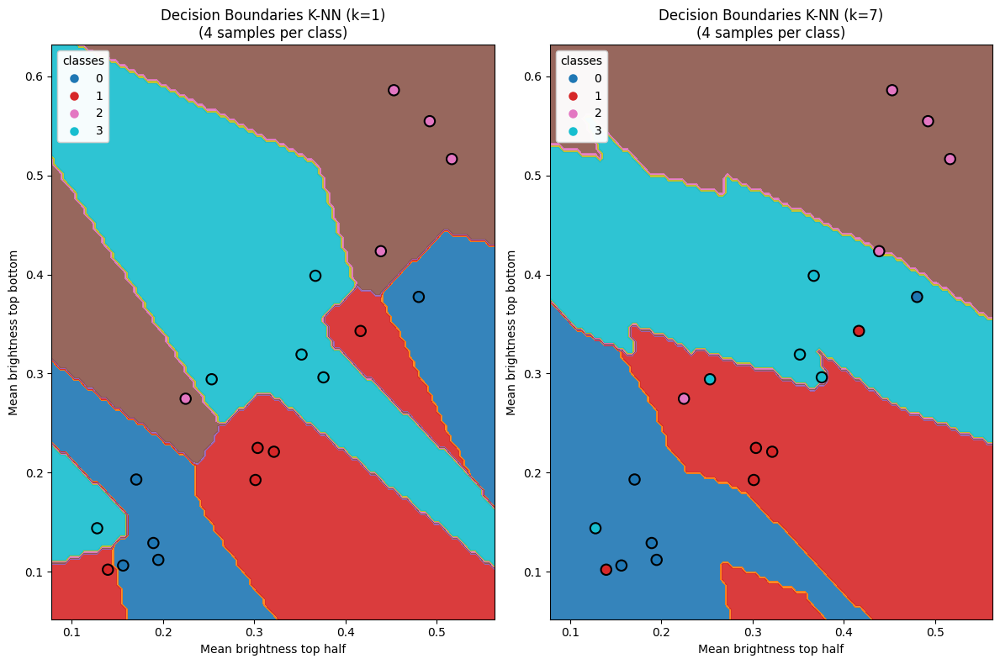

In [ ]:
# Use the Knn with k=1 to see the accuracy using flattening
x_train_flat = flattening(x_train) 
x_test_flat = flattening(x_test) 
x_train_flat = x_train_flat.astype(float) / 255.0
x_test_flat = x_test_flat.astype(float) / 255.0
k_n = 1
knn = Knn(k_n,distance_metric=euclidean)
knn.fit(x_train_flat, y_train)
y_predicted = knn.predict(x_test_flat)
print(evaluation(y_predicted, y_test))

# Choose 5 samples for 3 classes (Stratified Subsampling)
rng = check_random_state(42)
X_subset = []
y_subset = []

for label in range(4):
    indices = np.where(y_train == label)[0] 
    # Select 5 random indices
    random_indices = rng.choice(indices, size=5, replace=False)
    X_subset.append(x_train_embeddings[random_indices])
    y_subset.append(y_train[random_indices])

X_subset = np.vstack(X_subset)
y_subset = np.concatenate(y_subset)


knn.fit(X_subset,y_subset)
knn_7 = Knn(7,euclidean)
knn_7.fit(X_subset, y_subset)

colors = plt.cm.tab10(np.arange(10))
cmap_bold = ListedColormap(colors) 
cmap_light = ListedColormap(colors * np.array([1, 1, 1, 0.4])) 

# Create the Meshgrid
x_min, x_max = X_subset[:, 0].min() - 0.05, X_subset[:, 0].max() + 0.05
y_min, y_max = X_subset[:, 1].min() - 0.05, X_subset[:, 1].max() + 0.05
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.005),
                     np.arange(y_min, y_max, 0.005))


Z = knn.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)
Z_7 = knn_7.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)

plt.figure(figsize=(12, 8))
plt.subplot(1,2,1)
plt.contourf(xx, yy, Z, cmap=cmap_light, alpha=0.9)
scatter = plt.scatter(X_subset[:, 0], X_subset[:, 1], c=y_subset, cmap=cmap_bold,
                      edgecolor='k', s=80, linewidth=1.5)


plt.title("Decision Boundaries K-NN (k=1)\n(4 samples per class)")
plt.xlabel("Mean brightness top half")
plt.ylabel("Mean brightness top bottom")

legend1 = plt.legend(*scatter.legend_elements(), title="classes", loc="upper left")
plt.gca().add_artist(legend1)

plt.subplot(1,2,2)

plt.contourf(xx, yy, Z_7, cmap=cmap_light, alpha=0.9)
scatter = plt.scatter(X_subset[:, 0], X_subset[:, 1], c=y_subset, cmap=cmap_bold,
                      edgecolor='k', s=80, linewidth=1.5)

plt.title("Decision Boundaries K-NN (k=7)\n(4 samples per class)")
plt.xlabel("Mean brightness top half")
plt.ylabel("Mean brightness top bottom")

legend1 = plt.legend(*scatter.legend_elements(), title="classes", loc="upper left")
plt.gca().add_artist(legend1)

plt.tight_layout()

plt.savefig("knn_decision_boundaries.svg", format="svg", bbox_inches="tight")

plt.show()

### Evaluate the model

## 10 Folds Cross Validation

In [78]:
x_train_half, _ , y_train_half , _ = train_test_split(x_train_embeddings, y_train, train_size=30000, stratify=y_train, random_state=42)
print(f"Training set class bincount: {np.bincount(y_train_half)}")

Training set class bincount: [3000 3000 3000 3000 3000 3000 3000 3000 3000 3000]


Fold 0:
 Accuracy Score: 0.8436666666666667
 Recall per class: [0.87       0.96666667 0.85333333 0.88333333 0.7        0.81333333
 0.51666667 0.94       0.93333333 0.96      ]
 Precision per class: [0.76315789 0.99315068 0.72112676 0.88628763 0.70469799 1.
 0.66523605 0.85196375 0.98939929 0.89164087]
 Macro Recall: 0.8436666666666668
 Macro Precision: 0.8466660910111965


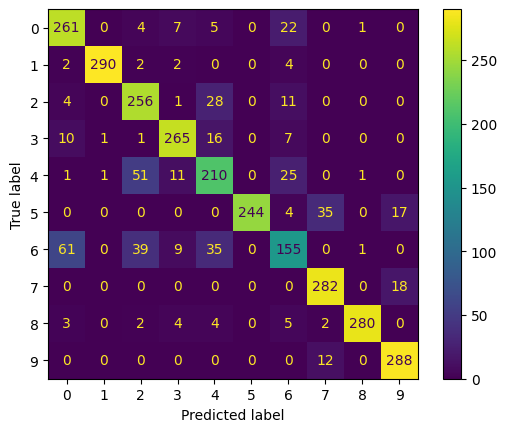

Fold 1:
 Accuracy Score: 0.839
 Recall per class: [0.88666667 0.95       0.76       0.87       0.75       0.80333333
 0.53666667 0.94666667 0.94       0.94666667]
 Precision per class: [0.75141243 0.99303136 0.7284345  0.87583893 0.73529412 0.99176955
 0.61685824 0.83529412 0.99646643 0.9015873 ]
 Macro Recall: 0.8390000000000001
 Macro Precision: 0.8425986972080199


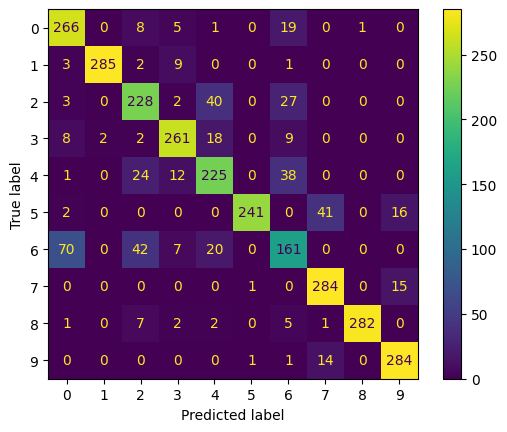

Fold 2:
 Accuracy Score: 0.8473333333333334
 Recall per class: [0.86666667 0.97       0.77       0.88666667 0.76       0.78333333
 0.59333333 0.94666667 0.92333333 0.97333333]
 Precision per class: [0.74927954 1.         0.70426829 0.90784983 0.77288136 0.99576271
 0.67938931 0.86850153 0.96853147 0.87164179]
 Macro Recall: 0.8473333333333333
 Macro Precision: 0.8518105830341304


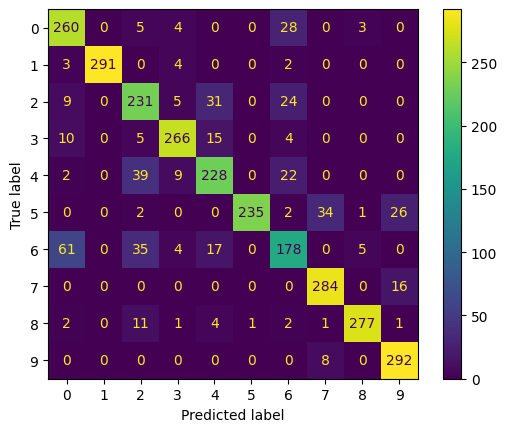

Fold 3:
 Accuracy Score: 0.8416666666666667
 Recall per class: [0.84666667 0.97666667 0.78       0.81333333 0.77333333 0.84666667
 0.54666667 0.93333333 0.93333333 0.96666667]
 Precision per class: [0.72159091 0.97993311 0.72       0.9037037  0.74121406 0.9921875
 0.640625   0.87774295 0.9929078  0.88414634]
 Macro Recall: 0.8416666666666666
 Macro Precision: 0.8454051370260812


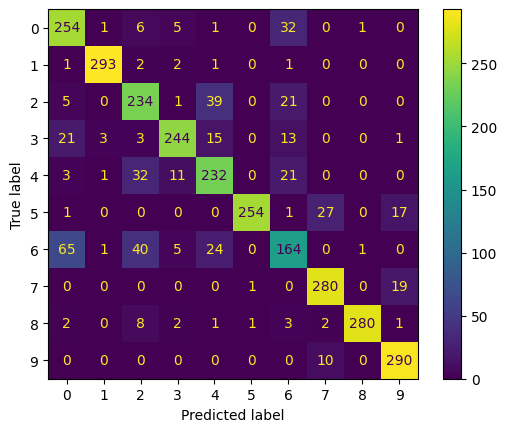

Fold 4:
 Accuracy Score: 0.8496666666666667
 Recall per class: [0.86333333 0.98       0.80666667 0.84       0.76       0.82
 0.55       0.95       0.96       0.96666667]
 Precision per class: [0.72752809 0.98327759 0.7245509  0.91304348 0.7862069  0.98795181
 0.63953488 0.87962963 0.98630137 0.90062112]
 Macro Recall: 0.8496666666666666
 Macro Precision: 0.8528645763331983


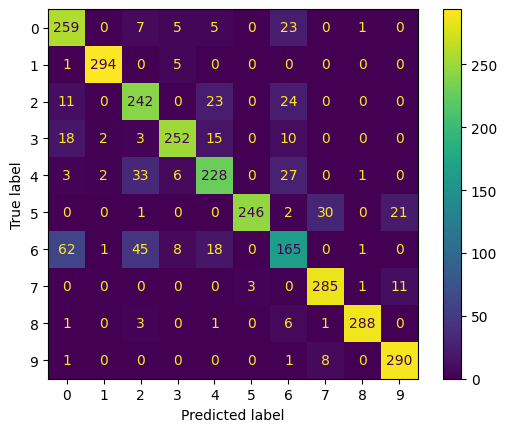

Fold 5:
 Accuracy Score: 0.8476666666666667
 Recall per class: [0.89333333 0.96333333 0.82333333 0.88       0.75333333 0.78333333
 0.53666667 0.94666667 0.94       0.95666667]
 Precision per class: [0.75492958 0.98972603 0.7439759  0.86842105 0.76094276 0.98739496
 0.68220339 0.83284457 0.9825784  0.90251572]
 Macro Recall: 0.8476666666666667
 Macro Precision: 0.850553236512759


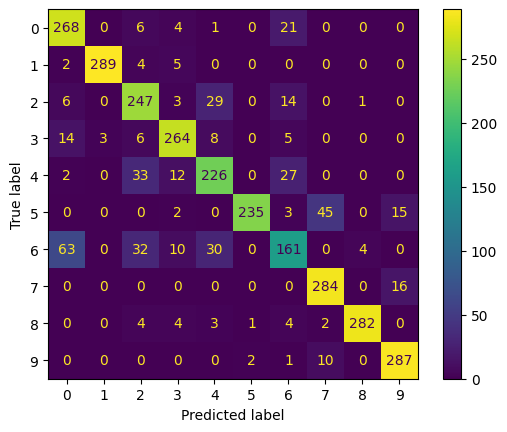

Fold 6:
 Accuracy Score: 0.8413333333333334
 Recall per class: [0.86       0.94666667 0.8        0.87666667 0.72666667 0.77333333
 0.57       0.95666667 0.95       0.95333333]
 Precision per class: [0.76106195 0.99649123 0.69970845 0.90378007 0.77857143 0.98305085
 0.62867647 0.84411765 0.97269625 0.89096573]
 Macro Recall: 0.8413333333333334
 Macro Precision: 0.8459120070008979


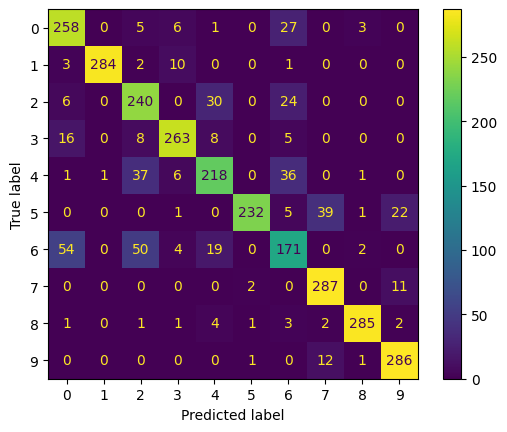

Fold 7:
 Accuracy Score: 0.848
 Recall per class: [0.86333333 0.97       0.80333333 0.85       0.73       0.84333333
 0.53333333 0.95       0.96666667 0.97      ]
 Precision per class: [0.75072464 0.98979592 0.70467836 0.85       0.77659574 1.
 0.6779661  0.87692308 0.96666667 0.90092879]
 Macro Recall: 0.8480000000000001
 Macro Precision: 0.8494279301156776


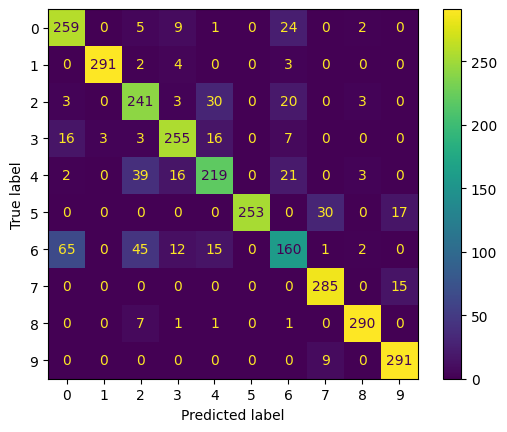

Fold 8:
 Accuracy Score: 0.8433333333333334
 Recall per class: [0.86333333 0.96666667 0.79666667 0.86333333 0.73       0.82
 0.53       0.96       0.92666667 0.97666667]
 Precision per class: [0.7254902  0.99656357 0.71987952 0.91519435 0.72516556 1.
 0.64897959 0.88073394 0.96864111 0.88787879]
 Macro Recall: 0.8433333333333334
 Macro Precision: 0.8468526636889772


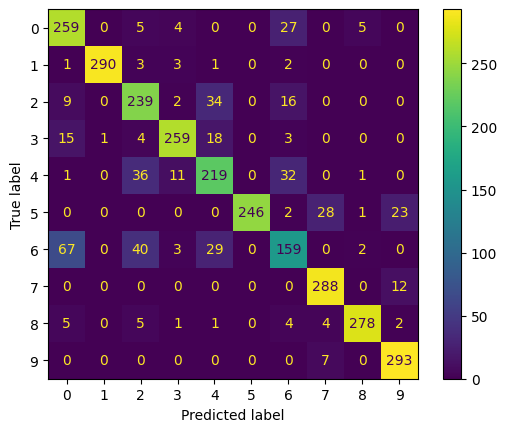

Fold 9:
 Accuracy Score: 0.83
 Recall per class: [0.84       0.96666667 0.80333333 0.84333333 0.76       0.80666667
 0.44       0.94333333 0.93333333 0.96333333]
 Precision per class: [0.72622478 0.98639456 0.6548913  0.89399293 0.76       0.99588477
 0.60273973 0.87345679 0.95890411 0.87575758]
 Macro Recall: 0.8300000000000001
 Macro Precision: 0.8328246554054839


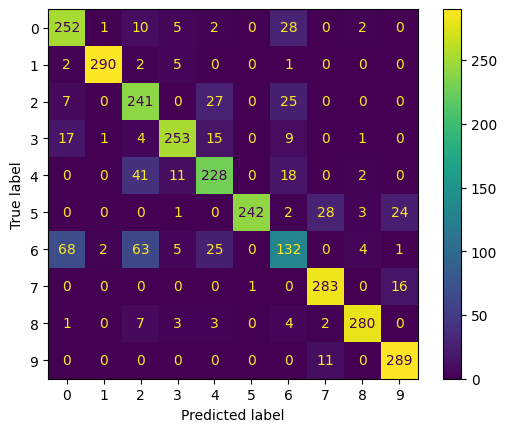

 Fold using k=5 and distance metric = <function euclidean at 0x7e1e2d56f920>
 Total avg Accuracy: 0.8431666666666666
 Total avg Macro Recall: 0.8431666666666668
 Total avg Macro Precision: 0.8464915577336422
Fold 0:
 Accuracy Score: 0.8503333333333334
 Recall per class: [0.88       0.98       0.87333333 0.88666667 0.80666667 0.72
 0.49333333 0.93666667 0.96666667 0.96      ]
 Precision per class: [0.76744186 0.98657718 0.74857143 0.92361111 0.71810089 1.
 0.79569892 0.83382789 0.97315436 0.83236994]
 Macro Recall: 0.8503333333333334
 Macro Precision: 0.8579353594082322


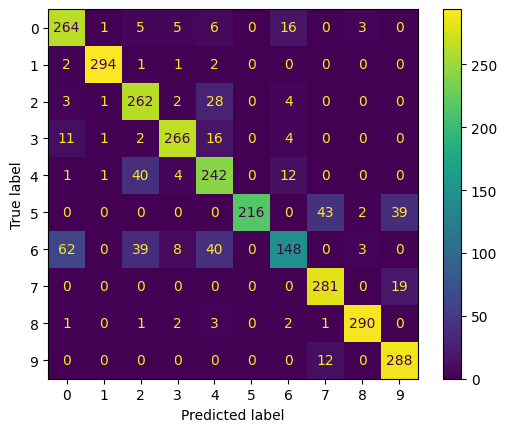

Fold 1:
 Accuracy Score: 0.8356666666666667
 Recall per class: [0.88666667 0.96       0.75666667 0.86333333 0.81333333 0.69666667
 0.52       0.93666667 0.96333333 0.96      ]
 Precision per class: [0.76217765 0.99310345 0.76689189 0.89003436 0.67217631 0.98584906
 0.7255814  0.83382789 0.97306397 0.82285714]
 Macro Recall: 0.8356666666666666
 Macro Precision: 0.8425563124447468


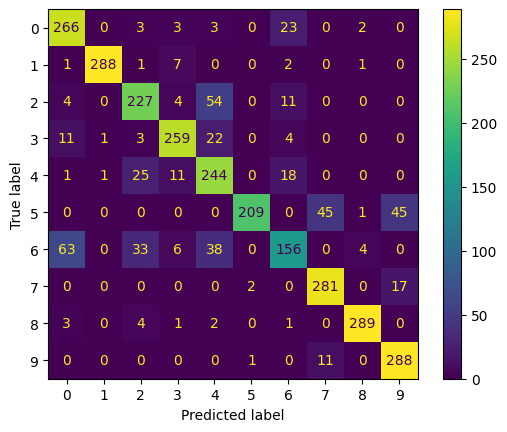

Fold 2:
 Accuracy Score: 0.8463333333333334
 Recall per class: [0.85       0.97666667 0.78333333 0.87       0.89333333 0.69
 0.54666667 0.94333333 0.93333333 0.97666667]
 Precision per class: [0.74780059 0.99322034 0.79391892 0.92553191 0.73626374 1.
 0.70995671 0.8422619  0.96551724 0.81843575]
 Macro Recall: 0.8463333333333333
 Macro Precision: 0.8532907105857456


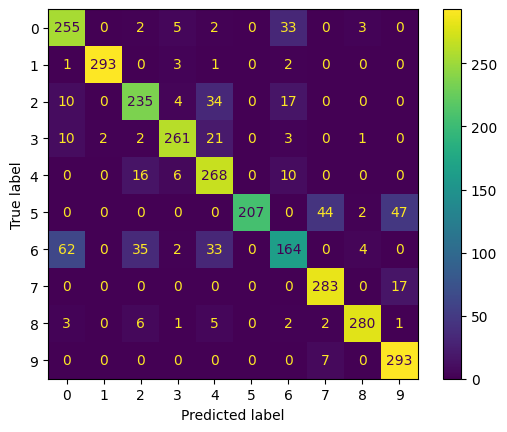

Fold 3:
 Accuracy Score: 0.8523333333333334
 Recall per class: [0.86       0.98333333 0.80333333 0.86       0.85       0.76
 0.53333333 0.94       0.95666667 0.97666667]
 Precision per class: [0.75218659 0.97682119 0.76507937 0.91489362 0.72033898 1.
 0.77294686 0.8597561  0.96959459 0.84927536]
 Macro Recall: 0.8523333333333334
 Macro Precision: 0.8580892660503544


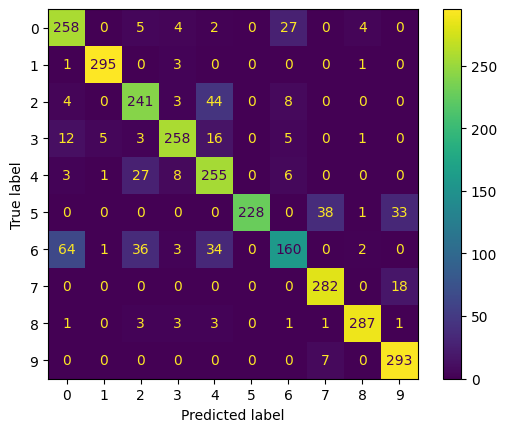

Fold 4:
 Accuracy Score: 0.8553333333333333
 Recall per class: [0.87       0.98666667 0.81       0.87       0.83666667 0.73
 0.55       0.94666667 0.97333333 0.98      ]
 Precision per class: [0.75433526 0.9833887  0.759375   0.91578947 0.75830816 1.
 0.76388889 0.87654321 0.96369637 0.82816901]
 Macro Recall: 0.8553333333333335
 Macro Precision: 0.8603494077705355


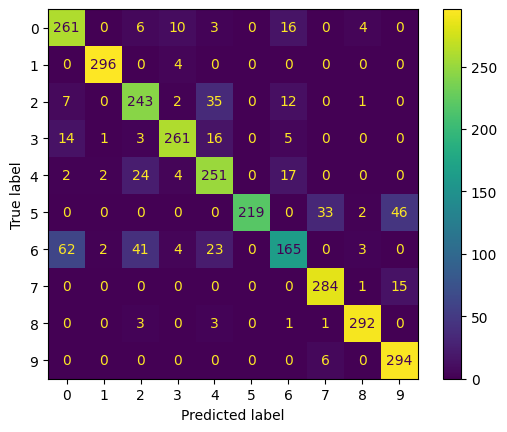

Fold 5:
 Accuracy Score: 0.8536666666666667
 Recall per class: [0.89       0.98       0.84666667 0.89666667 0.8        0.69
 0.56       0.94333333 0.96       0.97      ]
 Precision per class: [0.7829912  0.99324324 0.76276276 0.89368771 0.76190476 1.
 0.760181   0.84477612 0.97627119 0.81741573]
 Macro Recall: 0.8536666666666667
 Macro Precision: 0.8593233709553859


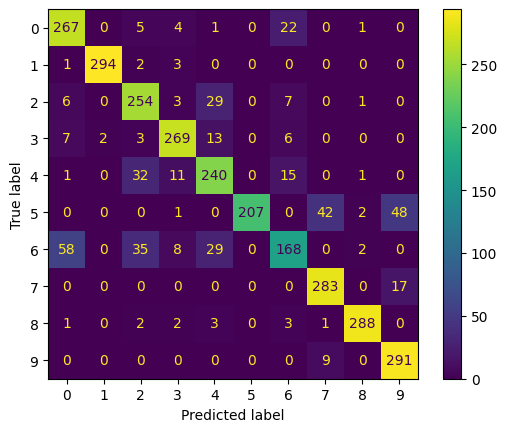

Fold 6:
 Accuracy Score: 0.8506666666666667
 Recall per class: [0.88666667 0.96666667 0.80333333 0.88333333 0.84666667 0.70333333
 0.56       0.93666667 0.96333333 0.95666667]
 Precision per class: [0.77325581 0.99315068 0.74153846 0.93309859 0.76047904 0.99528302
 0.75       0.878125   0.96333333 0.78630137]
 Macro Recall: 0.8506666666666668
 Macro Precision: 0.8574565315953191


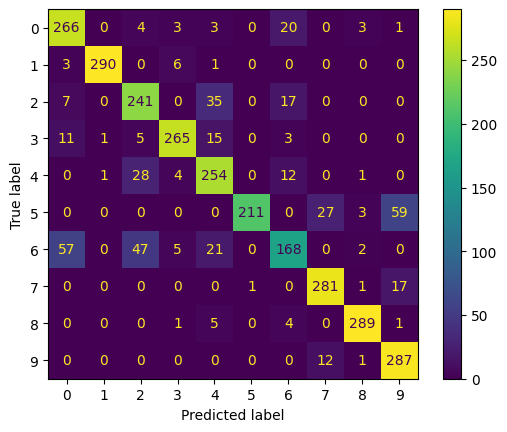

Fold 7:
 Accuracy Score: 0.8456666666666667
 Recall per class: [0.89333333 0.97333333 0.78333333 0.84666667 0.80333333 0.75
 0.53333333 0.92333333 0.97       0.98      ]
 Precision per class: [0.75706215 0.99319728 0.74132492 0.87889273 0.73700306 1.
 0.7239819  0.86833856 0.97651007 0.8258427 ]
 Macro Recall: 0.8456666666666666
 Macro Precision: 0.8502153360797383


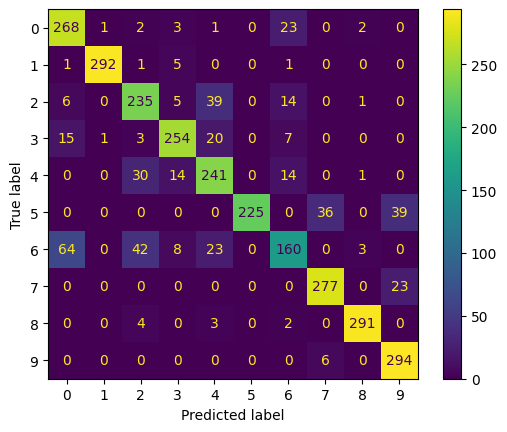

Fold 8:
 Accuracy Score: 0.8463333333333334
 Recall per class: [0.86666667 0.98       0.8        0.87       0.81333333 0.74333333
 0.52333333 0.92666667 0.96       0.98      ]
 Precision per class: [0.74927954 0.98989899 0.77170418 0.92226148 0.70930233 1.
 0.73364486 0.87421384 0.95049505 0.81666667]
 Macro Recall: 0.8463333333333333
 Macro Precision: 0.8517466931011223


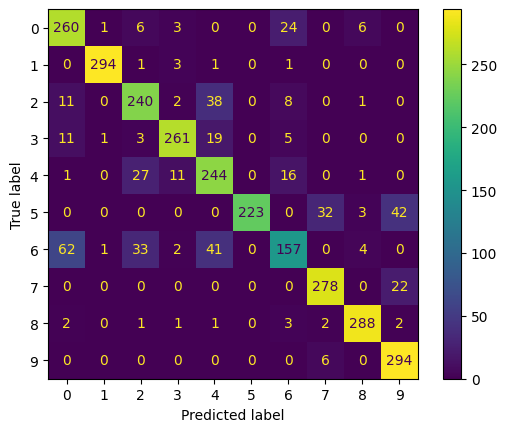

Fold 9:
 Accuracy Score: 0.8356666666666667
 Recall per class: [0.86333333 0.96333333 0.82333333 0.86       0.82       0.67666667
 0.49666667 0.94       0.95       0.96333333]
 Precision per class: [0.75510204 0.9829932  0.71387283 0.91814947 0.74096386 1.
 0.72330097 0.83431953 0.95       0.80952381]
 Macro Recall: 0.8356666666666668
 Macro Precision: 0.8428225699103853


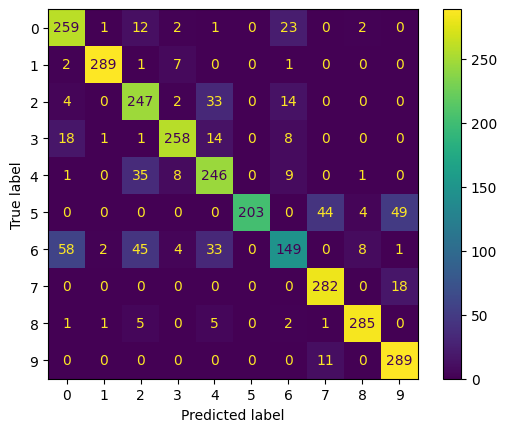

 Fold using k=5 and distance metric = <function cos_distance at 0x7e1e2d56ff60>
 Total avg Accuracy: 0.8472000000000002
 Total avg Macro Recall: 0.8472
 Total avg Macro Precision: 0.8533785557901565
Fold 0:
 Accuracy Score: 0.8486666666666667
 Recall per class: [0.88333333 0.96666667 0.81333333 0.89333333 0.66333333 0.88
 0.52       0.94       0.96333333 0.96333333]
 Precision per class: [0.76589595 0.98976109 0.69318182 0.88448845 0.72101449 0.99622642
 0.67532468 0.8757764  0.9829932  0.90880503]
 Macro Recall: 0.8486666666666667
 Macro Precision: 0.8493467522347717


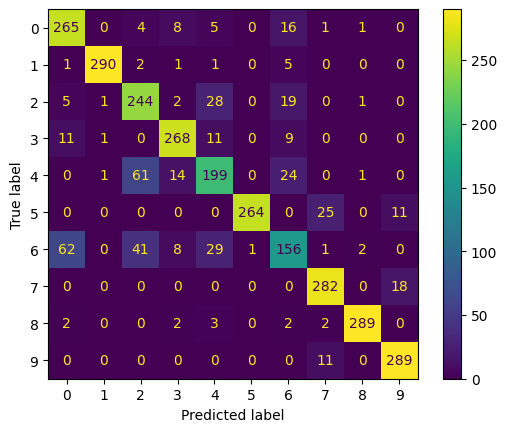

Fold 1:
 Accuracy Score: 0.852
 Recall per class: [0.90666667 0.96       0.79       0.87333333 0.72       0.89666667
 0.52666667 0.95333333 0.94666667 0.94666667]
 Precision per class: [0.76190476 0.98630137 0.72699387 0.89419795 0.74226804 0.98897059
 0.62204724 0.88819876 0.98954704 0.92810458]
 Macro Recall: 0.852
 Macro Precision: 0.8528534193838675


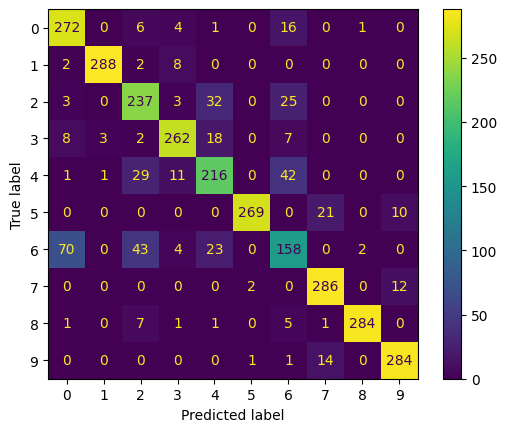

Fold 2:
 Accuracy Score: 0.8473333333333334
 Recall per class: [0.86333333 0.97333333 0.76       0.89333333 0.72333333 0.86333333
 0.56       0.95       0.91666667 0.97      ]
 Precision per class: [0.74855491 0.99319728 0.69512195 0.89333333 0.75347222 0.99233716
 0.66403162 0.87423313 0.97173145 0.90654206]
 Macro Recall: 0.8473333333333335
 Macro Precision: 0.849255511795812


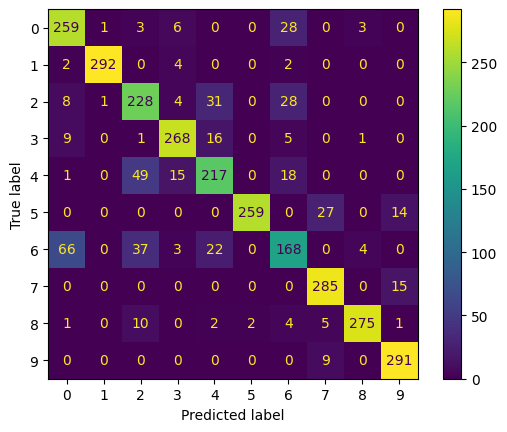

Fold 3:
 Accuracy Score: 0.8493333333333334
 Recall per class: [0.87333333 0.97666667 0.77333333 0.85       0.75666667 0.9
 0.51666667 0.94333333 0.94       0.96333333]
 Precision per class: [0.72176309 0.98653199 0.69461078 0.91071429 0.75666667 0.98181818
 0.67099567 0.88993711 0.97916667 0.92038217]
 Macro Recall: 0.8493333333333333
 Macro Precision: 0.8512586594759355


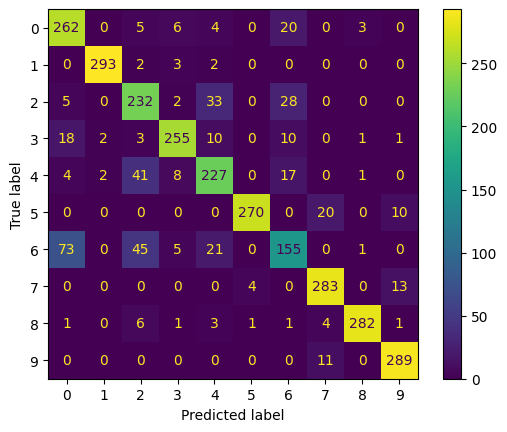

Fold 4:
 Accuracy Score: 0.852
 Recall per class: [0.86333333 0.97666667 0.79333333 0.85       0.76666667 0.87333333
 0.52666667 0.95       0.96666667 0.95333333]
 Precision per class: [0.72346369 0.98653199 0.7345679  0.90106007 0.76666667 0.98496241
 0.65020576 0.890625   0.98639456 0.90793651]
 Macro Recall: 0.852
 Macro Precision: 0.8532414545346985


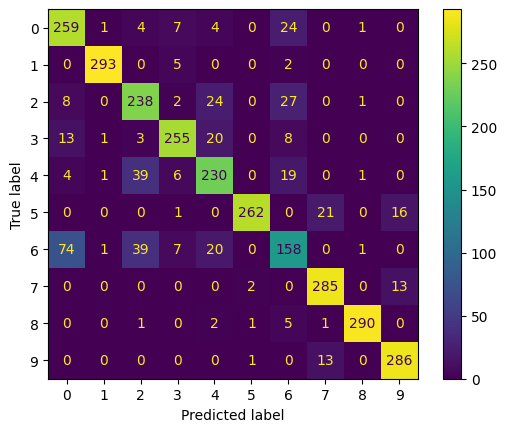

Fold 5:
 Accuracy Score: 0.8516666666666667
 Recall per class: [0.87666667 0.96333333 0.82666667 0.88333333 0.74       0.86
 0.53333333 0.94666667 0.92333333 0.96333333]
 Precision per class: [0.72853186 0.98972603 0.73590504 0.88628763 0.7628866  0.98850575
 0.68965517 0.85800604 0.97535211 0.92628205]
 Macro Recall: 0.8516666666666666
 Macro Precision: 0.8541138277013939


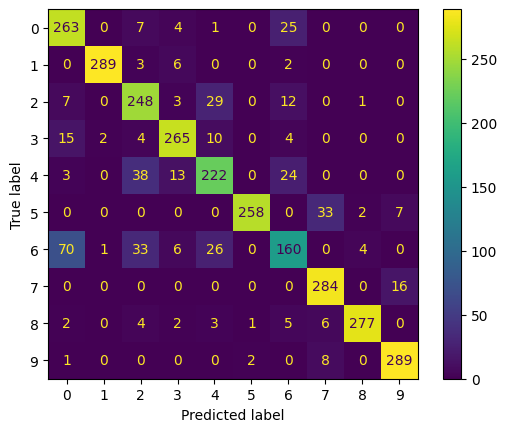

Fold 6:
 Accuracy Score: 0.8506666666666667
 Recall per class: [0.88333333 0.94333333 0.79666667 0.87333333 0.71333333 0.88
 0.55666667 0.96       0.95       0.95      ]
 Precision per class: [0.76589595 0.98951049 0.70294118 0.89115646 0.74825175 0.98141264
 0.66007905 0.88888889 0.9760274  0.91935484]
 Macro Recall: 0.8506666666666666
 Macro Precision: 0.8523518646222529


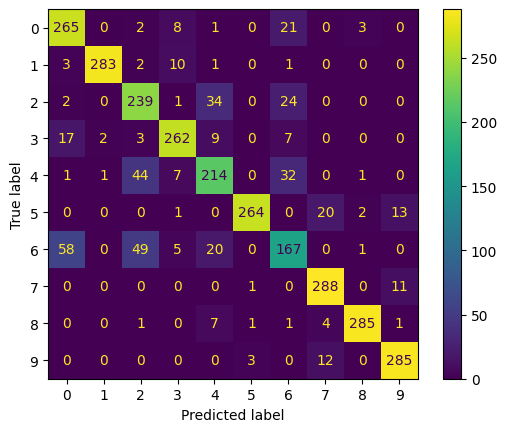

Fold 7:
 Accuracy Score: 0.8523333333333334
 Recall per class: [0.87       0.96666667 0.78333333 0.86       0.74       0.9
 0.51666667 0.94333333 0.97       0.97333333]
 Precision per class: [0.73728814 0.98976109 0.7208589  0.86577181 0.75510204 0.98901099
 0.66523605 0.90996785 0.96357616 0.92405063]
 Macro Recall: 0.8523333333333334
 Macro Precision: 0.8520623654369863


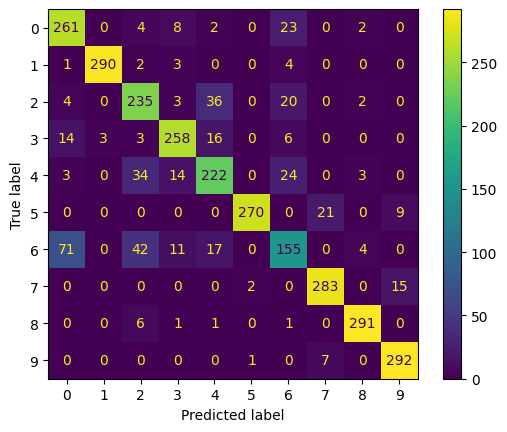

Fold 8:
 Accuracy Score: 0.8513333333333334
 Recall per class: [0.87666667 0.97       0.80333333 0.86666667 0.73       0.87333333
 0.52666667 0.95       0.93666667 0.98      ]
 Precision per class: [0.74293785 0.99317406 0.70882353 0.90277778 0.72516556 0.99242424
 0.70852018 0.90764331 0.95578231 0.89634146]
 Macro Recall: 0.8513333333333334
 Macro Precision: 0.8533590294882396


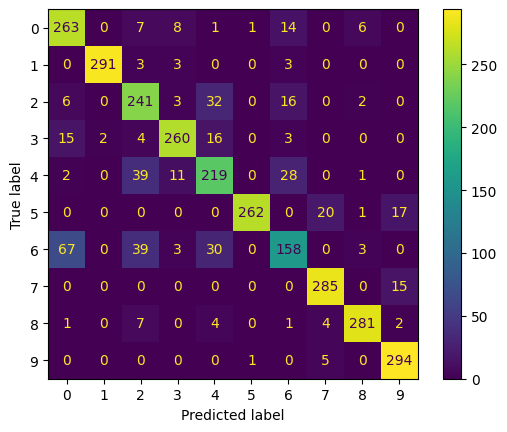

Fold 9:
 Accuracy Score: 0.84
 Recall per class: [0.84666667 0.95666667 0.81333333 0.85       0.74666667 0.88666667
 0.45333333 0.94333333 0.93666667 0.96666667]
 Precision per class: [0.74052478 0.9862543  0.65945946 0.88235294 0.78596491 0.98518519
 0.60714286 0.8984127  0.95578231 0.90909091]
 Macro Recall: 0.8400000000000001
 Macro Precision: 0.8410170352547206


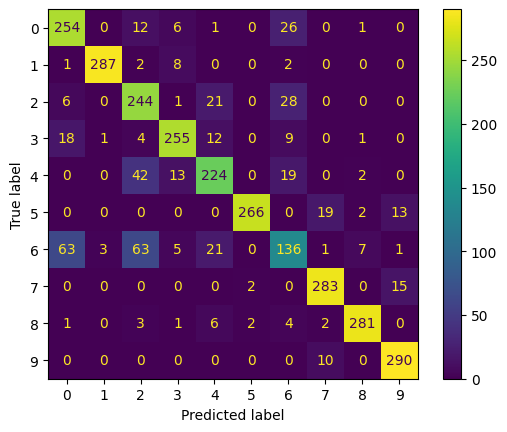

 Fold using k=5 and distance metric = <function manhatan at 0x7e1e35ae6ca0>
 Total avg Accuracy: 0.8495333333333335
 Total avg Macro Recall: 0.8495333333333335
 Total avg Macro Precision: 0.8508859919928679
Fold 0:
 Accuracy Score: 0.8426666666666667
 Recall per class: [0.86666667 0.96333333 0.84333333 0.88333333 0.69333333 0.80666667
 0.52       0.94       0.95       0.96      ]
 Precision per class: [0.7761194  0.98972603 0.72492837 0.89225589 0.70508475 1.
 0.63673469 0.85454545 0.98615917 0.88343558]
 Macro Recall: 0.8426666666666666
 Macro Precision: 0.844898933595838


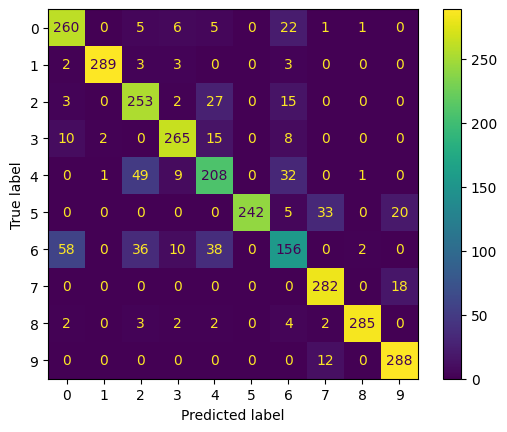

Fold 1:
 Accuracy Score: 0.8373333333333334
 Recall per class: [0.89       0.95       0.76       0.85333333 0.75333333 0.78
 0.55       0.94666667 0.94       0.95      ]
 Precision per class: [0.75423729 0.98958333 0.73548387 0.88581315 0.74342105 0.99152542
 0.60661765 0.8255814  0.99295775 0.89341693]
 Macro Recall: 0.8373333333333332
 Macro Precision: 0.8418637834372209


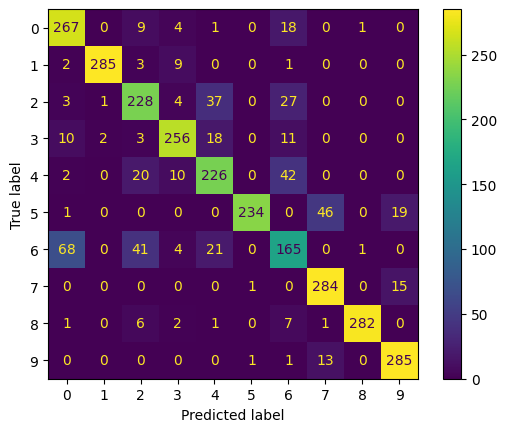

Fold 2:
 Accuracy Score: 0.8443333333333334
 Recall per class: [0.85666667 0.97333333 0.76       0.89       0.76666667 0.78666667
 0.58333333 0.94333333 0.91333333 0.97      ]
 Precision per class: [0.74063401 1.         0.71698113 0.90816327 0.76666667 0.99159664
 0.65789474 0.85757576 0.96819788 0.87650602]
 Macro Recall: 0.8443333333333334
 Macro Precision: 0.8484216106840318


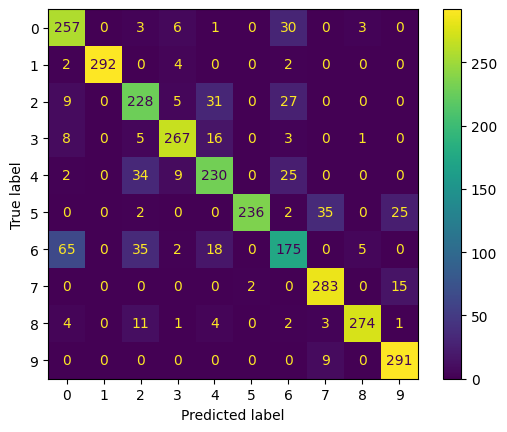

Fold 3:
 Accuracy Score: 0.841
 Recall per class: [0.86333333 0.97666667 0.78333333 0.82333333 0.76       0.82666667
 0.54333333 0.93666667 0.93666667 0.96      ]
 Precision per class: [0.73789174 0.98322148 0.73208723 0.88530466 0.74509804 0.98804781
 0.63921569 0.85932722 0.98251748 0.88343558]
 Macro Recall: 0.841
 Macro Precision: 0.843614691803443


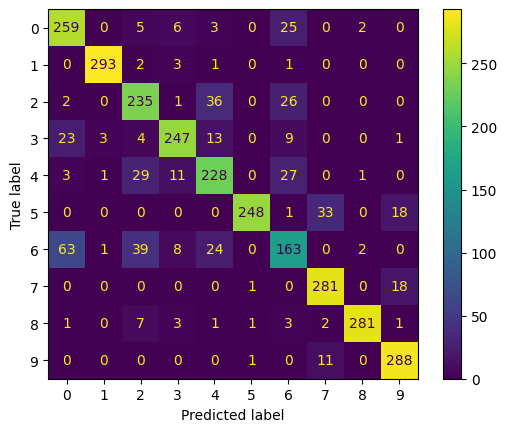

Fold 4:
 Accuracy Score: 0.8493333333333334
 Recall per class: [0.85666667 0.98       0.8        0.85       0.76       0.8
 0.58333333 0.94666667 0.95666667 0.96      ]
 Precision per class: [0.73850575 0.98657718 0.71856287 0.90425532 0.7972028  0.99173554
 0.65298507 0.86060606 0.98965517 0.89440994]
 Macro Recall: 0.8493333333333333
 Macro Precision: 0.8534495701662722


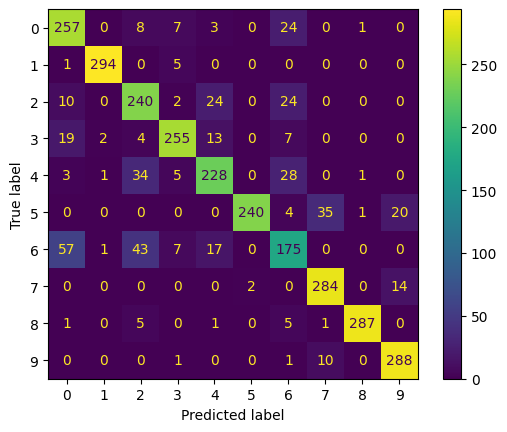

Fold 5:
 Accuracy Score: 0.848
 Recall per class: [0.89       0.96333333 0.83333333 0.87       0.77       0.78
 0.52666667 0.95       0.93       0.96666667]
 Precision per class: [0.73961219 0.99312715 0.74850299 0.87       0.77516779 0.98319328
 0.67521368 0.84821429 0.98239437 0.89506173]
 Macro Recall: 0.8479999999999999
 Macro Precision: 0.8510487448209979


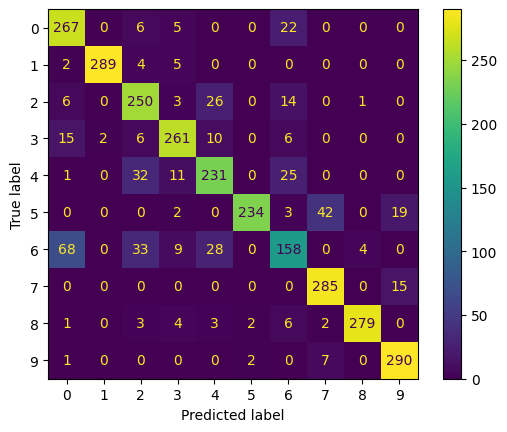

Fold 6:
 Accuracy Score: 0.8406666666666667
 Recall per class: [0.87666667 0.94333333 0.79333333 0.87       0.74       0.77
 0.55333333 0.95666667 0.95333333 0.95      ]
 Precision per class: [0.75574713 0.99298246 0.72121212 0.90311419 0.7844523  0.98297872
 0.59927798 0.84164223 0.97610922 0.89341693]
 Macro Recall: 0.8406666666666667
 Macro Precision: 0.8450933260859612


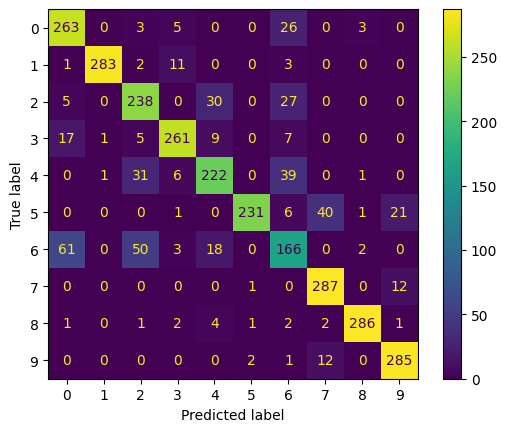

Fold 7:
 Accuracy Score: 0.843
 Recall per class: [0.86666667 0.96666667 0.77666667 0.84666667 0.73       0.83
 0.53       0.94666667 0.96333333 0.97333333]
 Precision per class: [0.76470588 0.98976109 0.69139466 0.85521886 0.7630662  0.996
 0.64634146 0.87384615 0.96655518 0.89570552]
 Macro Recall: 0.843
 Macro Precision: 0.8442595013245937


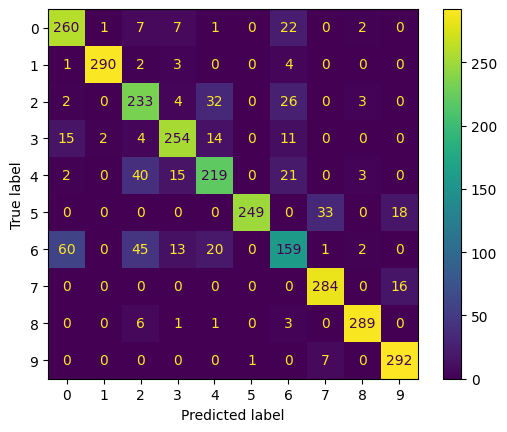

Fold 8:
 Accuracy Score: 0.8463333333333334
 Recall per class: [0.87333333 0.96333333 0.79333333 0.87       0.72333333 0.82
 0.57       0.94666667 0.92333333 0.98      ]
 Precision per class: [0.74857143 0.98634812 0.72121212 0.90940767 0.74827586 1.
 0.66023166 0.89028213 0.96180556 0.86982249]
 Macro Recall: 0.8463333333333335
 Macro Precision: 0.8495957032880395


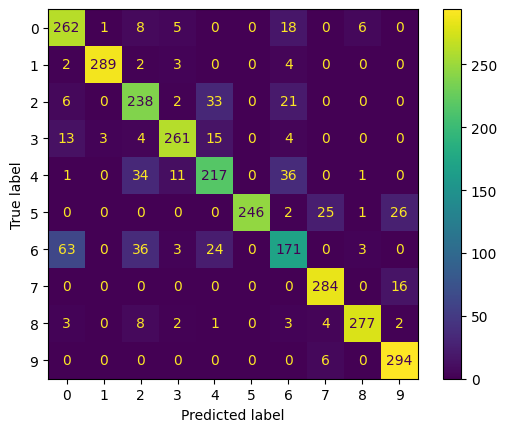

Fold 9:
 Accuracy Score: 0.8256666666666667
 Recall per class: [0.84333333 0.95666667 0.78333333 0.83333333 0.73333333 0.78333333
 0.48333333 0.94333333 0.93       0.96666667]
 Precision per class: [0.73760933 0.9862543  0.64738292 0.88339223 0.75862069 0.99156118
 0.60165975 0.86018237 0.95547945 0.87613293]
 Macro Recall: 0.8256666666666665
 Macro Precision: 0.8298275146753488


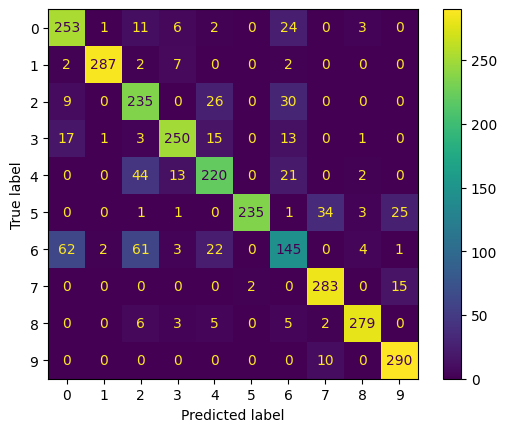

 Fold using k=7 and distance metric = <function euclidean at 0x7e1e2d56f920>
 Total avg Accuracy: 0.8418333333333334
 Total avg Macro Recall: 0.8418333333333333
 Total avg Macro Precision: 0.8452073379881746
Fold 0:
 Accuracy Score: 0.843
 Recall per class: [0.86333333 0.97666667 0.85333333 0.89       0.80333333 0.69
 0.48666667 0.94       0.96666667 0.96      ]
 Precision per class: [0.75072464 0.98986486 0.7641791  0.92387543 0.70674487 1.
 0.74111675 0.82697947 0.97315436 0.82051282]
 Macro Recall: 0.843
 Macro Precision: 0.8497152313923506


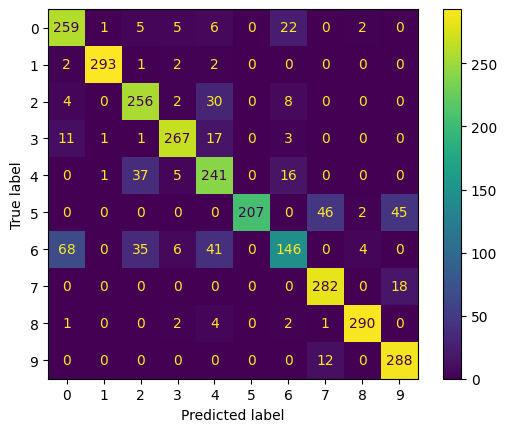

Fold 1:
 Accuracy Score: 0.8363333333333334
 Recall per class: [0.89666667 0.96       0.75666667 0.86666667 0.83333333 0.67666667
 0.52333333 0.92666667 0.96333333 0.96      ]
 Precision per class: [0.76857143 0.99653979 0.79094077 0.88737201 0.69444444 0.98543689
 0.70089286 0.81764706 0.97306397 0.81355932]
 Macro Recall: 0.8363333333333334
 Macro Precision: 0.8428468549873959


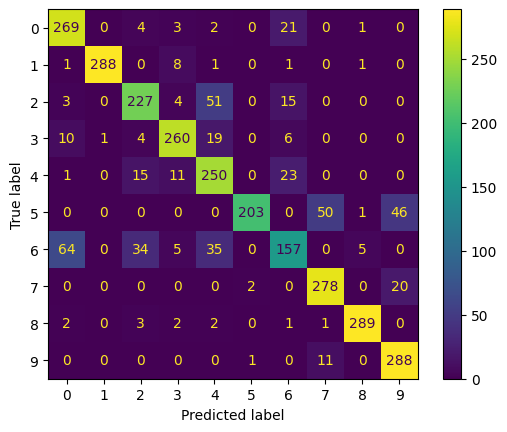

Fold 2:
 Accuracy Score: 0.845
 Recall per class: [0.87333333 0.97333333 0.75666667 0.88       0.89333333 0.66666667
 0.54333333 0.93666667 0.94666667 0.98      ]
 Precision per class: [0.75942029 0.99319728 0.80496454 0.93286219 0.71849866 1.
 0.71806167 0.83880597 0.96271186 0.80327869]
 Macro Recall: 0.845
 Macro Precision: 0.853180115519331


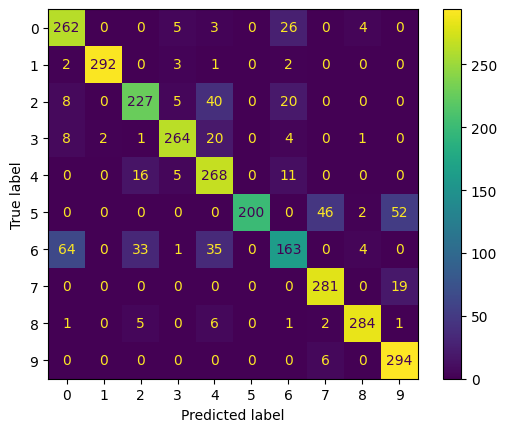

Fold 3:
 Accuracy Score: 0.8483333333333334
 Recall per class: [0.86333333 0.98333333 0.8        0.85666667 0.86       0.72333333
 0.52666667 0.93666667 0.95333333 0.98      ]
 Precision per class: [0.74855491 0.98006645 0.76923077 0.92446043 0.71866295 1.
 0.76328502 0.8489426  0.96949153 0.83050847]
 Macro Recall: 0.8483333333333334
 Macro Precision: 0.8553203134351108


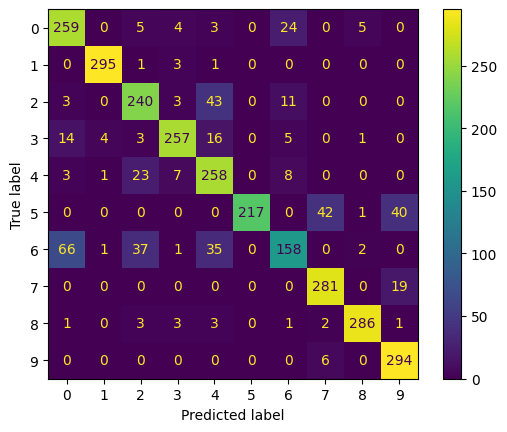

Fold 4:
 Accuracy Score: 0.847
 Recall per class: [0.86       0.98333333 0.81       0.86333333 0.83333333 0.7
 0.52666667 0.94666667 0.97333333 0.97333333]
 Precision per class: [0.73925501 0.98333333 0.77884615 0.90877193 0.75987842 1.
 0.70535714 0.85800604 0.96369637 0.81792717]
 Macro Recall: 0.8470000000000001
 Macro Precision: 0.851507157644211


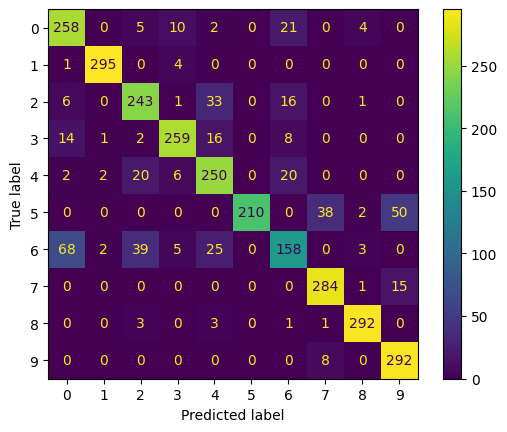

Fold 5:
 Accuracy Score: 0.8463333333333334
 Recall per class: [0.89       0.97       0.82       0.9        0.83333333 0.65666667
 0.52666667 0.93       0.96333333 0.97333333]
 Precision per class: [0.7716763  0.99317406 0.78594249 0.9        0.74404762 1.
 0.72477064 0.83783784 0.97635135 0.79347826]
 Macro Recall: 0.8463333333333333
 Macro Precision: 0.8527278565332468


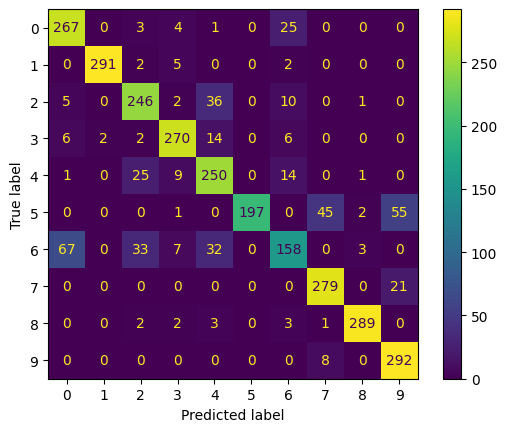

Fold 6:
 Accuracy Score: 0.8526666666666667
 Recall per class: [0.9        0.96333333 0.81333333 0.88666667 0.85       0.69
 0.56333333 0.93       0.96333333 0.96666667]
 Precision per class: [0.77809798 0.98972603 0.7672956  0.93661972 0.76347305 0.99519231
 0.75111111 0.88291139 0.95695364 0.77540107]
 Macro Recall: 0.8526666666666667
 Macro Precision: 0.859678190290385


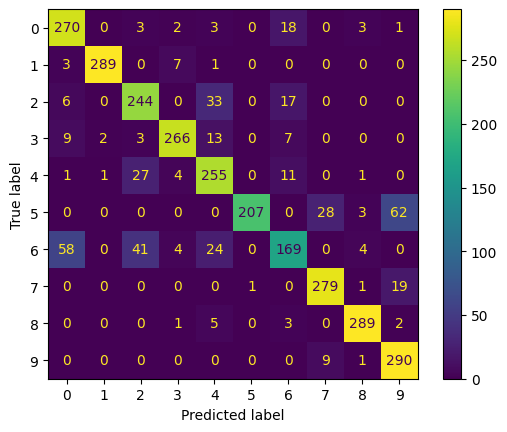

Fold 7:
 Accuracy Score: 0.8493333333333334
 Recall per class: [0.91       0.97       0.8        0.84666667 0.82       0.72
 0.53       0.93333333 0.97333333 0.99      ]
 Precision per class: [0.76256983 0.99317406 0.75       0.88501742 0.74096386 1.
 0.76442308 0.875      0.96369637 0.81818182]
 Macro Recall: 0.8493333333333333
 Macro Precision: 0.8553026435602014


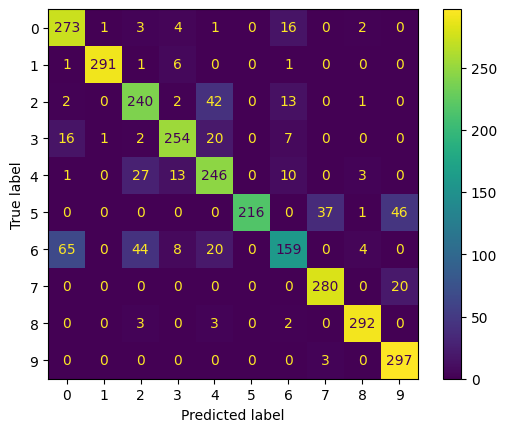

Fold 8:
 Accuracy Score: 0.844
 Recall per class: [0.88       0.98       0.77666667 0.87666667 0.82       0.71666667
 0.52333333 0.92333333 0.96333333 0.98      ]
 Precision per class: [0.75213675 0.98989899 0.78187919 0.92932862 0.68715084 1.
 0.75119617 0.86292835 0.95379538 0.80547945]
 Macro Recall: 0.844
 Macro Precision: 0.8513793749314779


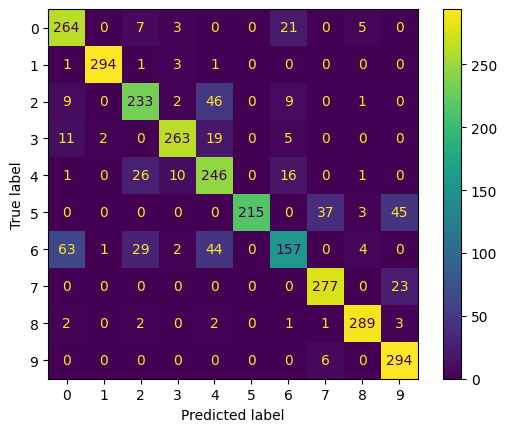

Fold 9:
 Accuracy Score: 0.832
 Recall per class: [0.83333333 0.96       0.81       0.86666667 0.83       0.67
 0.48666667 0.94666667 0.95       0.96666667]
 Precision per class: [0.75075075 0.97959184 0.71260997 0.90909091 0.7388724  1.
 0.68544601 0.84272997 0.95637584 0.80555556]
 Macro Recall: 0.8320000000000001
 Macro Precision: 0.8381023245009482


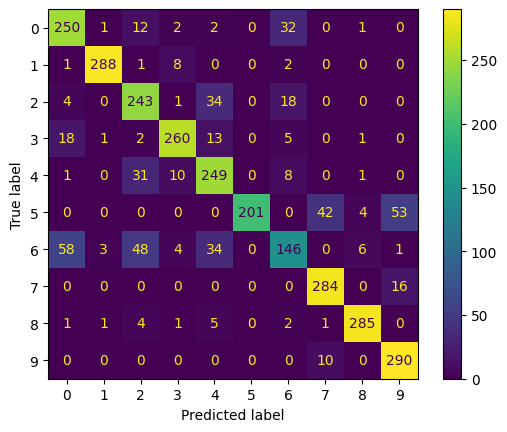

 Fold using k=7 and distance metric = <function cos_distance at 0x7e1e2d56ff60>
 Total avg Accuracy: 0.8444
 Total avg Macro Recall: 0.8444
 Total avg Macro Precision: 0.8509760062794658
Fold 0:
 Accuracy Score: 0.8523333333333334
 Recall per class: [0.86666667 0.97       0.83333333 0.89333333 0.7        0.87666667
 0.52333333 0.94666667 0.94666667 0.96666667]
 Precision per class: [0.76023392 0.98979592 0.71225071 0.88157895 0.72916667 0.99245283
 0.68859649 0.88198758 0.98269896 0.9148265 ]
 Macro Recall: 0.8523333333333334
 Macro Precision: 0.8533588522198732


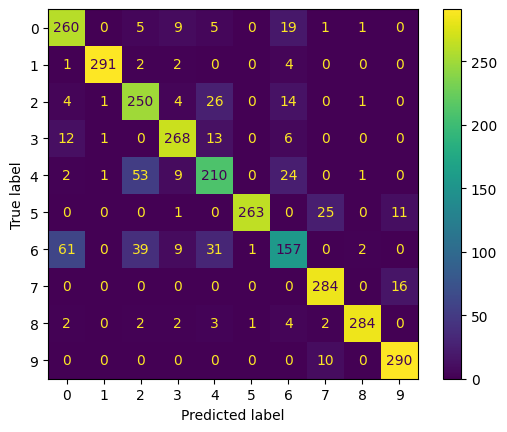

Fold 1:
 Accuracy Score: 0.8463333333333334
 Recall per class: [0.89666667 0.95       0.76333333 0.87       0.74       0.88333333
 0.53333333 0.94333333 0.93333333 0.95      ]
 Precision per class: [0.74722222 0.98615917 0.74592834 0.8877551  0.7254902  0.98880597
 0.61776062 0.87616099 0.98591549 0.91935484]
 Macro Recall: 0.8463333333333333
 Macro Precision: 0.8480552938943229


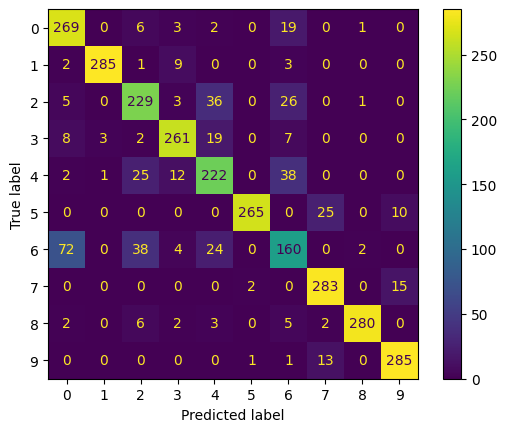

Fold 2:
 Accuracy Score: 0.8463333333333334
 Recall per class: [0.88       0.97       0.75333333 0.9        0.75333333 0.84333333
 0.54333333 0.95       0.9        0.97      ]
 Precision per class: [0.74157303 1.         0.71518987 0.90909091 0.74098361 0.99215686
 0.66260163 0.85843373 0.96428571 0.90372671]
 Macro Recall: 0.8463333333333335
 Macro Precision: 0.8488042068835238


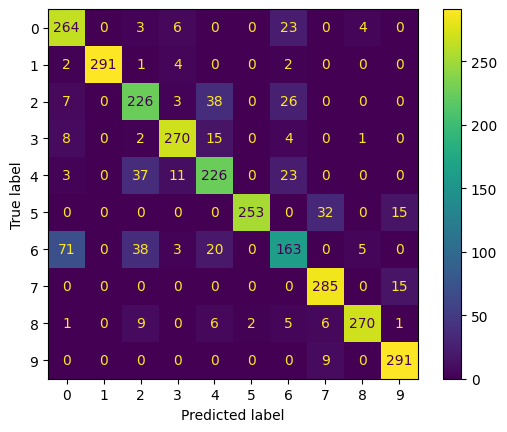

Fold 3:
 Accuracy Score: 0.8503333333333334
 Recall per class: [0.87666667 0.97666667 0.77333333 0.85333333 0.78333333 0.89
 0.52       0.93       0.94       0.96      ]
 Precision per class: [0.72252747 0.98986486 0.72955975 0.89824561 0.76298701 0.97445255
 0.66666667 0.88012618 0.9825784  0.90851735]
 Macro Recall: 0.8503333333333334
 Macro Precision: 0.8515525864588875


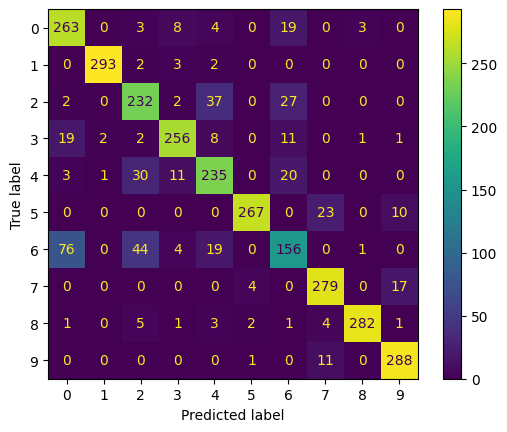

Fold 4:
 Accuracy Score: 0.8516666666666667
 Recall per class: [0.87       0.98       0.80333333 0.86333333 0.75333333 0.85
 0.53       0.94666667 0.96666667 0.95333333]
 Precision per class: [0.72905028 0.98657718 0.72809668 0.89619377 0.77133106 0.98837209
 0.67659574 0.87654321 0.97972973 0.89937107]
 Macro Recall: 0.8516666666666668
 Macro Precision: 0.8531860813414369


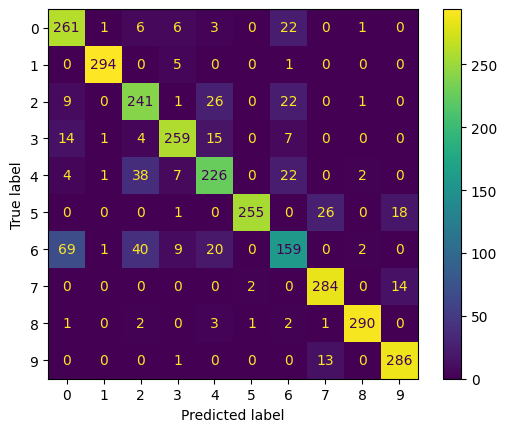

Fold 5:
 Accuracy Score: 0.8526666666666667
 Recall per class: [0.88333333 0.96       0.82       0.88666667 0.75666667 0.85666667
 0.51666667 0.94333333 0.94       0.96333333]
 Precision per class: [0.73611111 0.98630137 0.75460123 0.87788779 0.77739726 0.98467433
 0.65400844 0.86809816 0.97577855 0.92038217]
 Macro Recall: 0.8526666666666666
 Macro Precision: 0.8535240397168422


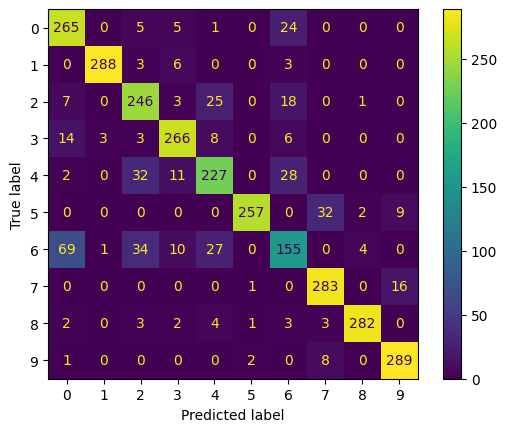

Fold 6:
 Accuracy Score: 0.8506666666666667
 Recall per class: [0.85666667 0.94333333 0.79333333 0.88       0.74       0.86666667
 0.57333333 0.95666667 0.95       0.94666667]
 Precision per class: [0.76261128 0.98951049 0.71686747 0.90102389 0.77622378 0.98484848
 0.63468635 0.88307692 0.97269625 0.90734824]
 Macro Recall: 0.8506666666666668
 Macro Precision: 0.8528893145697325


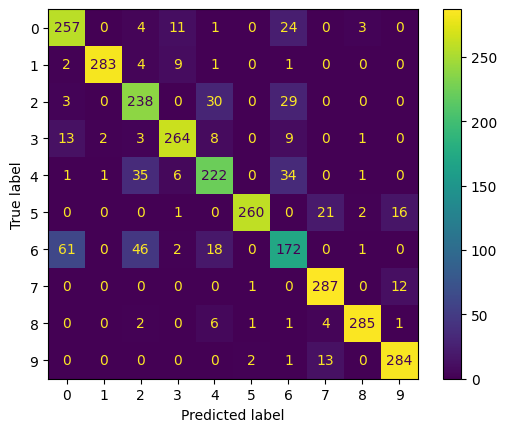

Fold 7:
 Accuracy Score: 0.8506666666666667
 Recall per class: [0.89       0.96333333 0.76666667 0.87       0.72666667 0.88666667
 0.52       0.94333333 0.96666667 0.97333333]
 Precision per class: [0.75       0.99312715 0.72100313 0.85855263 0.75432526 0.99253731
 0.65822785 0.90705128 0.95394737 0.9125    ]
 Macro Recall: 0.8506666666666666
 Macro Precision: 0.8501271985663517


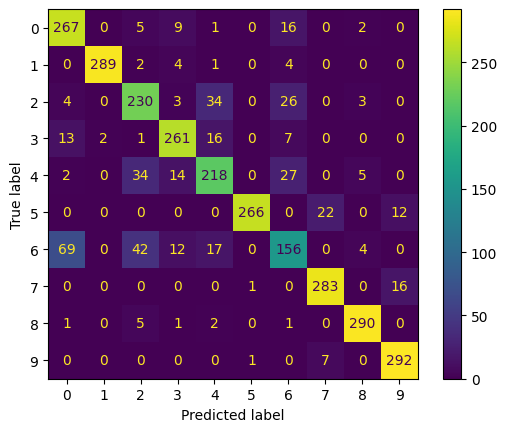

Fold 8:
 Accuracy Score: 0.8446666666666667
 Recall per class: [0.87       0.96666667 0.77333333 0.86333333 0.70666667 0.86666667
 0.54       0.95       0.93333333 0.97666667]
 Precision per class: [0.74571429 0.99315068 0.71384615 0.89930556 0.69508197 0.98484848
 0.68067227 0.890625   0.9556314  0.90153846]
 Macro Recall: 0.8446666666666667
 Macro Precision: 0.8460414261872533


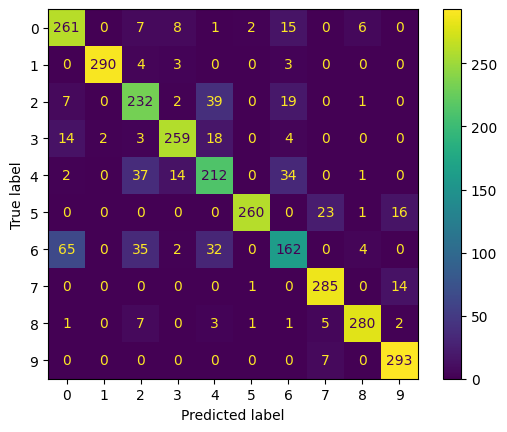

Fold 9:
 Accuracy Score: 0.8376666666666667
 Recall per class: [0.86       0.95333333 0.79333333 0.87       0.72       0.87666667
 0.46       0.94333333 0.93333333 0.96666667]
 Precision per class: [0.74566474 0.9862069  0.64850136 0.87878788 0.76595745 0.98501873
 0.63013699 0.88993711 0.9556314  0.90342679]
 Macro Recall: 0.8376666666666667
 Macro Precision: 0.838926933483636


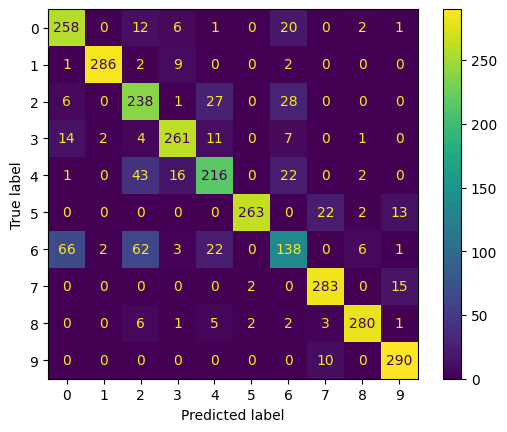

 Fold using k=7 and distance metric = <function manhatan at 0x7e1e35ae6ca0>
 Total avg Accuracy: 0.8483333333333334
 Total avg Macro Recall: 0.8483333333333334
 Total avg Macro Precision: 0.8496465933321862
Fold 0:
 Accuracy Score: 0.8406666666666667
 Recall per class: [0.86666667 0.96666667 0.83333333 0.89666667 0.70666667 0.78
 0.51666667 0.93666667 0.94666667 0.95666667]
 Precision per class: [0.76696165 0.99315068 0.73313783 0.89072848 0.71621622 1.
 0.63786008 0.83136095 0.98611111 0.87767584]
 Macro Recall: 0.8406666666666667
 Macro Precision: 0.8433202840938137


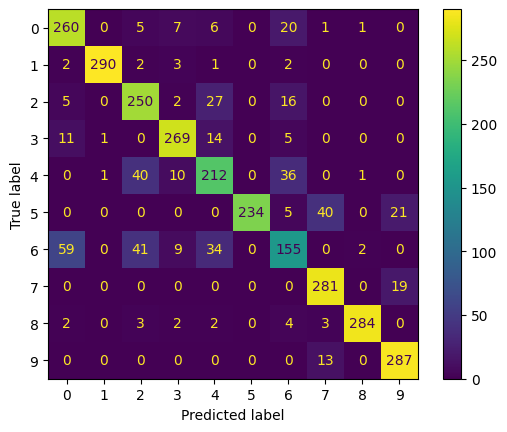

Fold 1:
 Accuracy Score: 0.8346666666666667
 Recall per class: [0.88       0.95       0.76666667 0.84666667 0.74       0.78333333
 0.53666667 0.95       0.94       0.95333333]
 Precision per class: [0.74157303 0.98958333 0.73954984 0.88501742 0.73754153 0.99156118
 0.58759124 0.83333333 0.99646643 0.89096573]
 Macro Recall: 0.8346666666666666
 Macro Precision: 0.8393183074937964


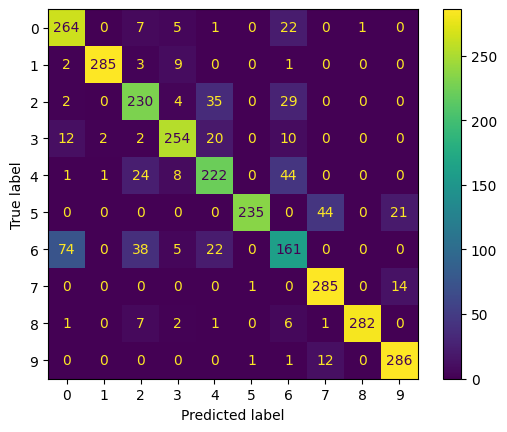

Fold 2:
 Accuracy Score: 0.8413333333333334
 Recall per class: [0.87333333 0.97333333 0.75       0.88666667 0.78666667 0.77333333
 0.54666667 0.95       0.90666667 0.96666667]
 Precision per class: [0.72176309 1.         0.72115385 0.91408935 0.76129032 0.98305085
 0.65079365 0.85843373 0.97491039 0.87087087]
 Macro Recall: 0.8413333333333333
 Macro Precision: 0.845635609954012


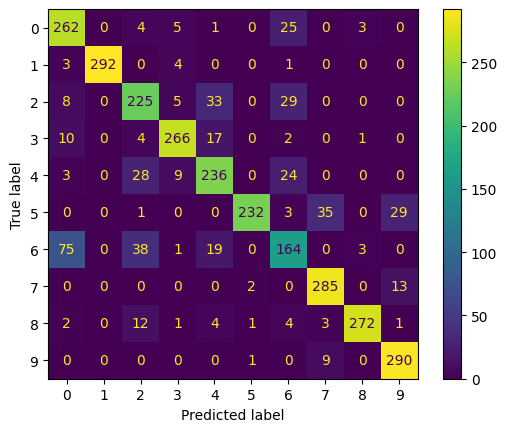

Fold 3:
 Accuracy Score: 0.8406666666666667
 Recall per class: [0.86333333 0.97666667 0.78666667 0.82666667 0.77333333 0.80333333
 0.54       0.93666667 0.93666667 0.96333333]
 Precision per class: [0.74425287 0.97993311 0.72615385 0.88256228 0.76065574 0.99176955
 0.648      0.84384384 0.97909408 0.87841945]
 Macro Recall: 0.8406666666666667
 Macro Precision: 0.8434684766081484


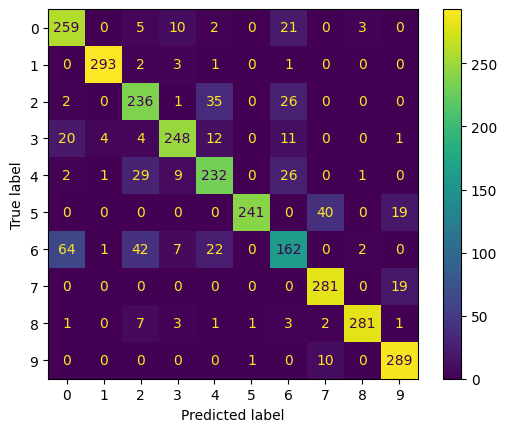

Fold 4:
 Accuracy Score: 0.8446666666666667
 Recall per class: [0.86       0.98       0.79666667 0.86       0.74333333 0.79666667
 0.55333333 0.94666667 0.95       0.96      ]
 Precision per class: [0.72881356 0.98657718 0.71556886 0.91166078 0.80505415 0.98760331
 0.61254613 0.85800604 0.98958333 0.89440994]
 Macro Recall: 0.8446666666666667
 Macro Precision: 0.8489823276579228


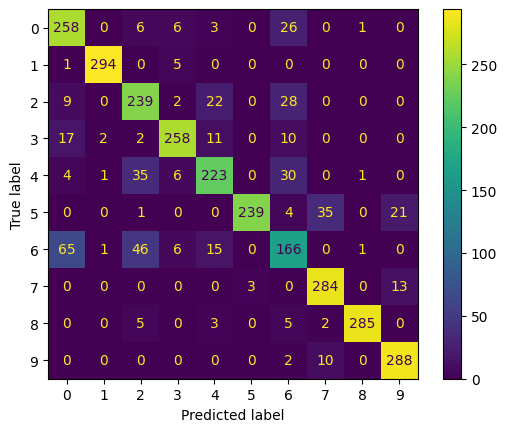

Fold 5:
 Accuracy Score: 0.8493333333333334
 Recall per class: [0.91333333 0.96333333 0.81333333 0.87666667 0.77       0.78666667
 0.53333333 0.94       0.93666667 0.96      ]
 Precision per class: [0.74054054 0.99312715 0.75308642 0.87666667 0.78571429 0.97520661
 0.67510549 0.84939759 0.97909408 0.89164087]
 Macro Recall: 0.8493333333333333
 Macro Precision: 0.8519579691132781


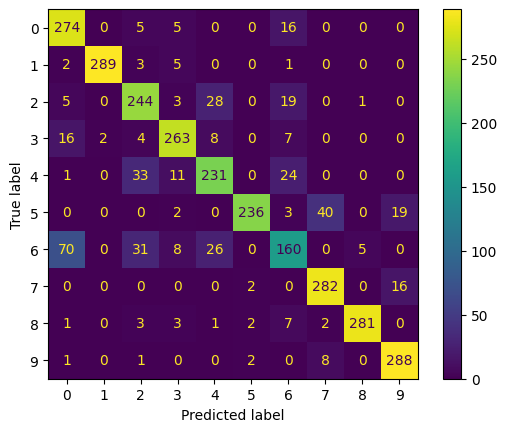

Fold 6:
 Accuracy Score: 0.8406666666666667
 Recall per class: [0.87333333 0.94       0.79666667 0.87666667 0.74333333 0.77333333
 0.54666667 0.95666667 0.94666667 0.95333333]
 Precision per class: [0.75942029 0.98947368 0.72865854 0.87959866 0.77700348 0.98723404
 0.60740741 0.84660767 0.97594502 0.89096573]
 Macro Recall: 0.8406666666666667
 Macro Precision: 0.8442314526025356


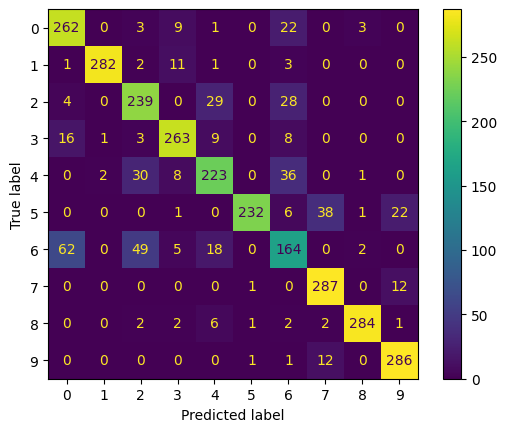

Fold 7:
 Accuracy Score: 0.843
 Recall per class: [0.86333333 0.96666667 0.78666667 0.85       0.74       0.82
 0.52       0.94666667 0.96333333 0.97333333]
 Precision per class: [0.75953079 0.99315068 0.70447761 0.86734694 0.7628866  1.
 0.62903226 0.87384615 0.96013289 0.89296636]
 Macro Recall: 0.843
 Macro Precision: 0.8443370288506704


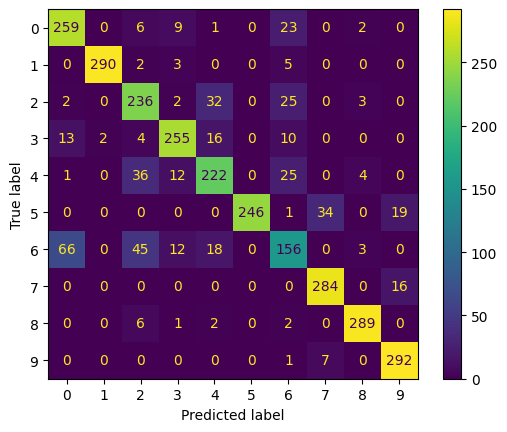

Fold 8:
 Accuracy Score: 0.8463333333333334
 Recall per class: [0.87666667 0.96666667 0.79       0.87       0.72333333 0.81
 0.57333333 0.94666667 0.92666667 0.98      ]
 Precision per class: [0.76011561 0.98305085 0.72036474 0.91258741 0.74570447 0.99590164
 0.66153846 0.8847352  0.95532646 0.87240356]
 Macro Recall: 0.8463333333333333
 Macro Precision: 0.8491728400663641


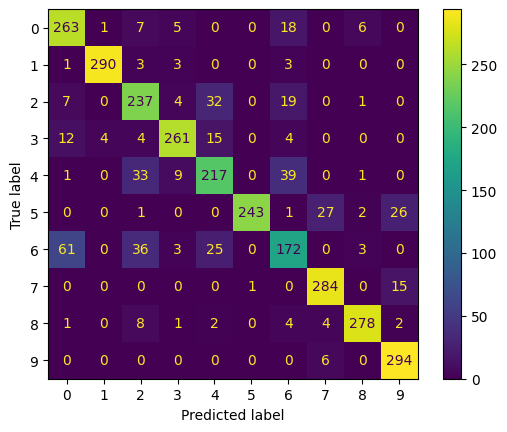

Fold 9:
 Accuracy Score: 0.8266666666666667
 Recall per class: [0.85666667 0.96       0.78       0.83       0.73666667 0.79333333
 0.48333333 0.93666667 0.92666667 0.96333333]
 Precision per class: [0.73850575 0.98293515 0.65915493 0.90217391 0.75684932 1.
 0.58467742 0.86728395 0.95532646 0.86268657]
 Macro Recall: 0.8266666666666668
 Macro Precision: 0.8309593456016893


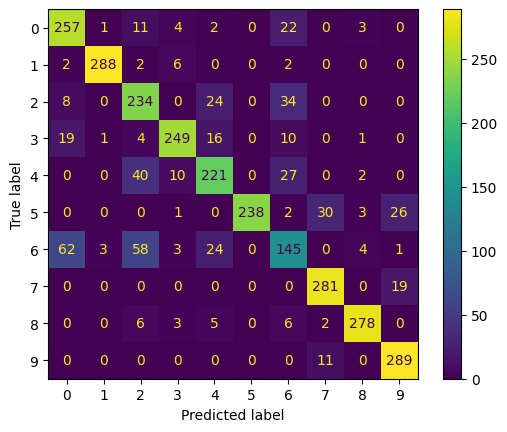

 Fold using k=9 and distance metric = <function euclidean at 0x7e1e2d56f920>
 Total avg Accuracy: 0.8408
 Total avg Macro Recall: 0.8408
 Total avg Macro Precision: 0.8441383642042231
Fold 0:
 Accuracy Score: 0.8416666666666667
 Recall per class: [0.88333333 0.97666667 0.84333333 0.89       0.81       0.67333333
 0.49       0.93333333 0.95666667 0.96      ]
 Precision per class: [0.75284091 0.98653199 0.7808642  0.91752577 0.69428571 1.
 0.765625   0.82840237 0.97619048 0.8       ]
 Macro Recall: 0.8416666666666668
 Macro Precision: 0.8502266423689733


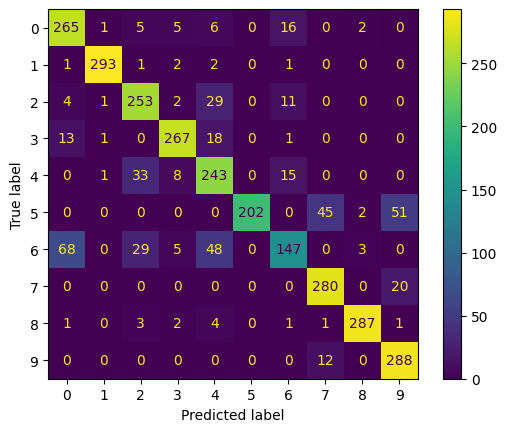

Fold 1:
 Accuracy Score: 0.8316666666666667
 Recall per class: [0.89666667 0.95666667 0.76666667 0.86666667 0.83333333 0.64666667
 0.51       0.92666667 0.96       0.95333333]
 Precision per class: [0.75561798 0.99652778 0.77702703 0.89655172 0.68870523 0.98477157
 0.72169811 0.8057971  0.97627119 0.79888268]
 Macro Recall: 0.8316666666666667
 Macro Precision: 0.8401850396896412


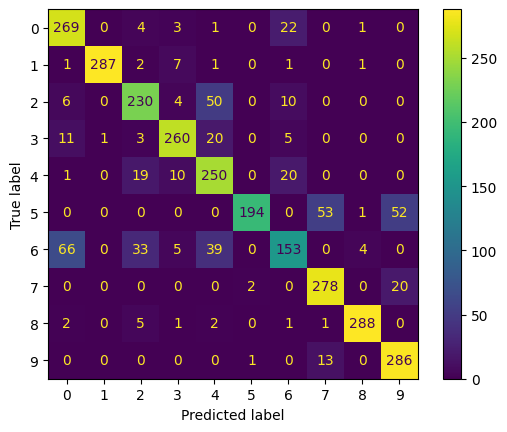

Fold 2:
 Accuracy Score: 0.8443333333333334
 Recall per class: [0.89333333 0.97333333 0.76       0.87333333 0.88333333 0.65333333
 0.55666667 0.93       0.94       0.98      ]
 Precision per class: [0.77456647 0.99319728 0.78892734 0.92907801 0.71815718 0.99492386
 0.74222222 0.83783784 0.9559322  0.79459459]
 Macro Recall: 0.8443333333333334
 Macro Precision: 0.852943700020886


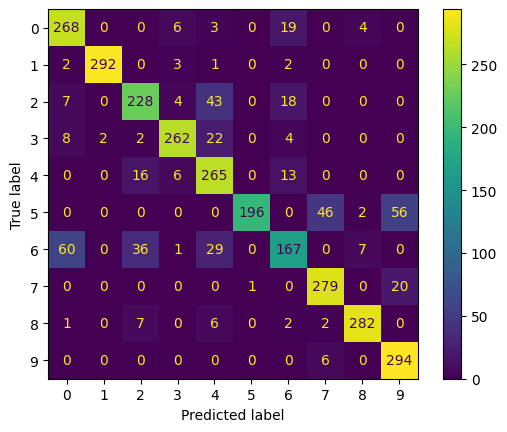

Fold 3:
 Accuracy Score: 0.8443333333333334
 Recall per class: [0.86       0.98       0.79666667 0.85666667 0.86333333 0.69666667
 0.52666667 0.92333333 0.96       0.98      ]
 Precision per class: [0.76106195 0.98       0.77096774 0.91785714 0.71153846 1.
 0.75238095 0.83685801 0.97297297 0.81440443]
 Macro Recall: 0.8443333333333334
 Macro Precision: 0.8518041656762929


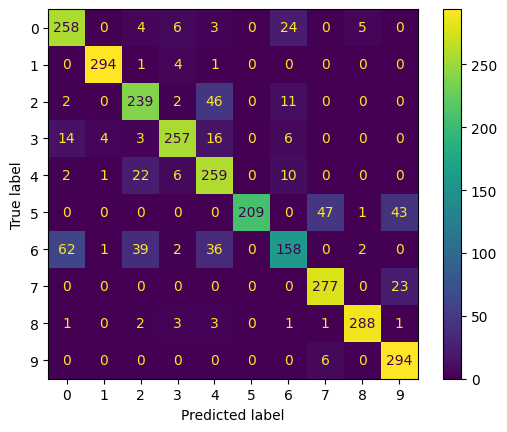

Fold 4:
 Accuracy Score: 0.8486666666666667
 Recall per class: [0.87333333 0.98       0.79666667 0.86333333 0.84       0.68666667
 0.55       0.94       0.97333333 0.98333333]
 Precision per class: [0.74643875 0.98657718 0.78104575 0.91197183 0.75675676 1.
 0.72687225 0.8597561  0.96369637 0.81043956]
 Macro Recall: 0.8486666666666667
 Macro Precision: 0.8543554541356994


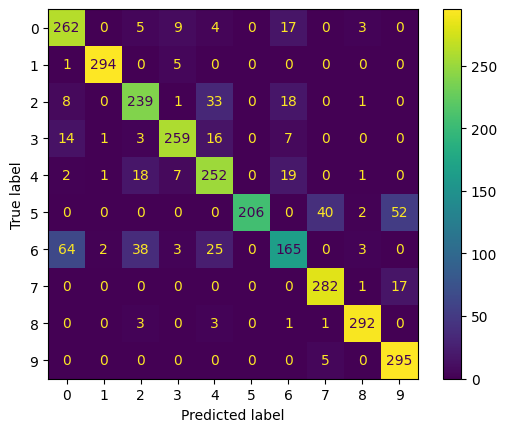

Fold 5:
 Accuracy Score: 0.8463333333333334
 Recall per class: [0.91       0.97       0.81333333 0.9        0.81666667 0.64333333
 0.53666667 0.93       0.96666667 0.97666667]
 Precision per class: [0.78448276 0.99317406 0.76971609 0.90301003 0.73573574 1.
 0.75586854 0.83283582 0.96666667 0.79403794]
 Macro Recall: 0.8463333333333333
 Macro Precision: 0.8535527650105296


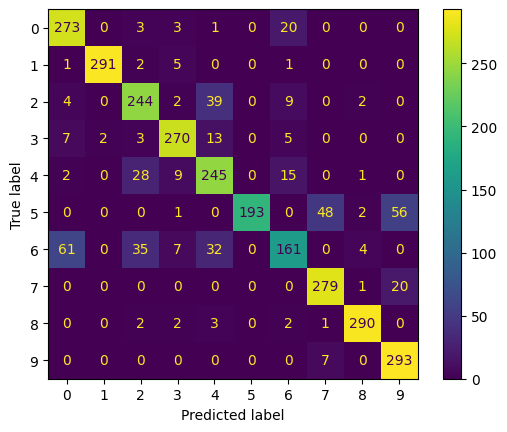

Fold 6:
 Accuracy Score: 0.847
 Recall per class: [0.90333333 0.97       0.80666667 0.88       0.85       0.66666667
 0.53666667 0.92666667 0.96333333 0.96666667]
 Precision per class: [0.77207977 0.98644068 0.74922601 0.92631579 0.77039275 0.99502488
 0.74537037 0.87974684 0.96013289 0.76115486]
 Macro Recall: 0.8469999999999999
 Macro Precision: 0.8545884822400014


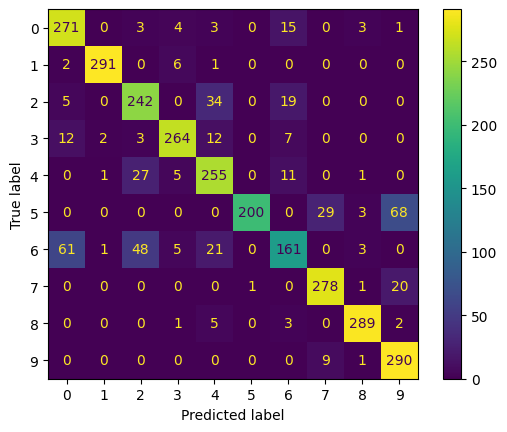

Fold 7:
 Accuracy Score: 0.8426666666666667
 Recall per class: [0.90666667 0.97       0.79333333 0.85666667 0.82333333 0.68
 0.50333333 0.93333333 0.97666667 0.98333333]
 Precision per class: [0.74114441 0.99317406 0.76282051 0.88316151 0.73293769 1.
 0.77835052 0.86687307 0.95439739 0.79301075]
 Macro Recall: 0.8426666666666666
 Macro Precision: 0.8505869913214706


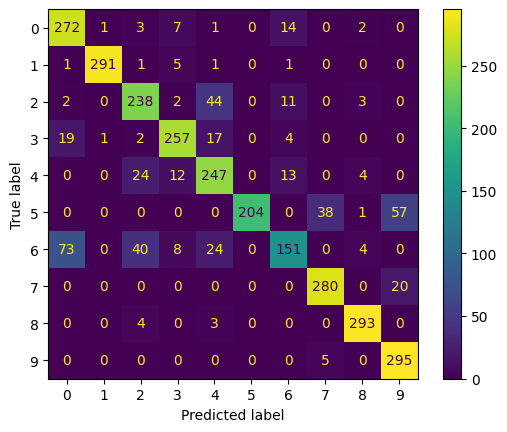

Fold 8:
 Accuracy Score: 0.8373333333333334
 Recall per class: [0.88333333 0.97666667 0.78666667 0.86333333 0.82666667 0.69
 0.48       0.92666667 0.96       0.98      ]
 Precision per class: [0.72207084 0.99322034 0.78405316 0.92170819 0.69662921 1.
 0.72727273 0.85015291 0.95681063 0.80108992]
 Macro Recall: 0.8373333333333333
 Macro Precision: 0.8453007920309276


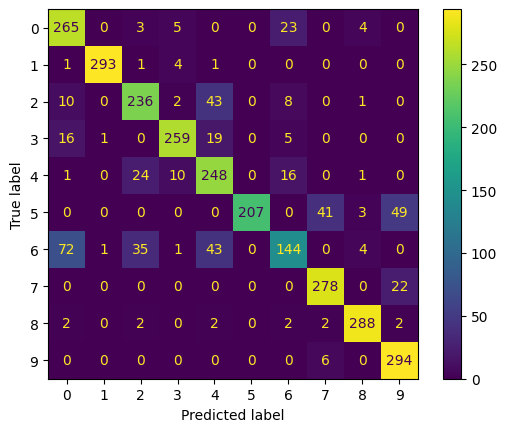

Fold 9:
 Accuracy Score: 0.8276666666666667
 Recall per class: [0.83333333 0.96333333 0.81333333 0.85       0.83333333 0.64
 0.47666667 0.94666667 0.95       0.97      ]
 Precision per class: [0.74183976 0.98634812 0.72403561 0.90747331 0.72886297 1.
 0.68095238 0.83040936 0.94684385 0.79945055]
 Macro Recall: 0.8276666666666668
 Macro Precision: 0.8346215918104922


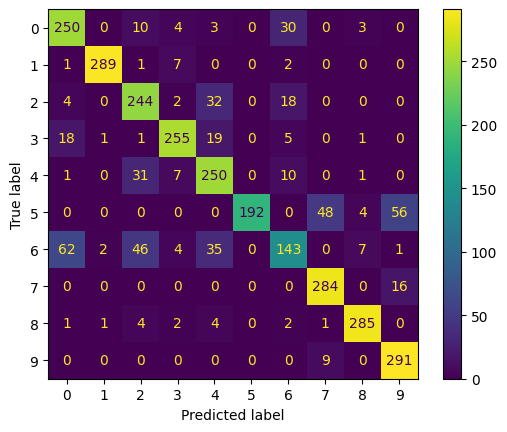

 Fold using k=9 and distance metric = <function cos_distance at 0x7e1e2d56ff60>
 Total avg Accuracy: 0.8411666666666667
 Total avg Macro Recall: 0.8411666666666667
 Total avg Macro Precision: 0.8488165624304914
Fold 0:
 Accuracy Score: 0.8486666666666667
 Recall per class: [0.87       0.96666667 0.83       0.88666667 0.7        0.87333333
 0.51666667 0.93666667 0.94       0.96666667]
 Precision per class: [0.75872093 0.98976109 0.73020528 0.87788779 0.71428571 0.98867925
 0.67391304 0.878125   0.97577855 0.90342679]
 Macro Recall: 0.8486666666666667
 Macro Precision: 0.8490783430791037


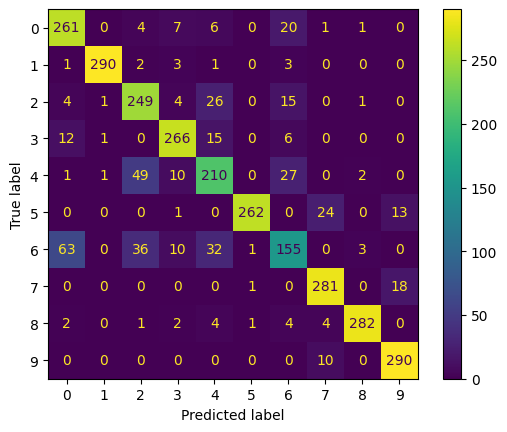

Fold 1:
 Accuracy Score: 0.8446666666666667
 Recall per class: [0.92       0.94666667 0.76666667 0.85333333 0.73333333 0.87333333
 0.53666667 0.94666667 0.93       0.94      ]
 Precision per class: [0.75824176 0.98611111 0.73954984 0.88888889 0.72131148 0.99242424
 0.62403101 0.86060606 0.98239437 0.91558442]
 Macro Recall: 0.8446666666666666
 Macro Precision: 0.8469143165443729


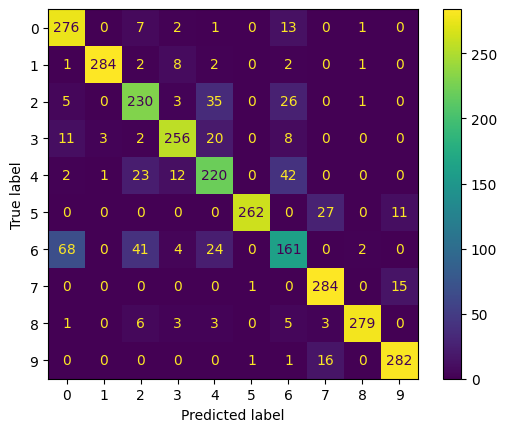

Fold 2:
 Accuracy Score: 0.848
 Recall per class: [0.88       0.96666667 0.75333333 0.89666667 0.78       0.84
 0.54666667 0.94333333 0.90333333 0.97      ]
 Precision per class: [0.74366197 1.         0.72204473 0.91496599 0.75483871 0.99212598
 0.66129032 0.85757576 0.96441281 0.89538462]
 Macro Recall: 0.8480000000000001
 Macro Precision: 0.8506300887518355


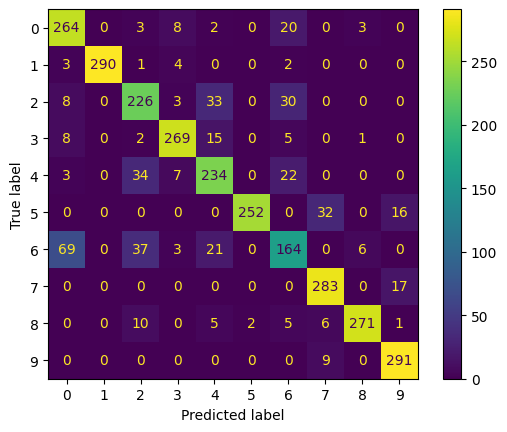

Fold 3:
 Accuracy Score: 0.8503333333333334
 Recall per class: [0.88       0.97666667 0.77       0.86333333 0.77666667 0.88666667
 0.51666667 0.93666667 0.93666667 0.96      ]
 Precision per class: [0.73537604 0.98322148 0.73333333 0.89930556 0.75404531 0.98154982
 0.65400844 0.88087774 0.97909408 0.90851735]
 Macro Recall: 0.8503333333333334
 Macro Precision: 0.8509329141486776


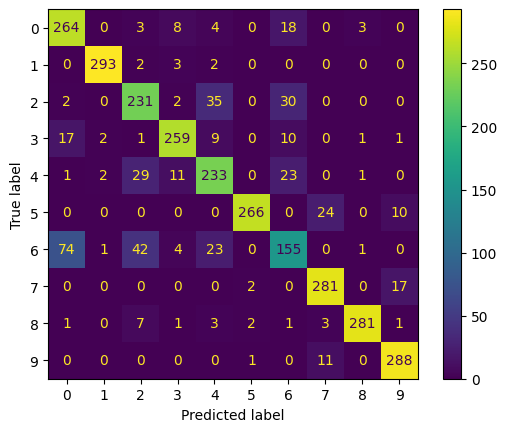

Fold 4:
 Accuracy Score: 0.8453333333333334
 Recall per class: [0.86666667 0.98       0.78       0.86333333 0.74       0.83666667
 0.52       0.93333333 0.96666667 0.96666667]
 Precision per class: [0.73033708 0.98657718 0.71341463 0.8869863  0.75254237 0.9766537
 0.66101695 0.87227414 0.98639456 0.89783282]
 Macro Recall: 0.8453333333333333
 Macro Precision: 0.8464029732370667


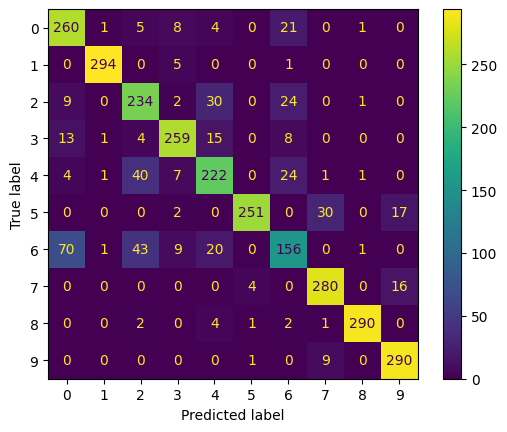

Fold 5:
 Accuracy Score: 0.8553333333333333
 Recall per class: [0.90666667 0.96333333 0.81       0.89666667 0.75333333 0.85333333
 0.53666667 0.94333333 0.93       0.96      ]
 Precision per class: [0.73913043 0.98634812 0.74311927 0.88486842 0.78472222 0.98461538
 0.69396552 0.86280488 0.97894737 0.91428571]
 Macro Recall: 0.8553333333333335
 Macro Precision: 0.8572807329591713


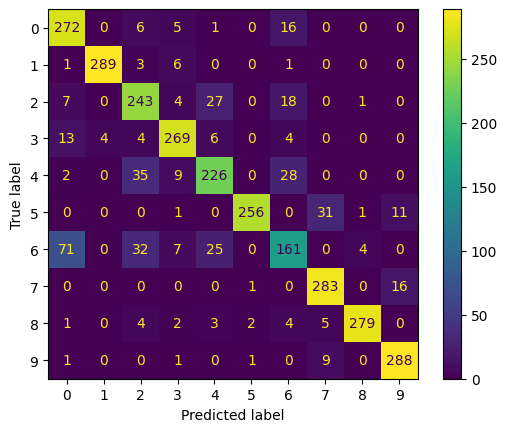

Fold 6:
 Accuracy Score: 0.8473333333333334
 Recall per class: [0.88       0.94333333 0.78       0.89       0.74333333 0.85666667
 0.53       0.95666667 0.94666667 0.94666667]
 Precision per class: [0.75862069 0.98606272 0.7112462  0.89297659 0.76896552 0.98467433
 0.6284585  0.875      0.97594502 0.9044586 ]
 Macro Recall: 0.8473333333333333
 Macro Precision: 0.8486408157337128


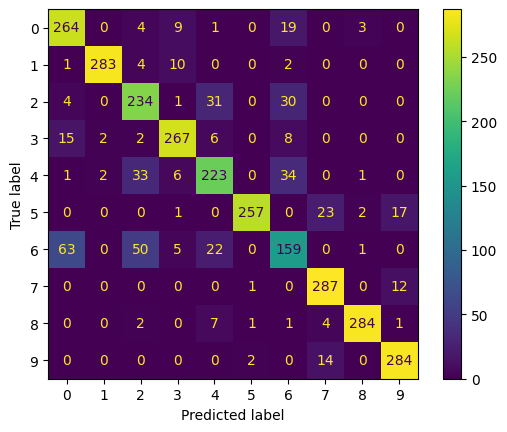

Fold 7:
 Accuracy Score: 0.8506666666666667
 Recall per class: [0.89666667 0.96333333 0.77666667 0.87       0.72333333 0.87666667
 0.50666667 0.95333333 0.96333333 0.97666667]
 Precision per class: [0.74104683 0.98972603 0.72136223 0.86138614 0.76408451 0.99621212
 0.65517241 0.9022082  0.95695364 0.915625  ]
 Macro Recall: 0.8506666666666666
 Macro Precision: 0.8503777113393541


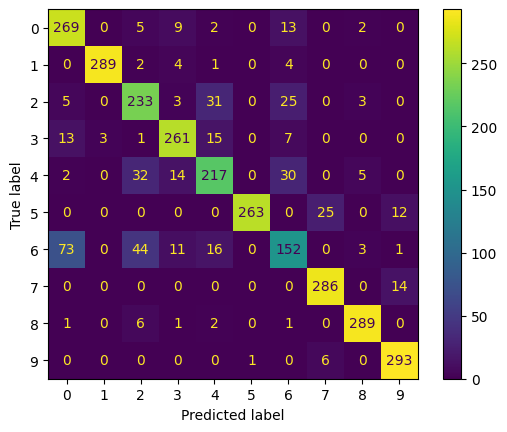

Fold 8:
 Accuracy Score: 0.8433333333333334
 Recall per class: [0.87       0.96666667 0.75       0.87333333 0.7        0.87
 0.54       0.95333333 0.93       0.98      ]
 Precision per class: [0.747851   0.99315068 0.69875776 0.89726027 0.70707071 0.98863636
 0.65853659 0.89655172 0.95221843 0.90184049]
 Macro Recall: 0.8433333333333334
 Macro Precision: 0.8441874026787126


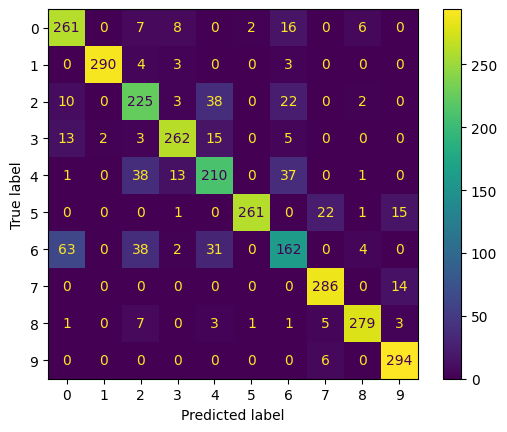

Fold 9:
 Accuracy Score: 0.8356666666666667
 Recall per class: [0.85666667 0.95333333 0.81       0.86666667 0.72666667 0.86333333
 0.44333333 0.94666667 0.92666667 0.96333333]
 Precision per class: [0.73638968 0.9862069  0.65675676 0.89347079 0.76760563 0.98479087
 0.61290323 0.88198758 0.95532646 0.89473684]
 Macro Recall: 0.8356666666666668
 Macro Precision: 0.8370174742860339


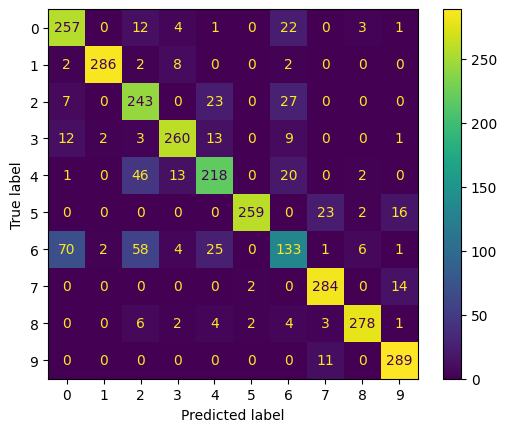

 Fold using k=9 and distance metric = <function manhatan at 0x7e1e35ae6ca0>
 Total avg Accuracy: 0.8469333333333333
 Total avg Macro Recall: 0.8469333333333333
 Total avg Macro Precision: 0.8481462772758042
Fold 0:
 Accuracy Score: 0.8373333333333334
 Recall per class: [0.87       0.95666667 0.83666667 0.88333333 0.69333333 0.77
 0.52666667 0.93666667 0.94333333 0.95666667]
 Precision per class: [0.76315789 0.99307958 0.72965116 0.89527027 0.71232877 1.
 0.62450593 0.83136095 0.98263889 0.87767584]
 Macro Recall: 0.8373333333333333
 Macro Precision: 0.8409669285162984


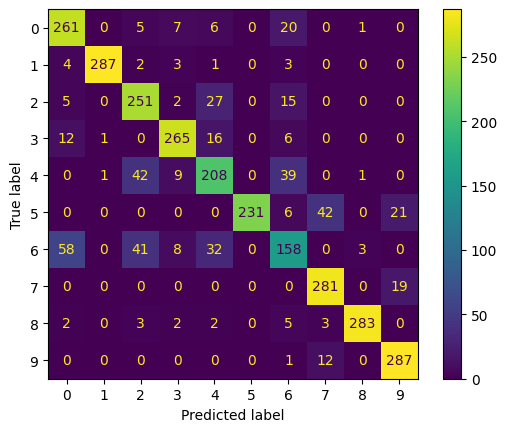

Fold 1:
 Accuracy Score: 0.835
 Recall per class: [0.86666667 0.95       0.77333333 0.86       0.73666667 0.78
 0.54       0.94666667 0.94666667 0.95      ]
 Precision per class: [0.74712644 0.99303136 0.73417722 0.88659794 0.73666667 0.99152542
 0.59558824 0.82318841 0.99300699 0.89341693]
 Macro Recall: 0.835
 Macro Precision: 0.8394325601394209


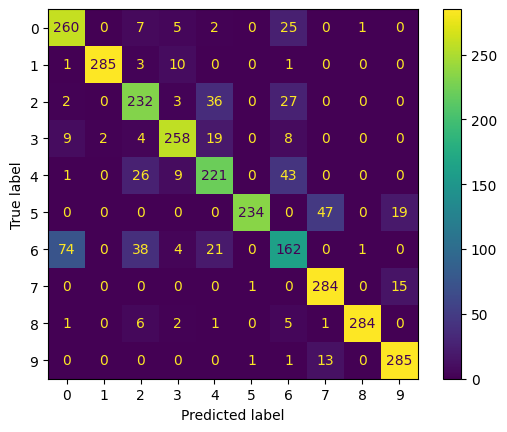

Fold 2:
 Accuracy Score: 0.8423333333333334
 Recall per class: [0.87333333 0.96333333 0.75333333 0.87666667 0.78333333 0.77333333
 0.57666667 0.95       0.90333333 0.97      ]
 Precision per class: [0.73802817 0.99655172 0.7266881  0.90378007 0.75320513 0.98723404
 0.66283525 0.85843373 0.97132616 0.87125749]
 Macro Recall: 0.8423333333333334
 Macro Precision: 0.8469339869419145


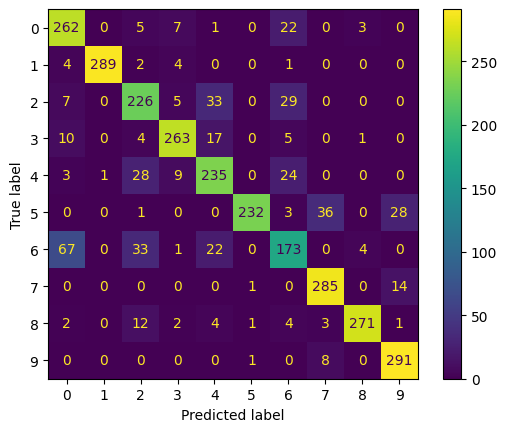

Fold 3:
 Accuracy Score: 0.8436666666666667
 Recall per class: [0.87666667 0.97333333 0.78666667 0.83333333 0.80333333 0.78
 0.56       0.93       0.93       0.96333333]
 Precision per class: [0.74715909 0.98316498 0.75159236 0.89928058 0.76025237 0.99152542
 0.66141732 0.83532934 0.98239437 0.86526946]
 Macro Recall: 0.8436666666666668
 Macro Precision: 0.8477385287387993


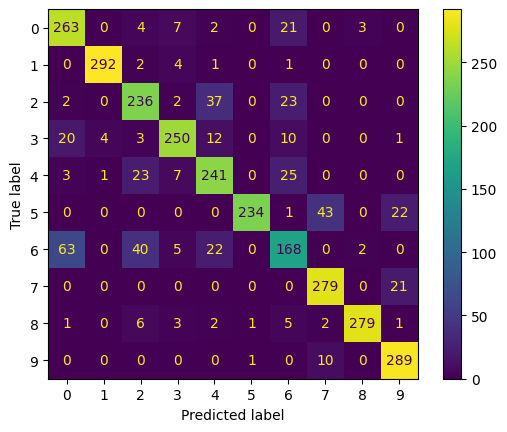

Fold 4:
 Accuracy Score: 0.8416666666666667
 Recall per class: [0.86       0.97333333 0.79666667 0.86333333 0.74       0.78
 0.55       0.94       0.95       0.96333333]
 Precision per class: [0.73925501 0.98316498 0.71556886 0.91197183 0.77622378 0.99152542
 0.62030075 0.84939759 0.98615917 0.88379205]
 Macro Recall: 0.8416666666666666
 Macro Precision: 0.8457359451426566


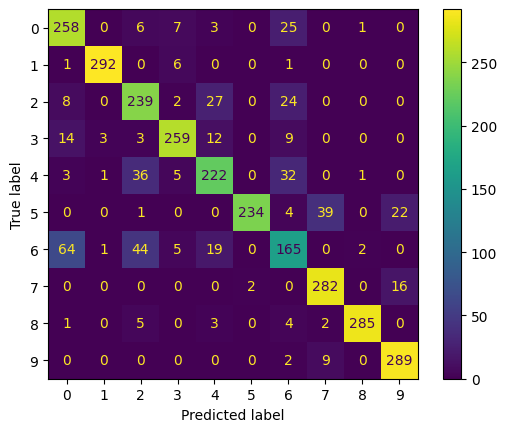

Fold 5:
 Accuracy Score: 0.846
 Recall per class: [0.90666667 0.96666667 0.80333333 0.87666667 0.77333333 0.79
 0.51666667 0.94333333 0.92333333 0.96      ]
 Precision per class: [0.73712737 0.98976109 0.75077882 0.87375415 0.76821192 0.9875
 0.66523605 0.84477612 0.97879859 0.89164087]
 Macro Recall: 0.8460000000000001
 Macro Precision: 0.8487584977327616


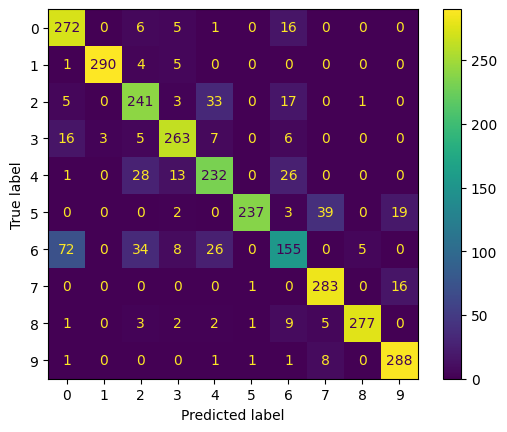

Fold 6:
 Accuracy Score: 0.8303333333333334
 Recall per class: [0.87       0.93666667 0.76666667 0.87333333 0.74       0.75
 0.52       0.96       0.93666667 0.95      ]
 Precision per class: [0.75216138 0.98943662 0.70552147 0.87333333 0.74747475 0.98684211
 0.6        0.8252149  0.97569444 0.88785047]
 Macro Recall: 0.8303333333333333
 Macro Precision: 0.8343529472915121


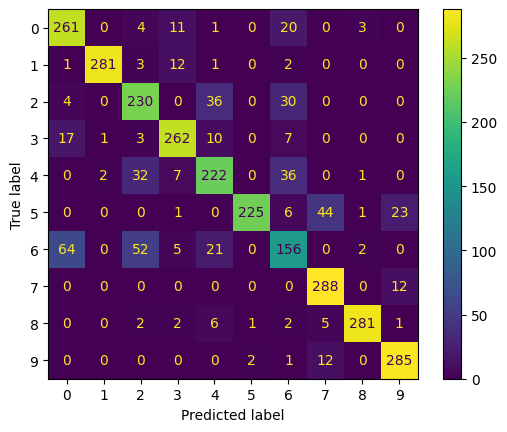

Fold 7:
 Accuracy Score: 0.8446666666666667
 Recall per class: [0.87333333 0.96333333 0.78333333 0.85666667 0.74333333 0.83333333
 0.51333333 0.94666667 0.96333333 0.97      ]
 Precision per class: [0.75287356 0.99312715 0.71212121 0.85953177 0.76896552 1.
 0.63374486 0.87654321 0.96013289 0.89814815]
 Macro Recall: 0.8446666666666667
 Macro Precision: 0.8455188317279774


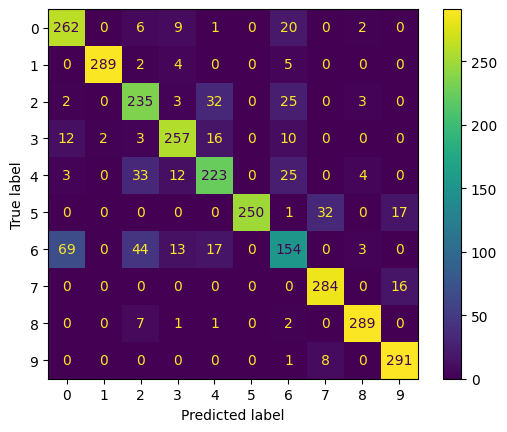

Fold 8:
 Accuracy Score: 0.8413333333333334
 Recall per class: [0.88333333 0.96333333 0.77333333 0.87666667 0.7        0.79
 0.57333333 0.95       0.93       0.97333333]
 Precision per class: [0.76149425 0.9829932  0.71384615 0.91637631 0.73170732 1.
 0.6490566  0.8662614  0.95547945 0.86904762]
 Macro Recall: 0.8413333333333333
 Macro Precision: 0.8446262300744299


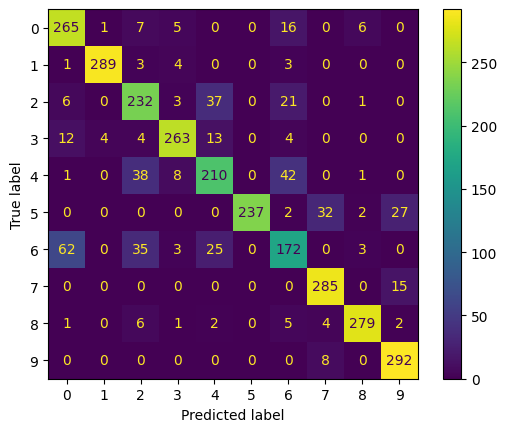

Fold 9:
 Accuracy Score: 0.8256666666666667
 Recall per class: [0.84333333 0.95       0.8        0.83       0.73333333 0.78666667
 0.48       0.94333333 0.92333333 0.96666667]
 Precision per class: [0.73976608 0.98275862 0.65217391 0.89568345 0.76655052 1.
 0.58064516 0.87076923 0.95517241 0.86309524]
 Macro Recall: 0.8256666666666668
 Macro Precision: 0.8306614635437868


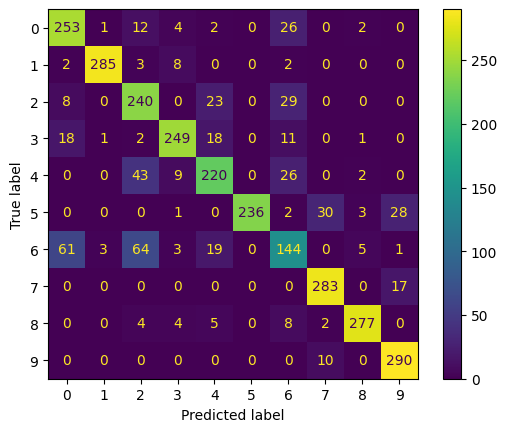

 Fold using k=11 and distance metric = <function euclidean at 0x7e1e2d56f920>
 Total avg Accuracy: 0.8388
 Total avg Macro Recall: 0.8388
 Total avg Macro Precision: 0.8424725919849557
Fold 0:
 Accuracy Score: 0.842
 Recall per class: [0.88666667 0.96666667 0.85       0.90333333 0.82       0.64666667
 0.48666667 0.94333333 0.96333333 0.95333333]
 Precision per class: [0.74929577 0.98639456 0.80696203 0.90033223 0.7008547  1.
 0.77659574 0.81088825 0.97635135 0.80337079]
 Macro Recall: 0.842
 Macro Precision: 0.8511045419253847


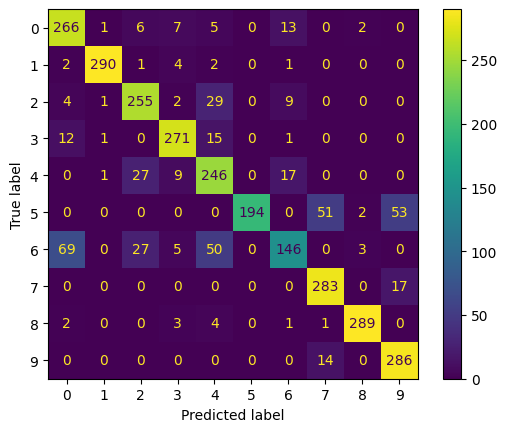

Fold 1:
 Accuracy Score: 0.8293333333333334
 Recall per class: [0.89666667 0.96       0.76666667 0.86333333 0.83666667 0.63333333
 0.49333333 0.92666667 0.96333333 0.95333333]
 Precision per class: [0.74722222 0.99653979 0.77966102 0.89930556 0.68392371 0.98445596
 0.72195122 0.8057971  0.97635135 0.79005525]
 Macro Recall: 0.8293333333333333
 Macro Precision: 0.8385263172317374


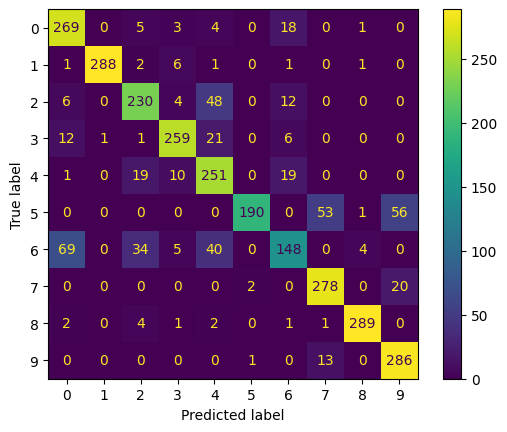

Fold 2:
 Accuracy Score: 0.844
 Recall per class: [0.90333333 0.97333333 0.75666667 0.87333333 0.89       0.64333333
 0.54666667 0.93333333 0.94       0.98      ]
 Precision per class: [0.76338028 0.99319728 0.78546713 0.93238434 0.72357724 0.99484536
 0.75576037 0.83832335 0.9559322  0.79032258]
 Macro Recall: 0.844
 Macro Precision: 0.8533190132855498


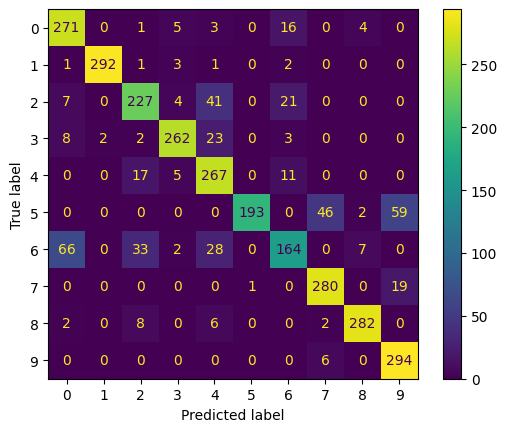

Fold 3:
 Accuracy Score: 0.8416666666666667
 Recall per class: [0.86666667 0.97666667 0.79333333 0.86       0.86       0.68333333
 0.52666667 0.91333333 0.96       0.97666667]
 Precision per class: [0.76696165 0.98653199 0.77022654 0.92142857 0.6972973  1.
 0.75961538 0.83282675 0.96969697 0.80054645]
 Macro Recall: 0.8416666666666668
 Macro Precision: 0.8505131594512237


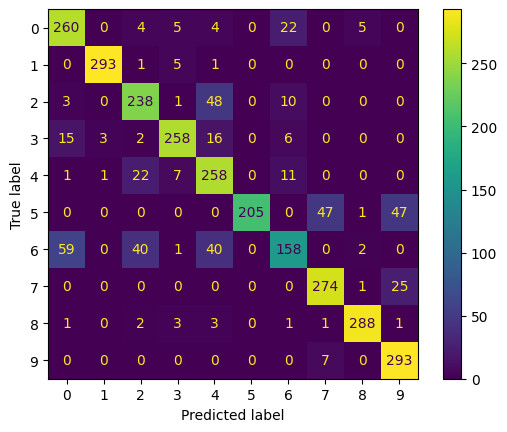

Fold 4:
 Accuracy Score: 0.8446666666666667
 Recall per class: [0.86666667 0.98       0.80333333 0.86666667 0.84333333 0.67
 0.52666667 0.93333333 0.97333333 0.98333333]
 Precision per class: [0.74074074 0.98657718 0.76751592 0.90909091 0.75975976 1.
 0.73148148 0.85365854 0.96052632 0.79945799]
 Macro Recall: 0.8446666666666667
 Macro Precision: 0.8508808842802609


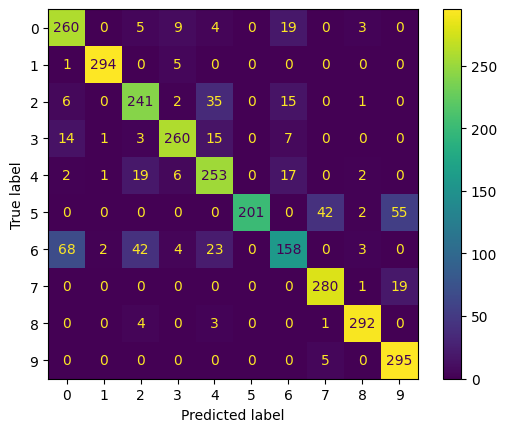

Fold 5:
 Accuracy Score: 0.8426666666666667
 Recall per class: [0.91666667 0.96666667 0.80666667 0.90333333 0.82       0.62333333
 0.51333333 0.92666667 0.97       0.98      ]
 Precision per class: [0.77683616 0.98976109 0.76100629 0.88562092 0.73873874 1.
 0.78172589 0.82985075 0.96039604 0.78609626]
 Macro Recall: 0.8426666666666666
 Macro Precision: 0.8510032124303837


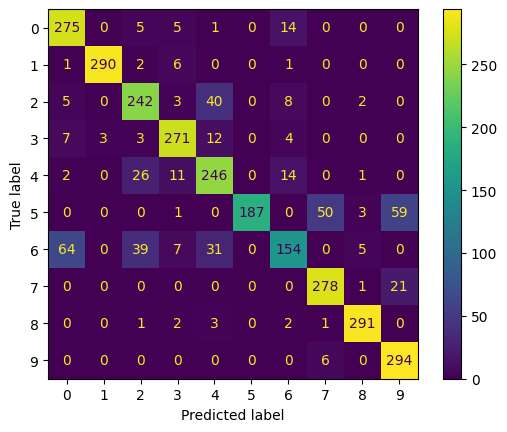

Fold 6:
 Accuracy Score: 0.843
 Recall per class: [0.90666667 0.95666667 0.79333333 0.88       0.85333333 0.65
 0.53333333 0.92333333 0.96333333 0.97      ]
 Precision per class: [0.78386167 0.98965517 0.74143302 0.91349481 0.75516224 0.99489796
 0.74766355 0.87936508 0.96013289 0.75      ]
 Macro Recall: 0.843
 Macro Precision: 0.8515666397582944


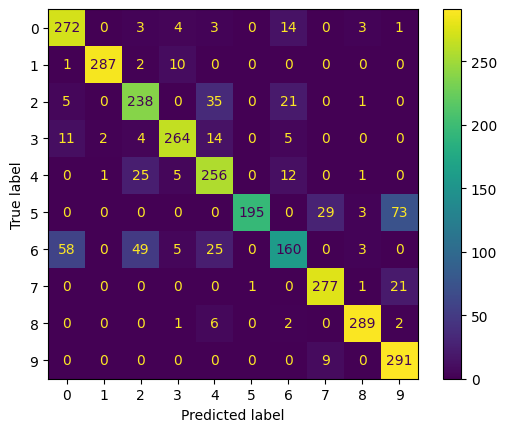

Fold 7:
 Accuracy Score: 0.8413333333333334
 Recall per class: [0.88666667 0.97       0.8        0.86333333 0.82666667 0.66333333
 0.51       0.93       0.97666667 0.98666667]
 Precision per class: [0.74719101 0.99317406 0.76433121 0.89310345 0.73156342 1.
 0.76119403 0.86377709 0.9512987  0.78514589]
 Macro Recall: 0.8413333333333333
 Macro Precision: 0.849077886249215


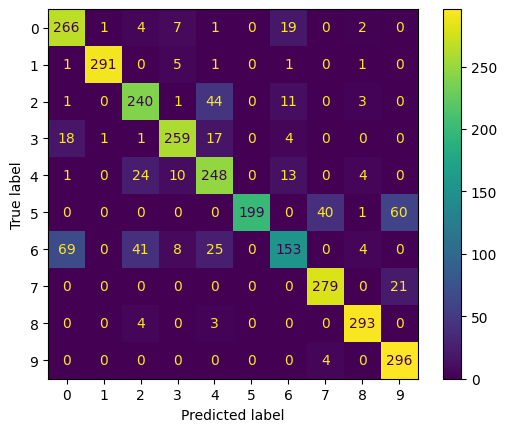

Fold 8:
 Accuracy Score: 0.8383333333333334
 Recall per class: [0.88666667 0.98       0.77666667 0.87       0.82666667 0.67666667
 0.50333333 0.92333333 0.96       0.98      ]
 Precision per class: [0.74094708 0.99661017 0.79522184 0.92226148 0.68698061 1.
 0.73658537 0.85230769 0.95049505 0.78820375]
 Macro Recall: 0.8383333333333333
 Macro Precision: 0.8469613042238582


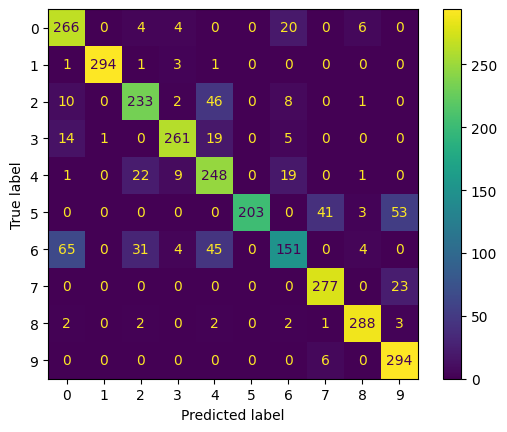

Fold 9:
 Accuracy Score: 0.825
 Recall per class: [0.84333333 0.96       0.8        0.84333333 0.82666667 0.63333333
 0.47666667 0.94666667 0.95       0.97      ]
 Precision per class: [0.74193548 0.98630137 0.72727273 0.90035587 0.71264368 1.
 0.68421053 0.83040936 0.94684385 0.79508197]
 Macro Recall: 0.825
 Macro Precision: 0.8325054835128398


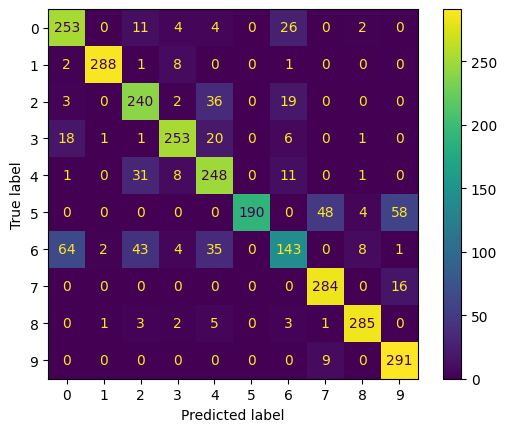

 Fold using k=11 and distance metric = <function cos_distance at 0x7e1e2d56ff60>
 Total avg Accuracy: 0.8392
 Total avg Macro Recall: 0.8391999999999997
 Total avg Macro Precision: 0.8475458442348746
Fold 0:
 Accuracy Score: 0.8466666666666667
 Recall per class: [0.87666667 0.96666667 0.83333333 0.88       0.69333333 0.85666667
 0.51333333 0.94       0.94       0.96666667]
 Precision per class: [0.75358166 0.98976109 0.73529412 0.88       0.70748299 0.98846154
 0.66956522 0.87306502 0.97916667 0.89783282]
 Macro Recall: 0.8466666666666667
 Macro Precision: 0.8474211120222475


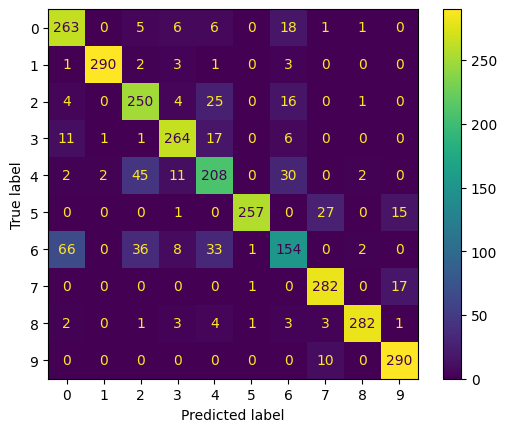

Fold 1:
 Accuracy Score: 0.8456666666666667
 Recall per class: [0.93       0.94333333 0.77       0.86       0.72666667 0.86333333
 0.54       0.95       0.93       0.94333333]
 Precision per class: [0.76648352 0.98606272 0.73801917 0.88965517 0.71710526 0.99233716
 0.62790698 0.85585586 0.9893617  0.91883117]
 Macro Recall: 0.8456666666666667
 Macro Precision: 0.8481618707464141


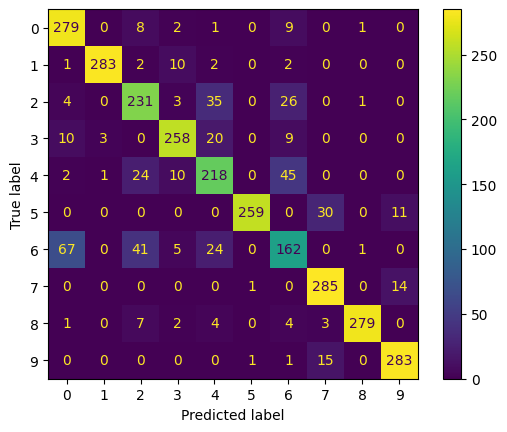

Fold 2:
 Accuracy Score: 0.8426666666666667
 Recall per class: [0.87666667 0.96333333 0.74666667 0.89333333 0.77666667 0.83
 0.53       0.94       0.90333333 0.96666667]
 Precision per class: [0.73669468 0.99312715 0.72258065 0.91467577 0.74440895 0.99203187
 0.64634146 0.84939759 0.96441281 0.88957055]
 Macro Recall: 0.8426666666666666
 Macro Precision: 0.8453241474224932


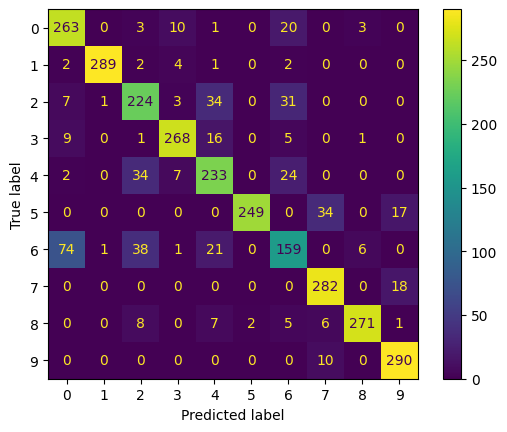

Fold 3:
 Accuracy Score: 0.846
 Recall per class: [0.87       0.97333333 0.77       0.85333333 0.77666667 0.87666667
 0.52       0.93333333 0.93       0.95666667]
 Precision per class: [0.7270195  0.98316498 0.72870662 0.89198606 0.7327044  0.98134328
 0.67532468 0.86956522 0.98586572 0.90251572]
 Macro Recall: 0.8459999999999999
 Macro Precision: 0.8478196195561531


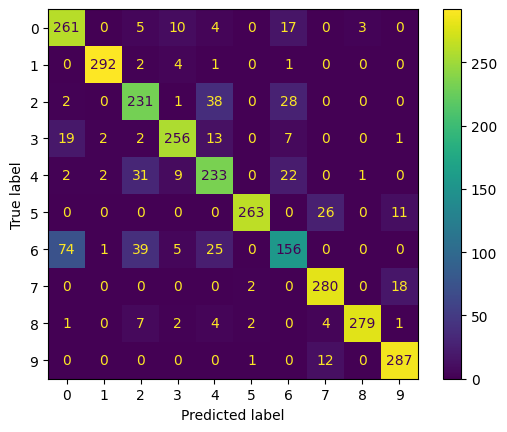

Fold 4:
 Accuracy Score: 0.8433333333333334
 Recall per class: [0.86666667 0.97666667 0.78666667 0.86333333 0.73333333 0.83333333
 0.52       0.94       0.95       0.96333333]
 Precision per class: [0.73446328 0.98322148 0.70447761 0.90559441 0.73825503 0.9765625
 0.6695279  0.86238532 0.9760274  0.90031153]
 Macro Recall: 0.8433333333333334
 Macro Precision: 0.8450826446274625


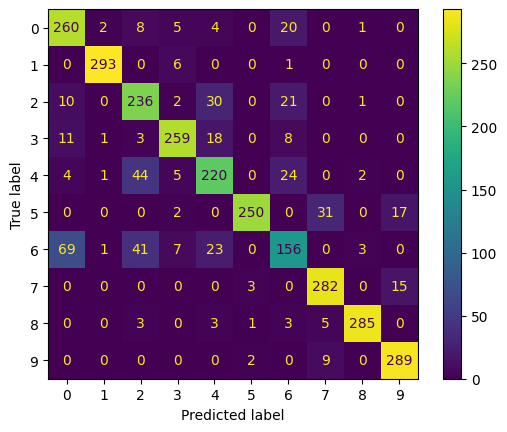

Fold 5:
 Accuracy Score: 0.849
 Recall per class: [0.89333333 0.96333333 0.81       0.88666667 0.75666667 0.85333333
 0.49666667 0.94       0.93       0.96      ]
 Precision per class: [0.73424658 0.98972603 0.72972973 0.86928105 0.77210884 0.98841699
 0.67420814 0.8597561  0.97552448 0.91139241]
 Macro Recall: 0.849
 Macro Precision: 0.8504390333120616


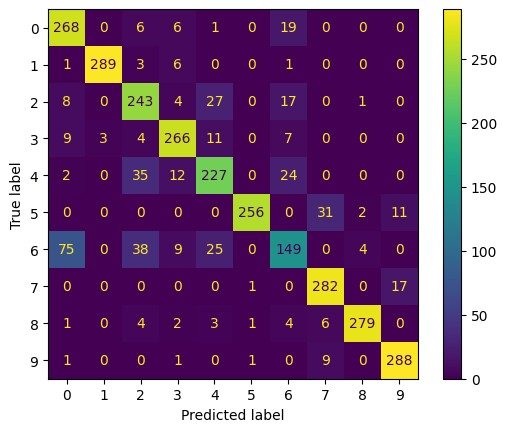

Fold 6:
 Accuracy Score: 0.8443333333333334
 Recall per class: [0.89       0.94333333 0.76       0.88333333 0.74       0.85333333
 0.53333333 0.95       0.94666667 0.94333333]
 Precision per class: [0.77616279 0.98606272 0.70153846 0.88333333 0.75254237 0.98841699
 0.62745098 0.86890244 0.97260274 0.8984127 ]
 Macro Recall: 0.8443333333333332
 Macro Precision: 0.8455425522193121


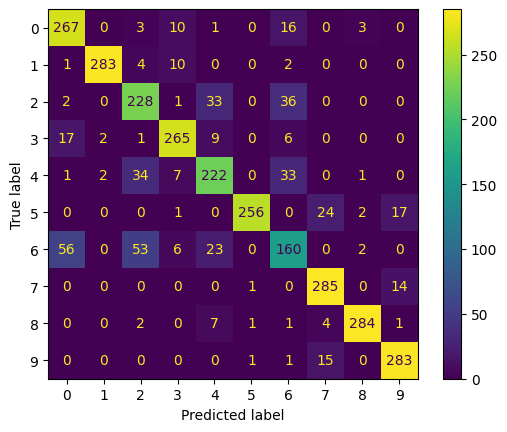

Fold 7:
 Accuracy Score: 0.8506666666666667
 Recall per class: [0.89666667 0.96666667 0.76666667 0.86666667 0.73       0.88
 0.51666667 0.95333333 0.95666667 0.97333333]
 Precision per class: [0.74722222 0.98976109 0.7165109  0.85808581 0.75257732 0.9924812
 0.67099567 0.90793651 0.95666667 0.9125    ]
 Macro Recall: 0.8506666666666666
 Macro Precision: 0.8504737394574036


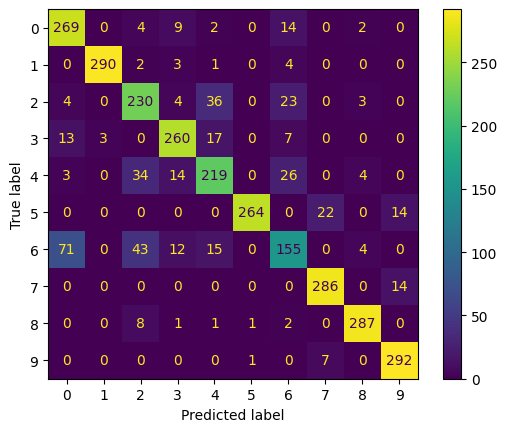

Fold 8:
 Accuracy Score: 0.843
 Recall per class: [0.87       0.96333333 0.73666667 0.87       0.7        0.87666667
 0.55333333 0.95       0.93       0.98      ]
 Precision per class: [0.75872093 0.98634812 0.6863354  0.90625    0.71186441 0.9887218
 0.65354331 0.89905363 0.94576271 0.90184049]
 Macro Recall: 0.843
 Macro Precision: 0.843844080562592


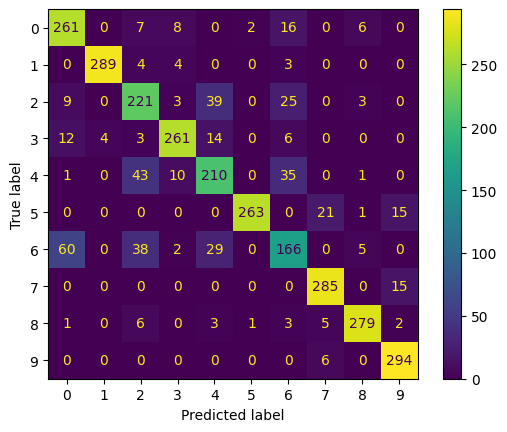

Fold 9:
 Accuracy Score: 0.8336666666666667
 Recall per class: [0.86666667 0.95333333 0.79333333 0.85666667 0.74666667 0.85666667
 0.42666667 0.94333333 0.93       0.96333333]
 Precision per class: [0.72625698 0.9862069  0.65745856 0.89236111 0.76190476 0.98467433
 0.60663507 0.884375   0.95876289 0.88923077]
 Macro Recall: 0.8336666666666666
 Macro Precision: 0.8347866372764402


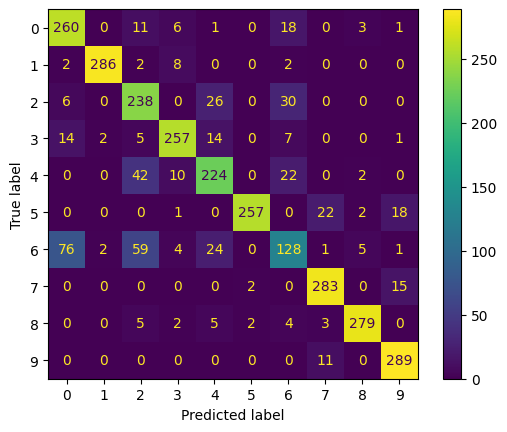

 Fold using k=11 and distance metric = <function manhatan at 0x7e1e35ae6ca0>
 Total avg Accuracy: 0.8445
 Total avg Macro Recall: 0.8444999999999998
 Total avg Macro Precision: 0.845889543720258


In [79]:
# Create the StratifiedKfold object with 10 folds
skf = StratifiedKFold(n_splits=10)
possible_k = [5,7,9,11]
possible_distance_metric = [euclidean,cos_distance,manhatan]
for k in possible_k:
    for distance_metric in possible_distance_metric:
        knn = Knn(k,distance_metric)
        accuracy = []
        macro_recall = []
        macro_precision = []
        for i, (train_index, test_index) in enumerate(skf.split(x_train_half, y_train_half)):
            print(f"Fold {i}:")
            x_train_fold , x_test_fold = x_train_half[train_index], x_train_half[test_index]
            y_train_fold , y_test_fold = y_train_half[train_index], y_train_half[test_index]
            knn.fit(x_train_fold,y_train_fold)
            y_pred = knn.predict(x_test_fold)
            acc,re,pre = evaluation(y_pred,y_test_fold)
            accuracy.append(acc)
            macro_recall.append(re)
            macro_precision.append(pre)
        print(f" Fold using k={k} and distance metric = {distance_metric}")
        print(f" Total avg Accuracy: {np.mean(accuracy)}")
        print(f" Total avg Macro Recall: {np.mean(macro_recall)}")
        print(f" Total avg Macro Precision: {np.mean(macro_precision)}") 
           


### Knn using k=5/manhatan

 Knn with k = 5 and distance = manhatan
 Accuracy Score: 0.8623
 Recall per class: [0.862 0.97  0.812 0.883 0.753 0.9   0.566 0.955 0.951 0.971]
 Precision per class: [0.76758682 0.99182004 0.71985816 0.90471311 0.78112033 0.99228225
 0.66588235 0.90952381 0.97839506 0.9230038 ]
 Macro Recall: 0.8623
 Macro Precision: 0.8634185740295456


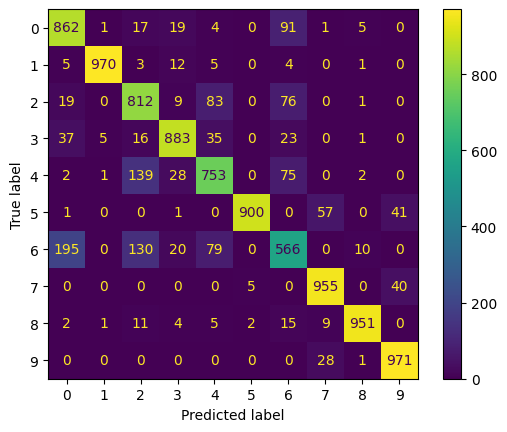

(0.8623, 0.8623, 0.8634185740295456)


In [21]:
knn_5 = Knn(5,manhatan)
knn_5.fit(x_train_embeddings,y_train)
y_preds_5 = knn_5.predict(x_test_embeddings)
print(f" Knn with k = 5 and distance = manhatan")
print(evaluation(y_preds_5, y_test))

### Knn using k=7/euclidean

 Knn with k = 7 and distance = euclidean
 Accuracy Score: 0.854
 Recall per class: [0.857 0.967 0.814 0.869 0.76  0.806 0.588 0.957 0.952 0.97 ]
 Precision per class: [0.78122151 0.99077869 0.72678571 0.9033264  0.78838174 0.99629172
 0.65260821 0.87       0.97341513 0.88746569]
 Macro Recall: 0.8539999999999999
 Macro Precision: 0.8570274817044018


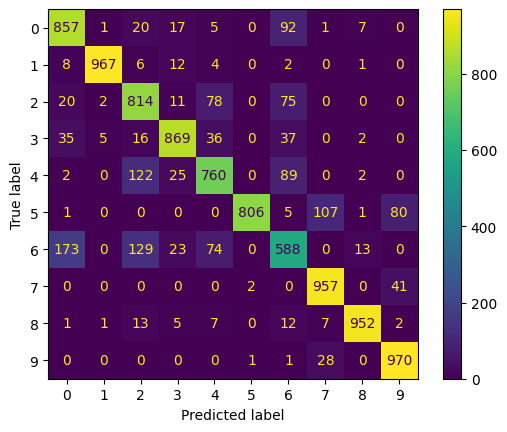

(0.854, 0.8539999999999999, 0.8570274817044018)


In [22]:
knn_7 = Knn(7,euclidean)
knn_7.fit(x_train_embeddings,y_train)
y_preds_7 = knn_7.predict(x_test_embeddings)
print(f" Knn with k = 7 and distance = euclidean")
print(evaluation(y_preds_7, y_test))

### Confusion Matrix and True/False predictions

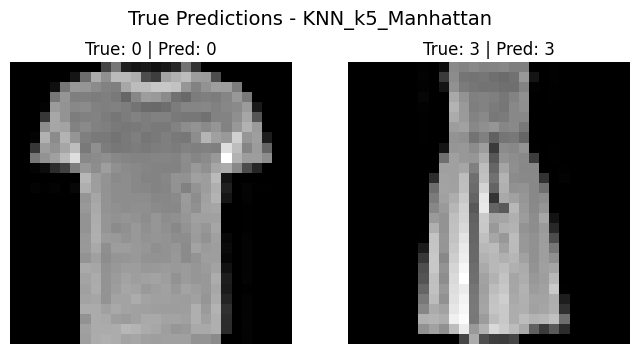

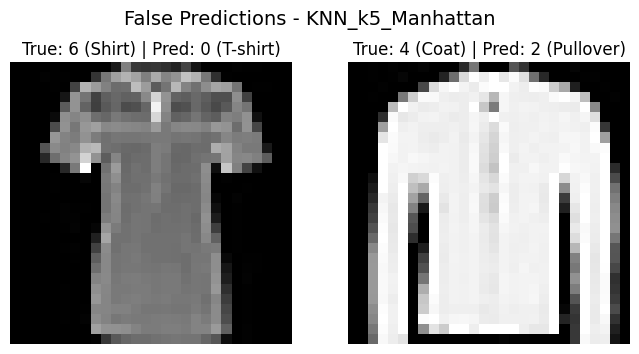

In [28]:
plot_and_save_analysis(y_test,y_preds_5,x_test_embeddings,"KNN_k5_Manhattan")


## 10 Folds Cross Validation Using PCA

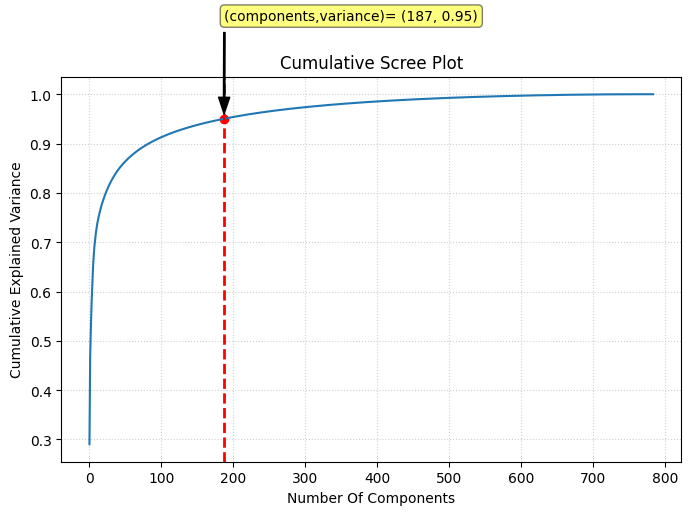

In [104]:
# PCA input is array of shape (n_samples, n_features) so we must flatten first the 28x28 image
flat_x_train = flattening(x_train)
flat_x_test = flattening(x_test)

# Normalize the samples
x_train_pca_test, _ = norm(flat_x_train,flat_x_test)

# See how much of the information we want to keep
pca_test = PCA(n_components=784)
pca_test.fit(x_train_pca_test)
explained_variance = pca_test.explained_variance_ratio_
variance_cumsum = np.cumsum(explained_variance)
x_index = np.arange(len(variance_cumsum))

y_point = 0.9502982181131154
x_point = x_index[np.abs(variance_cumsum-y_point)<0.00001][0]
plt.figure(figsize=(8, 5))
plt.plot(x_index,variance_cumsum)
plt.title("Cumulative Scree Plot")
plt.xlabel("Number Of Components")
plt.ylabel("Cumulative Explained Variance")
plt.axvline(x=x_point, color="red",linewidth=2,linestyle = "--")
plt.annotate(f"(components,variance)= ({x_point}, {y_point:.2f})",
             xy=(x_point, y_point),             
             xytext=(x_point + 0.5, y_point + 0.2),
             arrowprops=dict(facecolor='black', shrink=0.05, width=1, headwidth=8),
             fontsize=10,
             bbox=dict(boxstyle="round,pad=0.3", fc="yellow", ec="black", lw=1, alpha=0.5))
plt.scatter(x_point, y_point, color='red')
plt.grid(True, linestyle=':', alpha=0.6)
plt.savefig("pca95.svg", format='svg', bbox_inches='tight')
plt.show()



### 24 x 10 Cross Validation

We added a new hyperparameter, the components of the PCA. So we need to run the whole cross validation again. First, we perform cross-validation runs on a smaller subset of the dataset (3,000 samples). From these, we select the 5 best combinations based on accuracy. Then, we apply cross-validation again using these top configurations on a larger subset (30,000 samples). Finally, the best-performing configuration will be evaluated on the final test set. This approach allows us to balance computational efficiency with a thorough and reliable evaluation.

In [124]:
x_train_3000, _ , y_train_3000 , _ = train_test_split(flat_x_train, y_train, train_size=10000, stratify=y_train, random_state=42)
print(f"Training set class bincount: {np.bincount(y_train_3000)}")


Training set class bincount: [1000 1000 1000 1000 1000 1000 1000 1000 1000 1000]


The loop goes PCA->Folds->k->distance so we dont have to use PCA 12 times at the same fold

In [128]:
# Create the StratifiedKfold object with 10 folds
skf = StratifiedKFold(n_splits=10)
results_dict = defaultdict(list)
possible_k = [5,7,9,11]
possible_distance_metric = [euclidean,cos_distance,manhatan]
possible_pca_acc = [0.9 , 0.95]
for acc in possible_pca_acc:
    pca = PCA(n_components=acc)
    for i, (train_index, test_index) in enumerate(skf.split(x_train_3000, y_train_3000)):
                # Split
                x_train_fold , x_test_fold = x_train_3000[train_index], x_train_3000[test_index]
                y_train_fold , y_test_fold = y_train_3000[train_index], y_train_3000[test_index]
                # Train the pca to train set and tranform train/test set, that will be used for the combinations.
                # Avoid Data Leakage
                x_train_fold = pca.fit_transform(x_train_fold)
                x_test_fold = pca.transform(x_test_fold)

                for k in possible_k:
                    for distance_metric in possible_distance_metric:
                        knn = Knn(k,distance_metric)
                        knn.fit(x_train_fold,y_train_fold)
                        y_pred = knn.predict(x_test_fold)
                        fold_acc = accuracy_score(y_test_fold,y_pred)

                        # Create the key combination
                        key = f"PCA: {int(acc*100)}%, k: {k}, Metric: {distance_metric}"
                        # Add the result in dictionary
                        results_dict[key].append(fold_acc)

# List to save performance for combinations with 90% and 95%
final_results_90 = {}
final_results_95 = {}
for key_name , acc_list in results_dict.items():
      
      if "90%" in key_name:
            final_results_90[key_name] = np.mean(acc_list)
      elif "95%" in key_name:
        final_results_95[key_name] = np.mean(acc_list)

top2_90 = sorted(final_results_90.items(), key=lambda x: x[1], reverse=True)[:2]
top2_95 = sorted(final_results_95.items(), key=lambda x: x[1], reverse=True)[:2]

for rank, (combo, mean_acc) in enumerate(top2_90, 1):
    print(f"#{rank} | {combo} --> Accuracy: {mean_acc:.4f}")
for rank, (combo, mean_acc) in enumerate(top2_95, 1):
    print(f"#{rank} | {combo} --> Accuracy: {mean_acc:.4f}")



#1 | PCA: 90%, k: 11, Metric: <function cos_distance at 0x755d301b9ee0> --> Accuracy: 0.8134
#2 | PCA: 90%, k: 11, Metric: <function manhatan at 0x755d301b9f80> --> Accuracy: 0.8122
#1 | PCA: 95%, k: 11, Metric: <function manhatan at 0x755d301b9f80> --> Accuracy: 0.8269
#2 | PCA: 95%, k: 7, Metric: <function manhatan at 0x755d301b9f80> --> Accuracy: 0.8268


### 4 x 10 Cross Validation using the best combinations

#### PCA: 90%, k: 11, Metric: cos_distance

 Accuracy Score: 0.8688333333333333
 Recall per class: [0.89166667 0.96666667 0.77666667 0.90333333 0.81833333 0.94166667
 0.515      0.94833333 0.96166667 0.965     ]
 Precision per class: [0.76102418 0.98807496 0.76019576 0.89735099 0.7671875  0.96581197
 0.71693735 0.93431856 0.95057661 0.93236715]
 Macro Recall: 0.8688333333333335
 Macro Precision: 0.8673845023256621


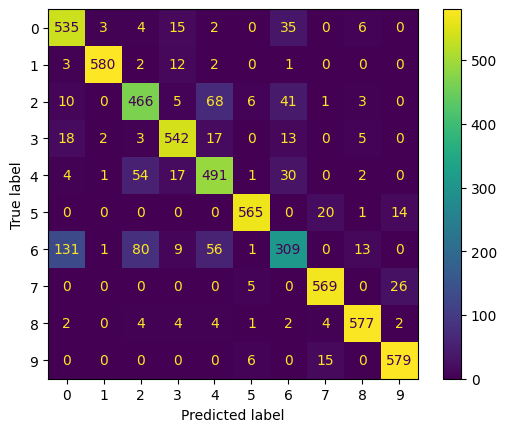

 Accuracy Score: 0.8711666666666666
 Recall per class: [0.86833333 0.97       0.785      0.88666667 0.81166667 0.89
 0.63166667 0.94666667 0.965      0.95666667]
 Precision per class: [0.79299848 0.98477157 0.78239203 0.89411765 0.7609375  0.976234
 0.74023438 0.90734824 0.96822742 0.90822785]
 Macro Recall: 0.8711666666666668
 Macro Precision: 0.8715489119489181


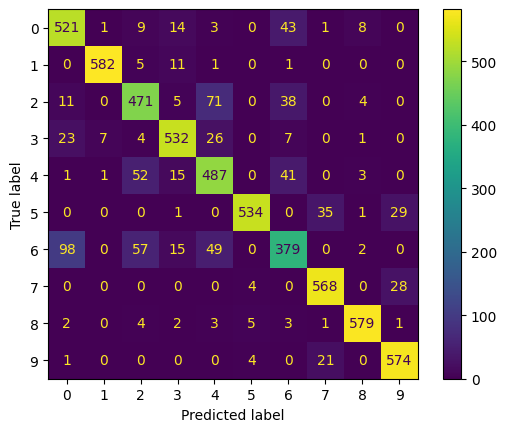

 Accuracy Score: 0.8633333333333333
 Recall per class: [0.89833333 0.975      0.80333333 0.85166667 0.79833333 0.89333333
 0.56       0.92333333 0.97166667 0.95833333]
 Precision per class: [0.76022567 0.98817568 0.80333333 0.89492119 0.74610592 0.97101449
 0.71641791 0.89067524 0.95888158 0.90551181]
 Macro Recall: 0.8633333333333333
 Macro Precision: 0.8635262823192912


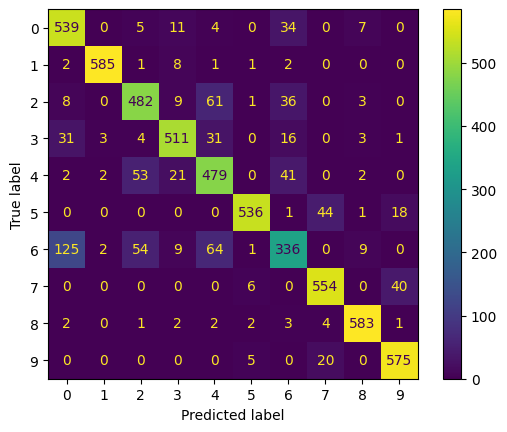

 Accuracy Score: 0.866
 Recall per class: [0.875      0.975      0.80833333 0.895      0.79833333 0.895
 0.56833333 0.93       0.96666667 0.94833333]
 Precision per class: [0.78947368 0.99659284 0.74045802 0.91638225 0.76517572 0.95721925
 0.71189979 0.91176471 0.97315436 0.89889415]
 Macro Recall: 0.8660000000000002
 Macro Precision: 0.8661014781547133


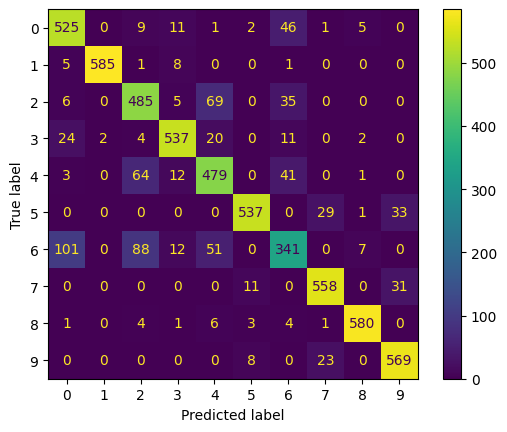

 Accuracy Score: 0.8688333333333333
 Recall per class: [0.87166667 0.96       0.82666667 0.87       0.82166667 0.85833333
 0.63333333 0.93166667 0.95166667 0.96333333]
 Precision per class: [0.7972561  0.99310345 0.78855326 0.90311419 0.76671851 0.97537879
 0.74074074 0.87893082 0.96290051 0.89751553]
 Macro Recall: 0.8688333333333332
 Macro Precision: 0.8704211878910083


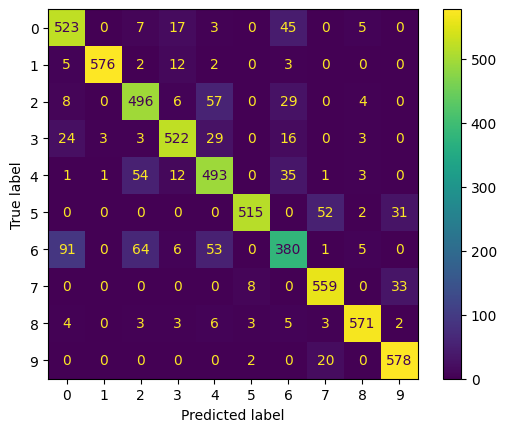

 Accuracy Score: 0.8641666666666666
 Recall per class: [0.885      0.95833333 0.76666667 0.90166667 0.81666667 0.895
 0.54166667 0.95166667 0.96166667 0.96333333]
 Precision per class: [0.77068215 0.99480969 0.76794658 0.90619765 0.73906486 0.96931408
 0.69148936 0.9136     0.96488294 0.92185008]
 Macro Recall: 0.8641666666666667
 Macro Precision: 0.8639837389917766


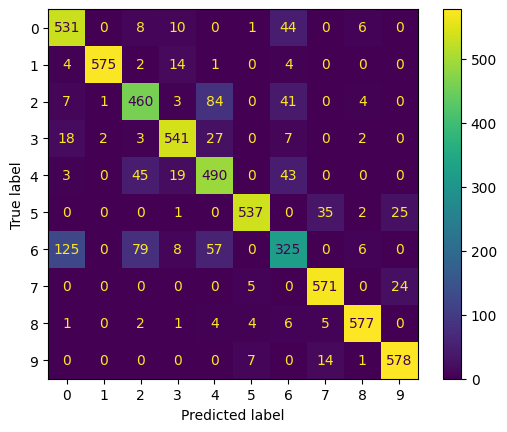

 Accuracy Score: 0.8708333333333333
 Recall per class: [0.89       0.96333333 0.82166667 0.885      0.81666667 0.89
 0.59       0.94       0.95166667 0.96      ]
 Precision per class: [0.7829912  0.9829932  0.76911076 0.8909396  0.784      0.976234
 0.75802998 0.89952153 0.96127946 0.90995261]
 Macro Recall: 0.8708333333333332
 Macro Precision: 0.8715052342629008


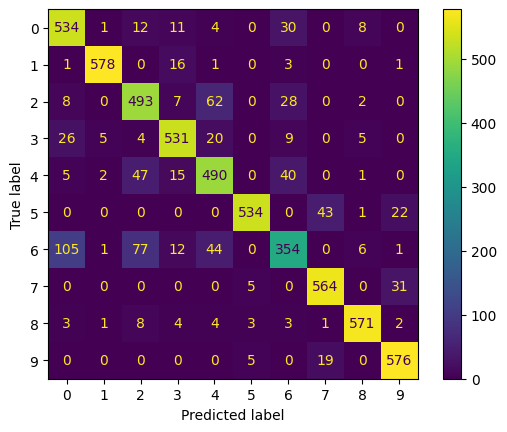

 Accuracy Score: 0.8593333333333333
 Recall per class: [0.86833333 0.97333333 0.75666667 0.865      0.82       0.89166667
 0.57166667 0.92166667 0.965      0.96      ]
 Precision per class: [0.76169591 0.98983051 0.75165563 0.87817259 0.75692308 0.96050269
 0.73290598 0.91404959 0.960199   0.88888889]
 Macro Recall: 0.8593333333333334
 Macro Precision: 0.8594823866347022


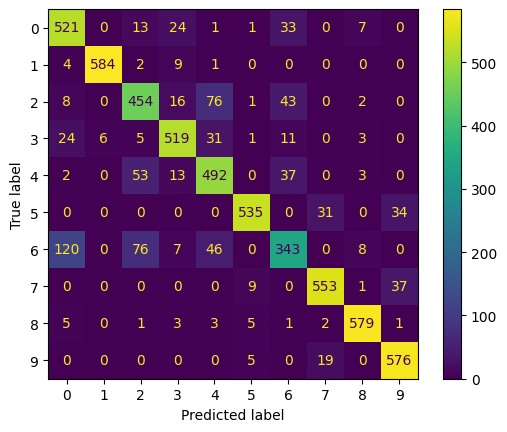

 Accuracy Score: 0.8641666666666666
 Recall per class: [0.855      0.97       0.8        0.91       0.80833333 0.865
 0.58       0.93       0.965      0.95833333]
 Precision per class: [0.77492447 0.98811545 0.768      0.91       0.78733766 0.97373358
 0.68910891 0.88995215 0.965      0.89424572]
 Macro Recall: 0.8641666666666667
 Macro Precision: 0.8640417954215313


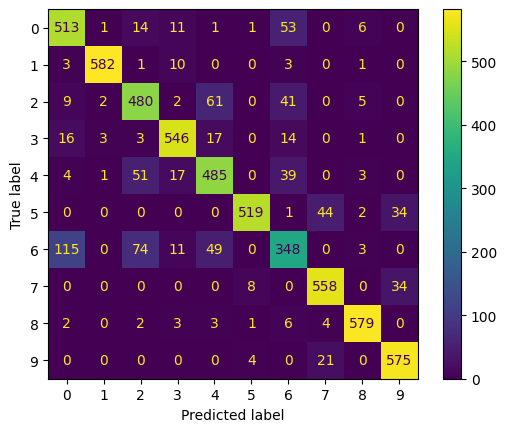

 Accuracy Score: 0.8578333333333333
 Recall per class: [0.87666667 0.96       0.76666667 0.88833333 0.79666667 0.895
 0.54       0.93833333 0.96       0.95666667]
 Precision per class: [0.77352941 0.99310345 0.76033058 0.90186125 0.74339036 0.96582734
 0.67924528 0.90224359 0.93811075 0.91111111]
 Macro Recall: 0.8578333333333333
 Macro Precision: 0.8568753119555046


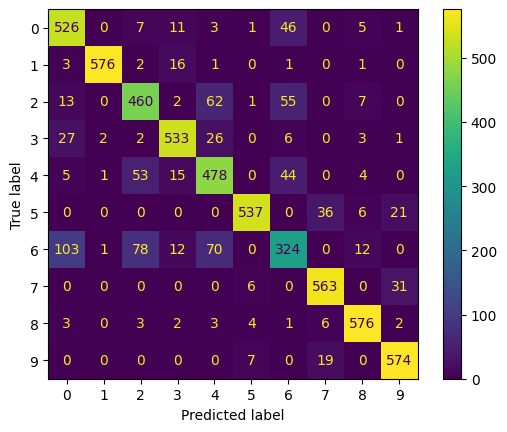

 Fold using k=11 and distance metric = cos distance and PCA variance: 90%
 Total avg Accuracy: 0.86545
 Total avg Macro Recall: 0.86545
 Total avg Macro Precision: 0.865487082990601


In [131]:
skf = StratifiedKFold(n_splits=10)
accuracy=[]
macro_recall=[]
macro_precision=[]
knn_0 = Knn(11,cos_distance)
for i, (train_index, test_index) in enumerate(skf.split(flat_x_train, y_train)):
                # Split
                x_train_fold , x_test_fold = flat_x_train[train_index], flat_x_train[test_index]
                y_train_fold , y_test_fold = y_train[train_index], y_train[test_index]
                # Train the pca to train set and tranform train/test set, that will be used for the combinations.
                # Avoid Data Leakage
                pca_0 = PCA(n_components=0.9)
                x_train_fold = pca_0.fit_transform(x_train_fold)
                x_test_fold = pca_0.transform(x_test_fold)

                knn_0.fit(x_train_fold,y_train_fold)
                y_pred = knn_0.predict(x_test_fold)
                acc,re,pre = evaluation(y_pred,y_test_fold)
                accuracy.append(acc)
                macro_recall.append(re)
                macro_precision.append(pre)
print(f" Fold using k=11 and distance metric = cos distance and PCA variance: 90%")
print(f" Total avg Accuracy: {np.mean(accuracy)}")
print(f" Total avg Macro Recall: {np.mean(macro_recall)}")
print(f" Total avg Macro Precision: {np.mean(macro_precision)}") 

#### PCA: 90%, k: 11, Metric: manhattan

 Accuracy Score: 0.8716666666666667
 Recall per class: [0.87666667 0.96833333 0.79166667 0.90833333 0.80666667 0.92333333
 0.56333333 0.955      0.955      0.96833333]
 Precision per class: [0.76900585 0.99656947 0.77235772 0.90231788 0.78571429 0.98401421
 0.68008048 0.91533546 0.96954315 0.93558776]
 Macro Recall: 0.8716666666666667
 Macro Precision: 0.8710526270937506


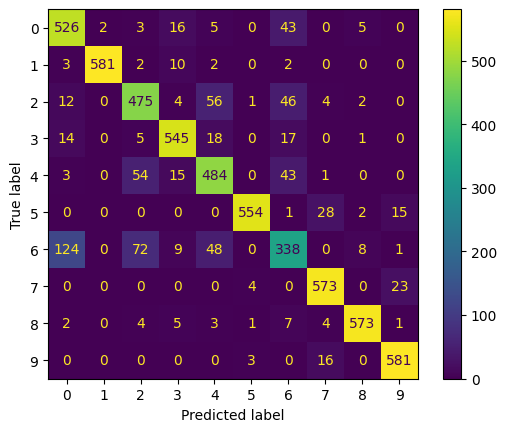

 Accuracy Score: 0.8706666666666667
 Recall per class: [0.86166667 0.96833333 0.78833333 0.89       0.80333333 0.87666667
 0.66333333 0.935      0.96166667 0.95833333]
 Precision per class: [0.79173047 0.99486301 0.80305603 0.89       0.76629571 0.98686679
 0.71582734 0.88625592 0.98296422 0.90408805]
 Macro Recall: 0.8706666666666667
 Macro Precision: 0.8721947552299151


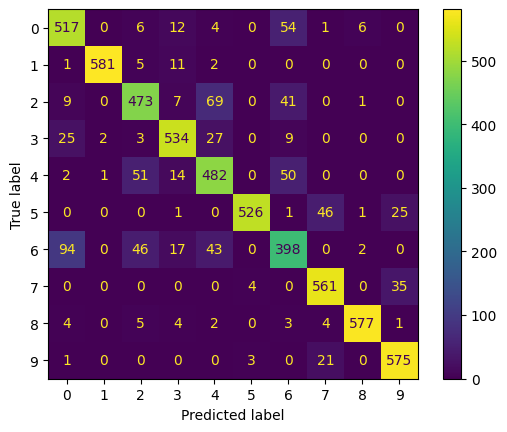

 Accuracy Score: 0.8591666666666666
 Recall per class: [0.87666667 0.97833333 0.79       0.85833333 0.77333333 0.87833333
 0.57       0.93666667 0.965      0.965     ]
 Precision per class: [0.76231884 0.99155405 0.78606965 0.89254766 0.7400319  0.98504673
 0.67058824 0.89064976 0.96661102 0.91037736]
 Macro Recall: 0.8591666666666666
 Macro Precision: 0.8595795208016328


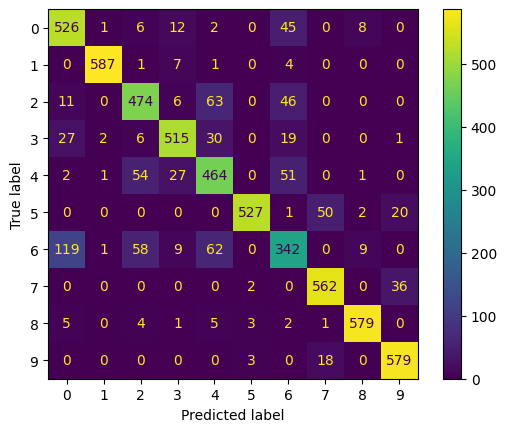

 Accuracy Score: 0.8685
 Recall per class: [0.87666667 0.97333333 0.81       0.90166667 0.77       0.87833333
 0.60333333 0.94833333 0.96666667 0.95666667]
 Precision per class: [0.81804044 0.9982906  0.74654378 0.91850594 0.78305085 0.98504673
 0.65938069 0.9031746  0.97807757 0.90393701]
 Macro Recall: 0.8685
 Macro Precision: 0.8694048206141535


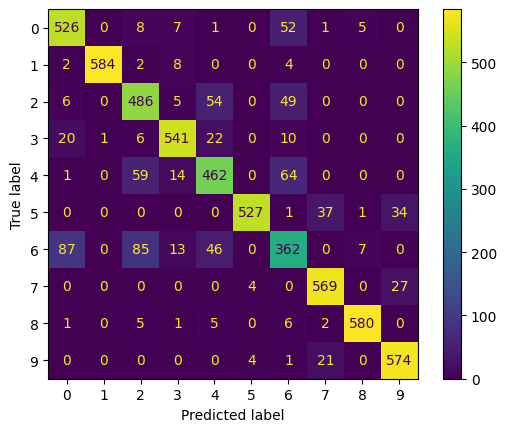

 Accuracy Score: 0.8655
 Recall per class: [0.84       0.96       0.815      0.86       0.81666667 0.84
 0.675      0.94166667 0.94666667 0.96      ]
 Precision per class: [0.79495268 0.99310345 0.79901961 0.89583333 0.77531646 0.984375
 0.69707401 0.874613   0.97427101 0.89440994]
 Macro Recall: 0.8654999999999999
 Macro Precision: 0.8682968489854606


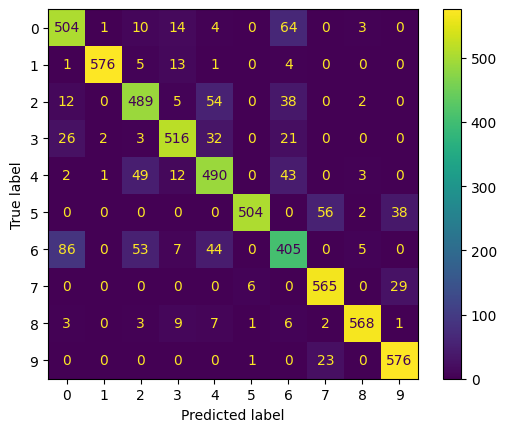

 Accuracy Score: 0.8651666666666666
 Recall per class: [0.88166667 0.95833333 0.76333333 0.895      0.81166667 0.88333333
 0.58       0.95166667 0.96166667 0.965     ]
 Precision per class: [0.78023599 0.99826389 0.77234401 0.90556492 0.74464832 0.97966728
 0.68101761 0.90779014 0.97301855 0.91613924]
 Macro Recall: 0.8651666666666668
 Macro Precision: 0.86586899614094


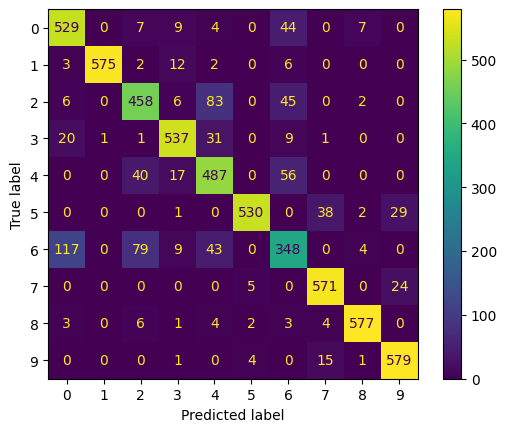

 Accuracy Score: 0.8661666666666666
 Recall per class: [0.875      0.95666667 0.82333333 0.88333333 0.78666667 0.87
 0.60833333 0.94333333 0.95333333 0.96166667]
 Precision per class: [0.78592814 0.98456261 0.77429467 0.88480801 0.80135823 0.99051233
 0.68867925 0.88714734 0.96621622 0.9072327 ]
 Macro Recall: 0.8661666666666665
 Macro Precision: 0.8670739504704887


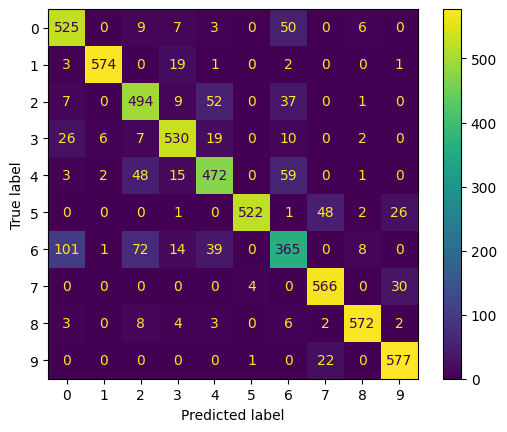

 Accuracy Score: 0.8665
 Recall per class: [0.87666667 0.97166667 0.755      0.885      0.81666667 0.885
 0.60166667 0.94       0.96666667 0.96666667]
 Precision per class: [0.77925926 0.99318569 0.76006711 0.89695946 0.76443058 0.98882682
 0.71062992 0.91262136 0.96989967 0.89506173]
 Macro Recall: 0.8664999999999999
 Macro Precision: 0.8670941590057163


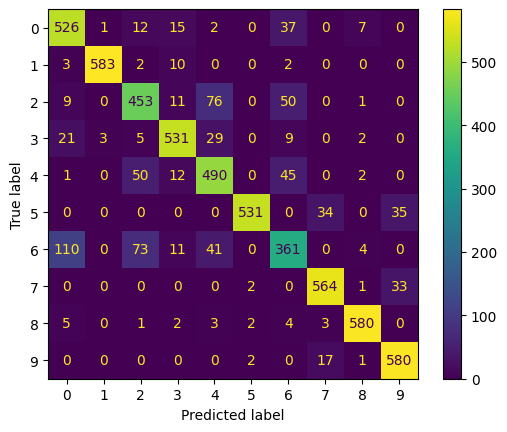

 Accuracy Score: 0.866
 Recall per class: [0.84666667 0.97166667 0.80333333 0.90166667 0.80666667 0.85833333
 0.62166667 0.93333333 0.95333333 0.96333333]
 Precision per class: [0.79004666 0.9914966  0.78501629 0.8986711  0.7819063  0.98659004
 0.68566176 0.89171975 0.97278912 0.88650307]
 Macro Recall: 0.866
 Macro Precision: 0.8670400669787085


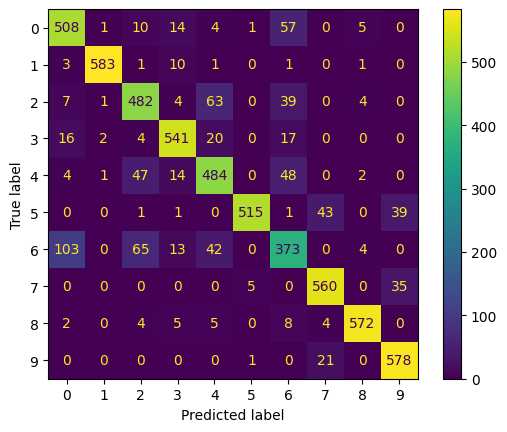

 Accuracy Score: 0.8586666666666667
 Recall per class: [0.86       0.95833333 0.77166667 0.88833333 0.78833333 0.89166667
 0.56       0.94       0.96       0.96833333]
 Precision per class: [0.7806354  0.9965338  0.76151316 0.90338983 0.75318471 0.98165138
 0.63516068 0.90384615 0.95840266 0.91208791]
 Macro Recall: 0.8586666666666666
 Macro Precision: 0.858640568302043


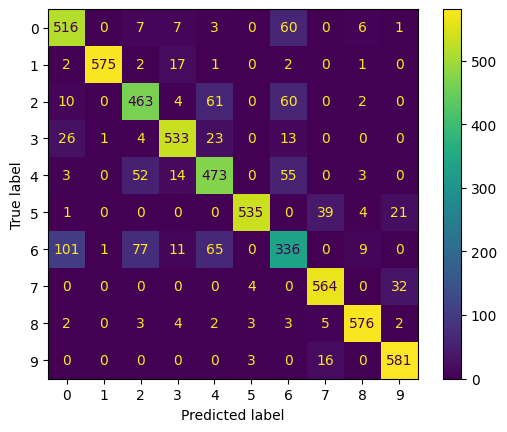

 Fold using k=11 and distance metric = cos distance and PCA variance: 90%
 Total avg Accuracy: 0.8657999999999999
 Total avg Macro Recall: 0.8657999999999999
 Total avg Macro Precision: 0.8666246313622809


In [132]:
skf = StratifiedKFold(n_splits=10)
accuracy=[]
macro_recall=[]
macro_precision=[]
knn_0 = Knn(11,manhatan)
for i, (train_index, test_index) in enumerate(skf.split(flat_x_train, y_train)):
                # Split
                x_train_fold , x_test_fold = flat_x_train[train_index], flat_x_train[test_index]
                y_train_fold , y_test_fold = y_train[train_index], y_train[test_index]
                # Train the pca to train set and tranform train/test set, that will be used for the combinations.
                # Avoid Data Leakage
                pca_0 = PCA(n_components=0.9)
                x_train_fold = pca_0.fit_transform(x_train_fold)
                x_test_fold = pca_0.transform(x_test_fold)

                knn_0.fit(x_train_fold,y_train_fold)
                y_pred = knn_0.predict(x_test_fold)
                acc,re,pre = evaluation(y_pred,y_test_fold)
                accuracy.append(acc)
                macro_recall.append(re)
                macro_precision.append(pre)
print(f" Fold using k=11 and distance metric = manhatan and PCA variance: 90%")
print(f" Total avg Accuracy: {np.mean(accuracy)}")
print(f" Total avg Macro Recall: {np.mean(macro_recall)}")
print(f" Total avg Macro Precision: {np.mean(macro_precision)}") 

#### PCA: 95%, k: 11, Metric: manhatan

 Accuracy Score: 0.8685
 Recall per class: [0.89333333 0.965      0.77333333 0.89333333 0.795      0.89166667
 0.6        0.965      0.93833333 0.97      ]
 Precision per class: [0.78134111 0.99313894 0.74959612 0.91623932 0.78453947 0.99257885
 0.67164179 0.89906832 0.97743056 0.93269231]
 Macro Recall: 0.8685
 Macro Precision: 0.8698266784104798


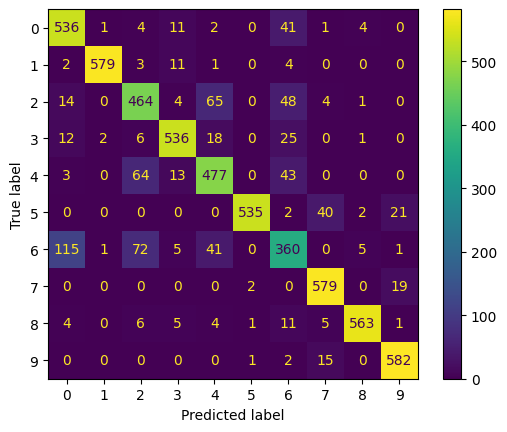

 Accuracy Score: 0.8675
 Recall per class: [0.865      0.97       0.785      0.89       0.78666667 0.85666667
 0.65333333 0.95833333 0.945      0.965     ]
 Precision per class: [0.78995434 0.99487179 0.78369384 0.89297659 0.77631579 0.99805825
 0.67353952 0.89147287 0.98608696 0.91324921]
 Macro Recall: 0.8675
 Macro Precision: 0.8700219161890583


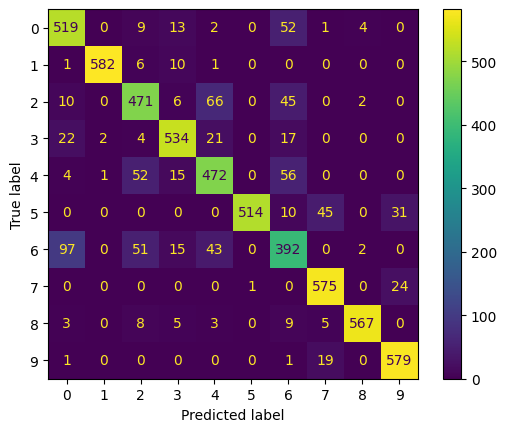

 Accuracy Score: 0.8588333333333333
 Recall per class: [0.88833333 0.975      0.8        0.84333333 0.75666667 0.85166667
 0.60833333 0.94333333 0.94833333 0.97333333]
 Precision per class: [0.76911977 0.99320883 0.78559738 0.88927944 0.75290216 0.99031008
 0.66243194 0.88854003 0.97431507 0.90262751]
 Macro Recall: 0.8588333333333333
 Macro Precision: 0.8608332203407267


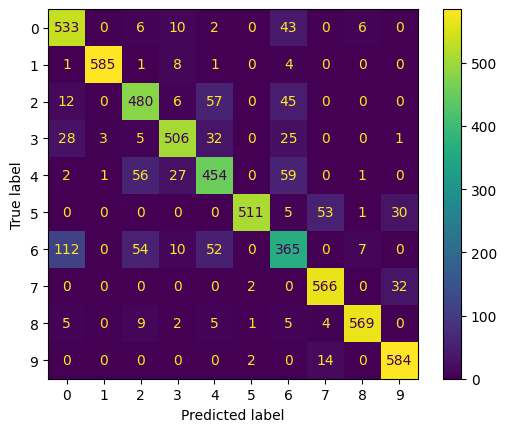

 Accuracy Score: 0.865
 Recall per class: [0.88666667 0.97666667 0.81833333 0.885      0.76666667 0.83
 0.61666667 0.95       0.96166667 0.95833333]
 Precision per class: [0.81097561 0.99322034 0.74733638 0.91709845 0.78098472 0.99005964
 0.67395264 0.88235294 0.98296422 0.89285714]
 Macro Recall: 0.865
 Macro Precision: 0.8671802083891264


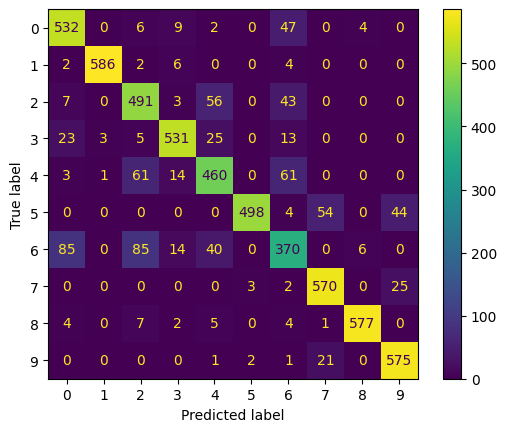

 Accuracy Score: 0.864
 Recall per class: [0.86333333 0.96       0.83333333 0.85333333 0.79333333 0.83166667
 0.645      0.95333333 0.94       0.96666667]
 Precision per class: [0.78129713 0.98969072 0.77399381 0.90619469 0.78547855 0.9940239
 0.68983957 0.88       0.97916667 0.89368259]
 Macro Recall: 0.8640000000000001
 Macro Precision: 0.8673367633897098


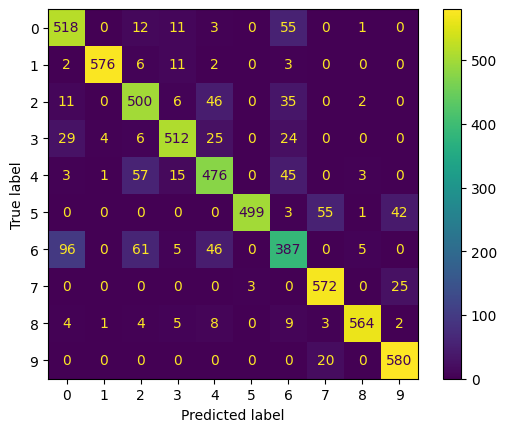

 Accuracy Score: 0.863
 Recall per class: [0.87833333 0.96       0.77166667 0.88333333 0.80166667 0.86333333
 0.58666667 0.97333333 0.945      0.96666667]
 Precision per class: [0.77046784 0.99481865 0.76910299 0.91065292 0.7539185  0.99615385
 0.65427509 0.89296636 0.98266898 0.92651757]
 Macro Recall: 0.8630000000000001
 Macro Precision: 0.8651542744701851


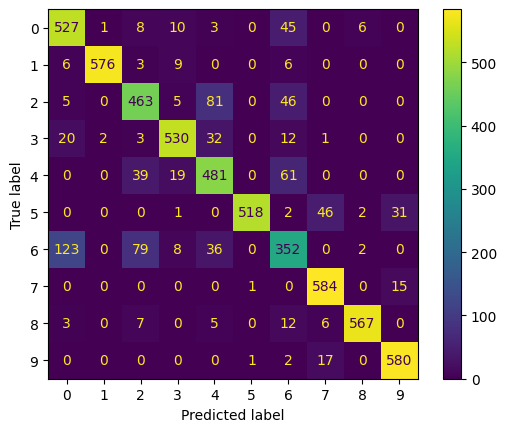

 Accuracy Score: 0.8663333333333333
 Recall per class: [0.88833333 0.96333333 0.81333333 0.875      0.77833333 0.85833333
 0.63       0.95833333 0.94166667 0.95666667]
 Precision per class: [0.8003003  0.98634812 0.76131045 0.88532884 0.80517241 0.99806202
 0.6835443  0.8698941  0.97246127 0.92134831]
 Macro Recall: 0.8663333333333334
 Macro Precision: 0.8683770133226247


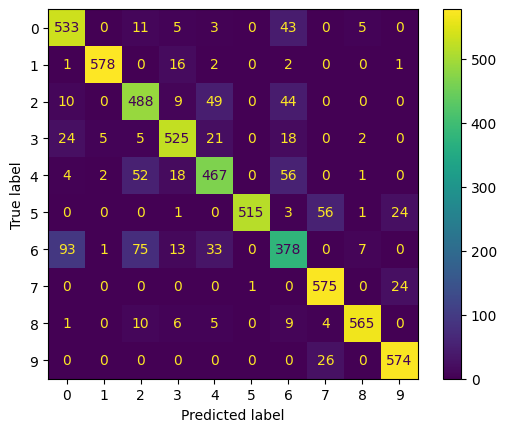

 Accuracy Score: 0.8646666666666667
 Recall per class: [0.87666667 0.97666667 0.76166667 0.87166667 0.81       0.85666667
 0.62166667 0.96       0.94666667 0.965     ]
 Precision per class: [0.77581121 0.99490662 0.7553719  0.90017212 0.78513732 0.99612403
 0.68065693 0.89164087 0.97931034 0.90752351]
 Macro Recall: 0.8646666666666667
 Macro Precision: 0.8666654854939759


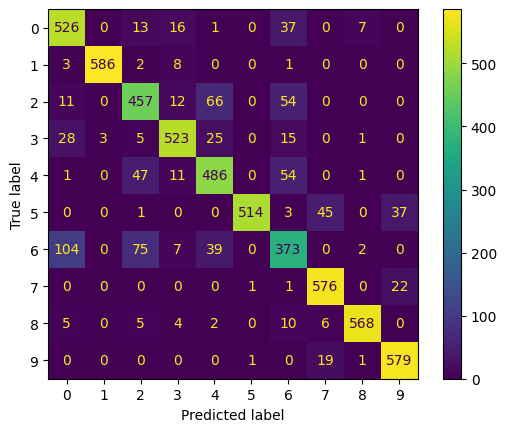

 Accuracy Score: 0.8596666666666667
 Recall per class: [0.845      0.97166667 0.805      0.89166667 0.785      0.82166667
 0.62666667 0.945      0.94333333 0.96166667]
 Precision per class: [0.79095164 0.9914966  0.77033493 0.90831919 0.78762542 0.98797595
 0.63945578 0.87906977 0.98606272 0.88632873]
 Macro Recall: 0.8596666666666668
 Macro Precision: 0.8627620712521298


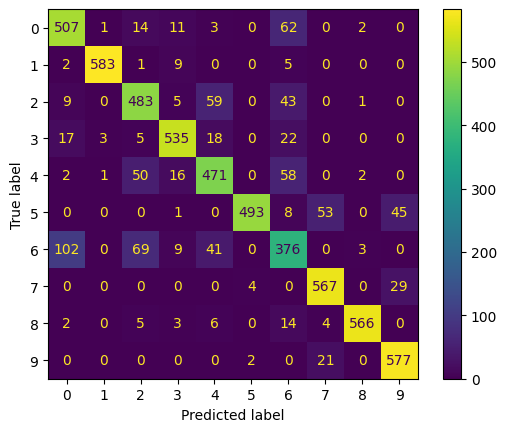

 Accuracy Score: 0.855
 Recall per class: [0.86333333 0.96       0.79       0.88       0.76       0.85833333
 0.56666667 0.96166667 0.945      0.965     ]
 Precision per class: [0.78247734 0.99653979 0.73374613 0.9025641  0.7755102  0.99613153
 0.61041293 0.88632873 0.96428571 0.92197452]
 Macro Recall: 0.8550000000000001
 Macro Precision: 0.8569970986508881


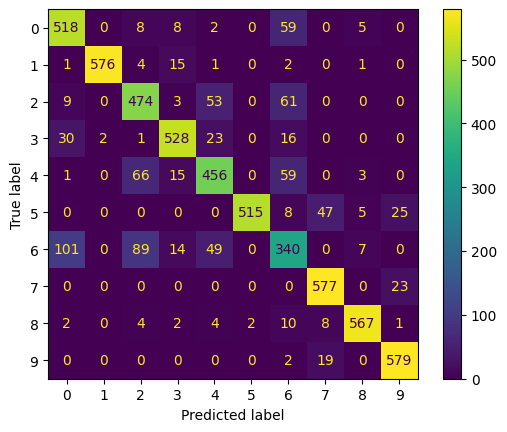

 Fold using k=11 and distance metric = manhatan and PCA variance: 95%
 Total avg Accuracy: 0.8632500000000001
 Total avg Macro Recall: 0.8632500000000001
 Total avg Macro Precision: 0.8655154729908905


In [133]:
skf = StratifiedKFold(n_splits=10)
accuracy=[]
macro_recall=[]
macro_precision=[]
knn_0 = Knn(11,manhatan)
for i, (train_index, test_index) in enumerate(skf.split(flat_x_train, y_train)):
                # Split
                x_train_fold , x_test_fold = flat_x_train[train_index], flat_x_train[test_index]
                y_train_fold , y_test_fold = y_train[train_index], y_train[test_index]
                # Train the pca to train set and tranform train/test set, that will be used for the combinations.
                # Avoid Data Leakage
                pca_0 = PCA(n_components=0.95)
                x_train_fold = pca_0.fit_transform(x_train_fold)
                x_test_fold = pca_0.transform(x_test_fold)

                knn_0.fit(x_train_fold,y_train_fold)
                y_pred = knn_0.predict(x_test_fold)
                acc,re,pre = evaluation(y_pred,y_test_fold)
                accuracy.append(acc)
                macro_recall.append(re)
                macro_precision.append(pre)
print(f" Fold using k=11 and distance metric = manhatan and PCA variance: 95%")
print(f" Total avg Accuracy: {np.mean(accuracy)}")
print(f" Total avg Macro Recall: {np.mean(macro_recall)}")
print(f" Total avg Macro Precision: {np.mean(macro_precision)}") 

#### PCA: 95%, k: 7, Metric: manhatan

 Accuracy Score: 0.8686666666666667
 Recall per class: [0.89       0.96833333 0.78333333 0.88833333 0.79333333 0.89166667
 0.58833333 0.97166667 0.94166667 0.97      ]
 Precision per class: [0.7716763  0.99656947 0.73899371 0.91111111 0.8013468  0.99074074
 0.67238095 0.90108192 0.97920277 0.93719807]
 Macro Recall: 0.8686666666666667
 Macro Precision: 0.8700301842251369


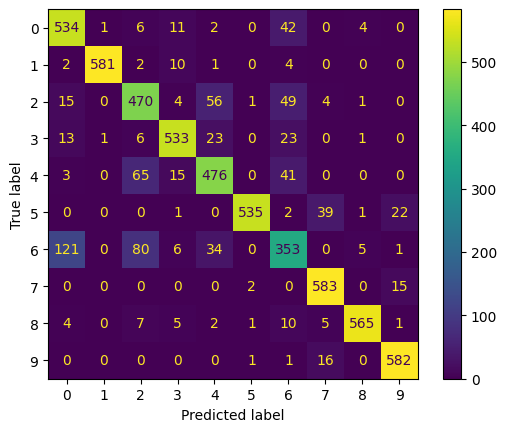

 Accuracy Score: 0.8696666666666667
 Recall per class: [0.86666667 0.97333333 0.79666667 0.88333333 0.79333333 0.86
 0.665      0.95333333 0.94166667 0.96333333]
 Precision per class: [0.79877112 0.99658703 0.77471637 0.89830508 0.78032787 0.99806576
 0.69512195 0.88819876 0.98603839 0.90595611]
 Macro Recall: 0.8696666666666666
 Macro Precision: 0.8722088455471416


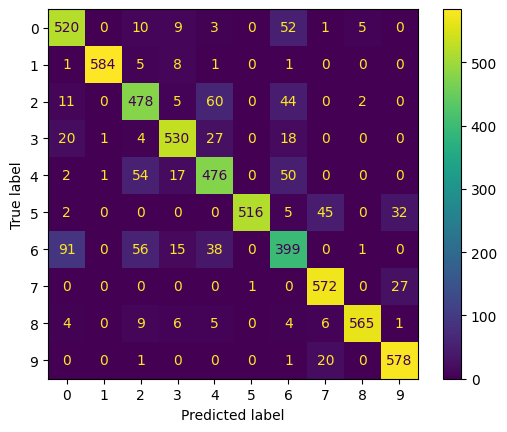

 Accuracy Score: 0.858
 Recall per class: [0.87166667 0.97666667 0.80333333 0.84833333 0.76333333 0.86166667
 0.59333333 0.94166667 0.95166667 0.96833333]
 Precision per class: [0.76017442 0.99153976 0.77993528 0.89455185 0.76333333 0.98852772
 0.65201465 0.88697017 0.97274276 0.90639626]
 Macro Recall: 0.858
 Macro Precision: 0.8596186200485271


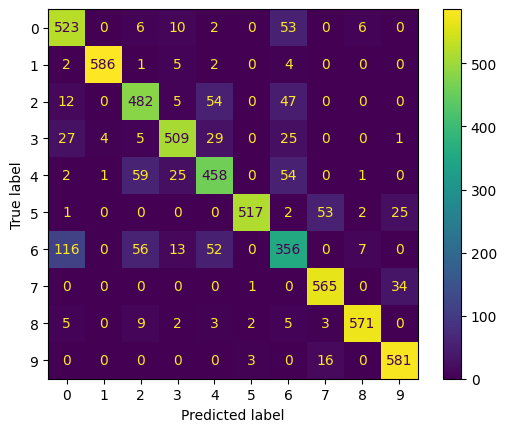

 Accuracy Score: 0.8651666666666666
 Recall per class: [0.87333333 0.97833333 0.81166667 0.89       0.77166667 0.845
 0.61166667 0.95166667 0.95666667 0.96166667]
 Precision per class: [0.79878049 0.99660441 0.74237805 0.91438356 0.7860781  0.99023438
 0.67216117 0.89358372 0.98119658 0.89596273]
 Macro Recall: 0.8651666666666668
 Macro Precision: 0.8671363196809295


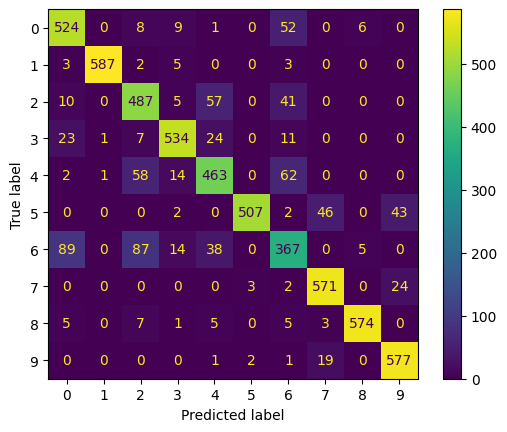

 Accuracy Score: 0.8711666666666666
 Recall per class: [0.88       0.96333333 0.82666667 0.85666667 0.795      0.84166667
 0.685      0.95666667 0.94       0.96666667]
 Precision per class: [0.79518072 0.98972603 0.78110236 0.90333919 0.78325123 0.99605523
 0.73001776 0.88717156 0.98086957 0.89644513]
 Macro Recall: 0.8711666666666666
 Macro Precision: 0.8743158782042567


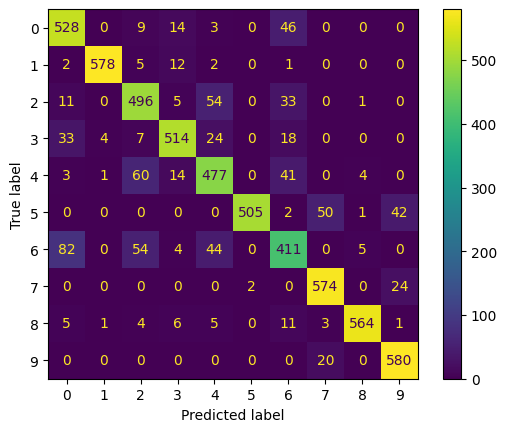

 Accuracy Score: 0.865
 Recall per class: [0.88333333 0.96333333 0.77166667 0.89       0.80166667 0.865
 0.58833333 0.97166667 0.94833333 0.96666667]
 Precision per class: [0.77941176 0.99312715 0.76782753 0.90508475 0.76107595 0.99616123
 0.66104869 0.89417178 0.98272884 0.92503987]
 Macro Recall: 0.8649999999999999
 Macro Precision: 0.8665677548550919


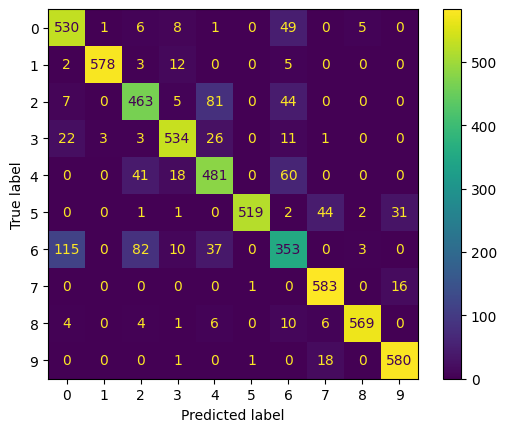

 Accuracy Score: 0.8711666666666666
 Recall per class: [0.88833333 0.96666667 0.81833333 0.87833333 0.80333333 0.86666667
 0.63       0.96       0.945      0.955     ]
 Precision per class: [0.79552239 0.98305085 0.77444795 0.89473684 0.81144781 0.99616858
 0.6961326  0.87537994 0.9742268  0.92718447]
 Macro Recall: 0.8711666666666666
 Macro Precision: 0.8728298227010635


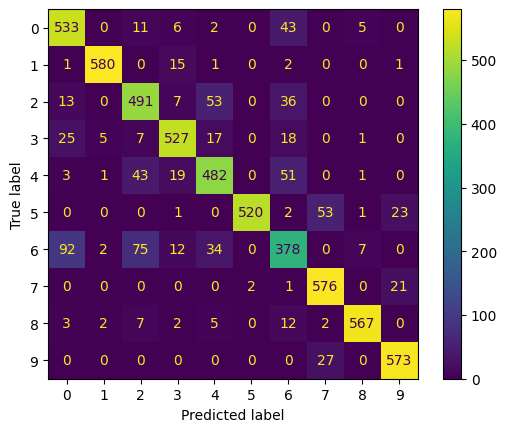

 Accuracy Score: 0.8645
 Recall per class: [0.86       0.975      0.77       0.87333333 0.815      0.865
 0.61833333 0.95833333 0.95       0.96      ]
 Precision per class: [0.77593985 0.99659284 0.75367047 0.90814558 0.77866242 0.99425287
 0.67824497 0.89147287 0.98106713 0.90708661]
 Macro Recall: 0.8644999999999999
 Macro Precision: 0.8665135622829763


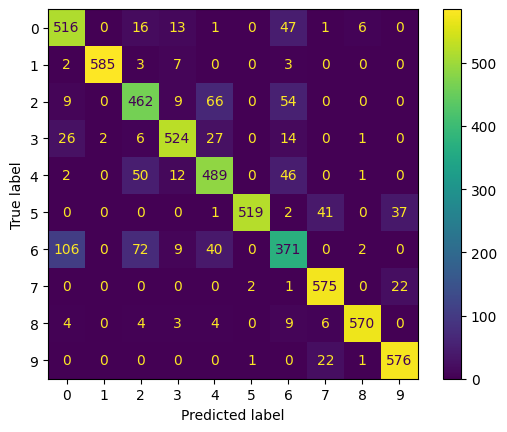

 Accuracy Score: 0.862
 Recall per class: [0.83666667 0.97666667 0.80666667 0.87666667 0.79666667 0.83666667
 0.63666667 0.94333333 0.945      0.965     ]
 Precision per class: [0.78315133 0.98986486 0.77564103 0.91958042 0.78360656 0.99013807
 0.64527027 0.88993711 0.99125874 0.8853211 ]
 Macro Recall: 0.8620000000000001
 Macro Precision: 0.8653769479942228


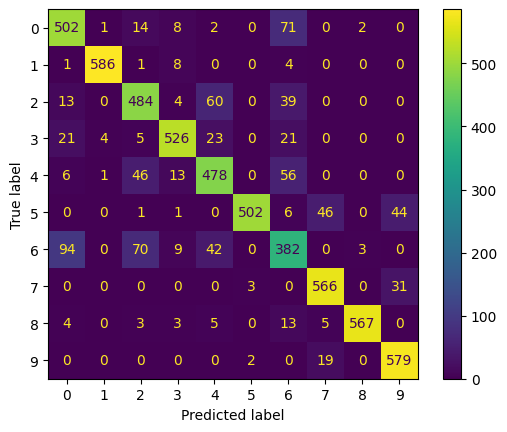

 Accuracy Score: 0.8578333333333333
 Recall per class: [0.865      0.96166667 0.77666667 0.89333333 0.75833333 0.87833333
 0.57666667 0.95666667 0.94666667 0.965     ]
 Precision per class: [0.78162651 0.99482759 0.73501577 0.91001698 0.76988156 0.99433962
 0.61675579 0.896875   0.97260274 0.92344498]
 Macro Recall: 0.8578333333333333
 Macro Precision: 0.8595386531384408


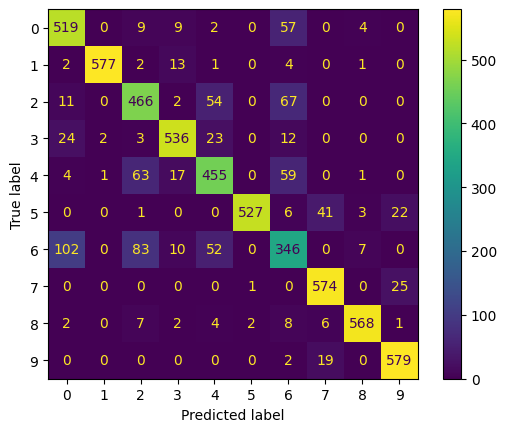

 Fold using k=7 and distance metric = manhatan and PCA variance: 95%
 Total avg Accuracy: 0.8653166666666667
 Total avg Macro Recall: 0.8653166666666667
 Total avg Macro Precision: 0.8674136588677787


In [134]:
skf = StratifiedKFold(n_splits=10)
accuracy=[]
macro_recall=[]
macro_precision=[]
knn_0 = Knn(7,manhatan)
for i, (train_index, test_index) in enumerate(skf.split(flat_x_train, y_train)):
                # Split
                x_train_fold , x_test_fold = flat_x_train[train_index], flat_x_train[test_index]
                y_train_fold , y_test_fold = y_train[train_index], y_train[test_index]
                # Train the pca to train set and tranform train/test set, that will be used for the combinations.
                # Avoid Data Leakage
                pca_0 = PCA(n_components=0.95)
                x_train_fold = pca_0.fit_transform(x_train_fold)
                x_test_fold = pca_0.transform(x_test_fold)

                knn_0.fit(x_train_fold,y_train_fold)
                y_pred = knn_0.predict(x_test_fold)
                acc,re,pre = evaluation(y_pred,y_test_fold)
                accuracy.append(acc)
                macro_recall.append(re)
                macro_precision.append(pre)
print(f" Fold using k=7 and distance metric = manhatan and PCA variance: 95%")
print(f" Total avg Accuracy: {np.mean(accuracy)}")
print(f" Total avg Macro Recall: {np.mean(macro_recall)}")
print(f" Total avg Macro Precision: {np.mean(macro_precision)}") 

### Evaluation on test set. PCA: 90%, k:11 , Metric: Manhattan

For 10,000 test samples the predict time needed is: 49.433 sec
For 1 test sample the predict time needed is approximently: 0.005 sec, 4.943 msec
 The Knn + PCA needed: 49.930941104888916 sec
 Knn with PCA 90%, k = 11 and distance = manhatan
 Accuracy Score: 0.8633
 Recall per class: [0.856 0.966 0.79  0.889 0.785 0.881 0.584 0.957 0.963 0.962]
 Precision per class: [0.79185939 0.99690402 0.75815739 0.8943662  0.76660156 0.99323563
 0.66063348 0.89690722 0.96107784 0.91619048]
 Macro Recall: 0.8633000000000001
 Macro Precision: 0.8635933210404643


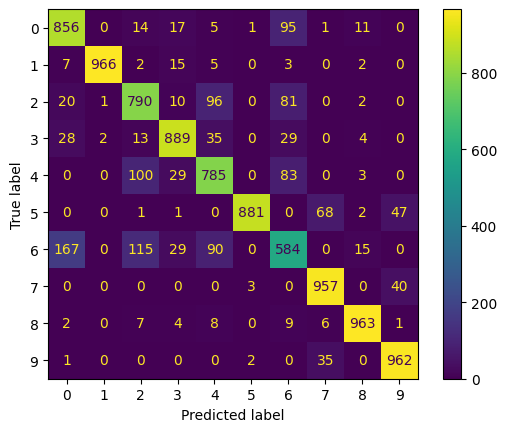

(0.8633, 0.8633000000000001, 0.8635933210404643)


In [20]:
# Flaten the 28x28 image to 784 vector
x_train_flat = flattening(x_train)
x_test_flat = flattening(x_test)

# Normalize the pixels values
x_train_flat, x_test_flat = norm(x_train_flat,x_test_flat)

start_time_whole = time.time()
knn_optimal_90 = Knn(11,manhatan)
pca_optimal_90 = PCA(n_components=0.9)
x_train_opt_90 = pca_optimal_90.fit_transform(x_train_flat)
x_test_opt_90 = pca_optimal_90.transform(x_test_flat)
knn_optimal_90.fit(x_train_opt_90,y_train)
start_time_knn = time.time()
y_preds_opt_90 = knn_optimal_90.predict(x_test_opt_90)
print(f"For 10,000 test samples the predict time needed is: {time.time()-start_time_knn:.3f} sec")
print(f"For 1 test sample the predict time needed is approximently: {(time.time()-start_time_knn)/10000 :.3f} sec, {(time.time()-start_time_knn)/10000 * 1000:.3f} msec")
print(f" The Knn + PCA needed: {time.time()-start_time_whole} sec")
print(f" Knn with PCA 90%, k = 11 and distance = manhatan")
print(evaluation(y_preds_opt_90, y_test))

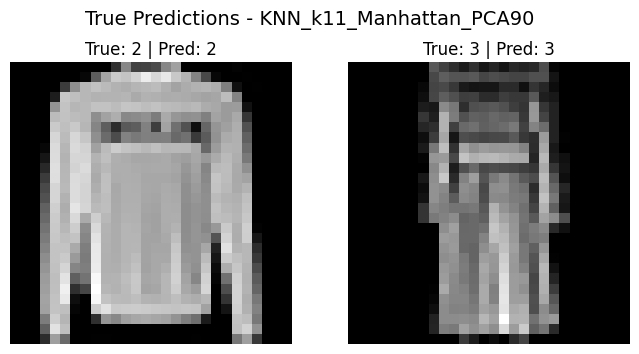

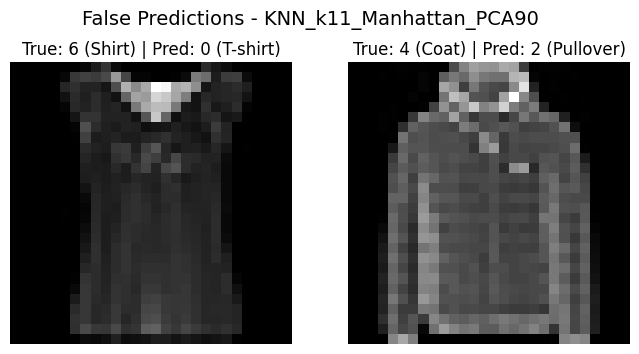

In [22]:
plot_and_save_analysis(y_test,y_preds_opt_90,x_test_flat,"KNN_k11_Manhattan_PCA90")

## 10 Folds Cross Validation USing mean per axis

We will calculate the mean brightness per column and per axis as the feature extraction technique

In [20]:
x_train_norm, x_test_norm = norm(x_train,x_test)
x_train_per_axis = mean_per_axis(x_train_norm)
x_test_per_axis = mean_per_axis(x_test_norm)

### 10 Folds Cross Validation

In [21]:
x_train_half_per_axis, _ , y_train_half_per_axis , _ = train_test_split(x_train_per_axis, y_train, train_size=30000, stratify=y_train, random_state=42)
print(f"Training set class bincount: {np.bincount(y_train_half_per_axis)}")

Training set class bincount: [3000 3000 3000 3000 3000 3000 3000 3000 3000 3000]


Fold 0:
 Accuracy Score: 0.813
 Recall per class: [0.84666667 0.94       0.71       0.86666667 0.65       0.84666667
 0.49333333 0.91666667 0.91333333 0.94666667]
 Precision per class: [0.73410405 1.         0.67192429 0.82018927 0.62903226 0.93726937
 0.62711864 0.86750789 0.96819788 0.8847352 ]
 Macro Recall: 0.813
 Macro Precision: 0.8140078854523785


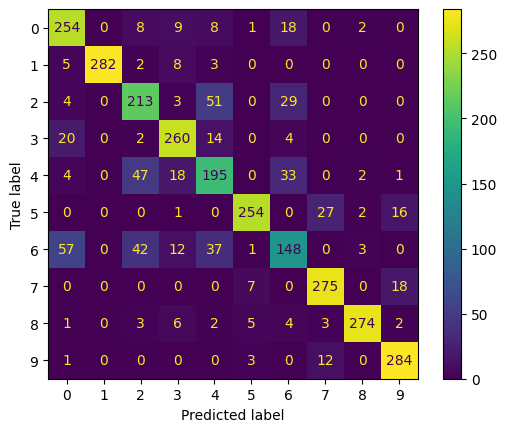

Fold 1:
 Accuracy Score: 0.8036666666666666
 Recall per class: [0.85666667 0.95       0.63666667 0.84333333 0.68666667 0.82666667
 0.49333333 0.91333333 0.90666667 0.92333333]
 Precision per class: [0.73638968 0.98615917 0.68214286 0.84615385 0.61127596 0.91851852
 0.56704981 0.83536585 0.97841727 0.89644013]
 Macro Recall: 0.8036666666666668
 Macro Precision: 0.8057913098295384


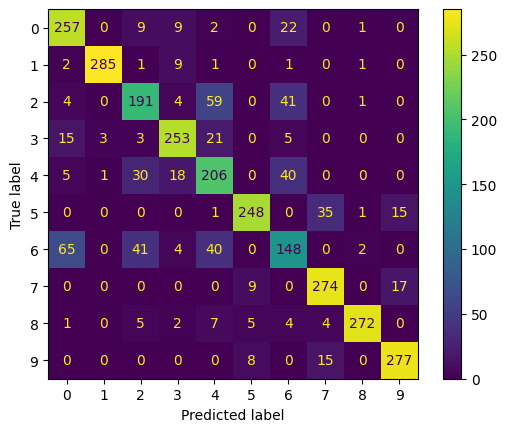

Fold 2:
 Accuracy Score: 0.805
 Recall per class: [0.81666667 0.96666667 0.66       0.85666667 0.65       0.83666667
 0.51333333 0.91       0.89       0.95      ]
 Precision per class: [0.71637427 1.         0.66666667 0.85099338 0.62903226 0.9330855
 0.56       0.86392405 0.95698925 0.890625  ]
 Macro Recall: 0.8049999999999999
 Macro Precision: 0.806769037102395


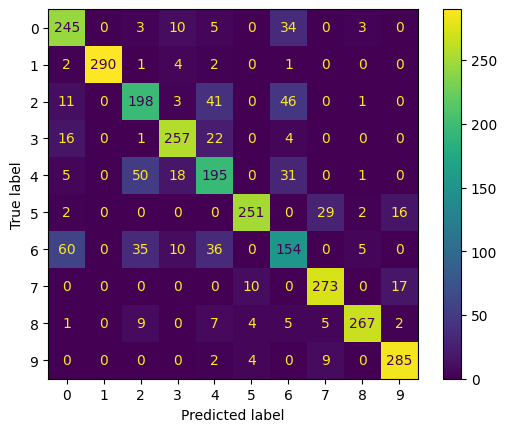

Fold 3:
 Accuracy Score: 0.8013333333333333
 Recall per class: [0.80333333 0.95666667 0.69       0.8        0.67666667 0.83333333
 0.48666667 0.91333333 0.89666667 0.95666667]
 Precision per class: [0.72155689 0.98287671 0.6742671  0.79734219 0.62848297 0.9469697
 0.56589147 0.85893417 0.97818182 0.87767584]
 Macro Recall: 0.8013333333333333
 Macro Precision: 0.8032178862638085


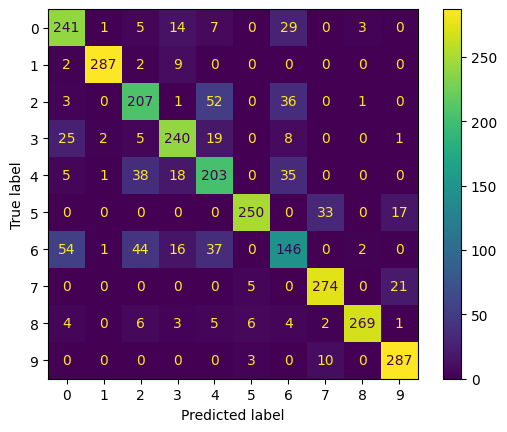

Fold 4:
 Accuracy Score: 0.81
 Recall per class: [0.84       0.96666667 0.70666667 0.80333333 0.67       0.8
 0.54333333 0.93       0.91       0.93      ]
 Precision per class: [0.71590909 0.98639456 0.67948718 0.84859155 0.67905405 0.94488189
 0.58633094 0.84802432 0.97849462 0.86645963]
 Macro Recall: 0.8099999999999999
 Macro Precision: 0.8133627823679335


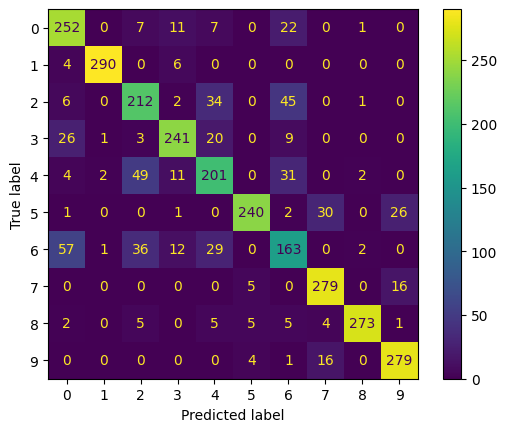

Fold 5:
 Accuracy Score: 0.8083333333333333
 Recall per class: [0.81666667 0.94666667 0.70333333 0.84       0.67666667 0.83
 0.50333333 0.91333333 0.9        0.95333333]
 Precision per class: [0.70605187 0.98611111 0.72758621 0.80769231 0.634375   0.92565056
 0.58527132 0.87539936 0.96428571 0.88544892]
 Macro Recall: 0.8083333333333333
 Macro Precision: 0.8097872366065841


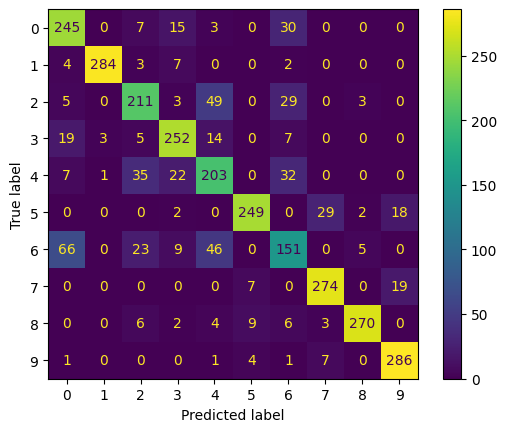

Fold 6:
 Accuracy Score: 0.803
 Recall per class: [0.80666667 0.93666667 0.66666667 0.83333333 0.68       0.83
 0.51666667 0.93333333 0.91       0.91666667]
 Precision per class: [0.73780488 0.98251748 0.6779661  0.81967213 0.63157895 0.91544118
 0.56776557 0.86153846 0.97849462 0.87579618]
 Macro Recall: 0.8029999999999999
 Macro Precision: 0.8048575548551622


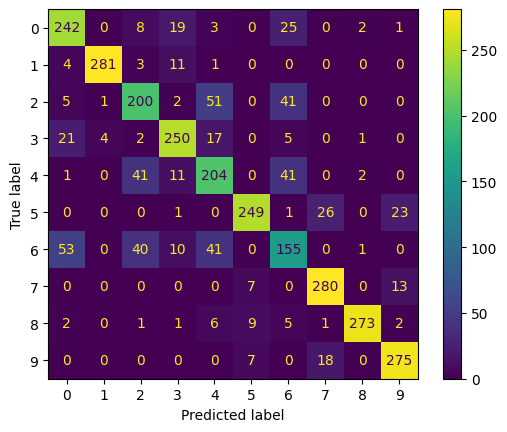

Fold 7:
 Accuracy Score: 0.8163333333333334
 Recall per class: [0.85333333 0.97       0.68333333 0.83666667 0.68       0.86333333
 0.48       0.91333333 0.94333333 0.94      ]
 Precision per class: [0.72316384 0.98310811 0.66775244 0.83112583 0.68       0.94181818
 0.59504132 0.87820513 0.95286195 0.8952381 ]
 Macro Recall: 0.8163333333333332
 Macro Precision: 0.8148314901164738


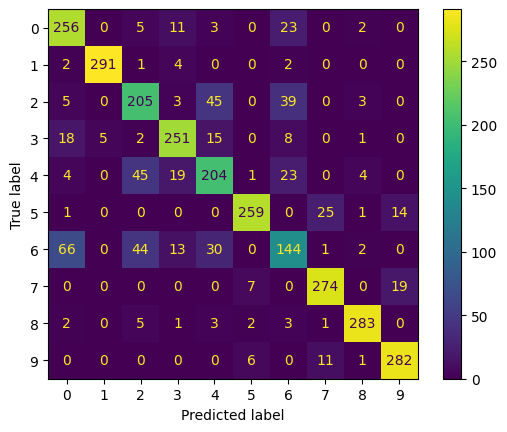

Fold 8:
 Accuracy Score: 0.8103333333333333
 Recall per class: [0.81666667 0.94666667 0.68333333 0.85666667 0.67333333 0.82333333
 0.53666667 0.90333333 0.9        0.96333333]
 Precision per class: [0.73573574 0.99300699 0.70205479 0.86824324 0.61212121 0.9391635
 0.60074627 0.85759494 0.94736842 0.87311178]
 Macro Recall: 0.8103333333333333
 Macro Precision: 0.8129146885622142


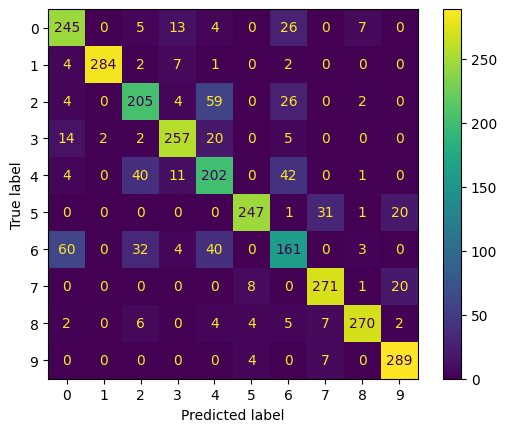

Fold 9:
 Accuracy Score: 0.7936666666666666
 Recall per class: [0.81666667 0.96       0.70333333 0.81333333 0.67       0.80333333
 0.41333333 0.90333333 0.91       0.94333333]
 Precision per class: [0.70809249 0.99310345 0.62241888 0.87142857 0.61280488 0.94140625
 0.53679654 0.85488959 0.96126761 0.86018237]
 Macro Recall: 0.7936666666666666
 Macro Precision: 0.7962390615514765


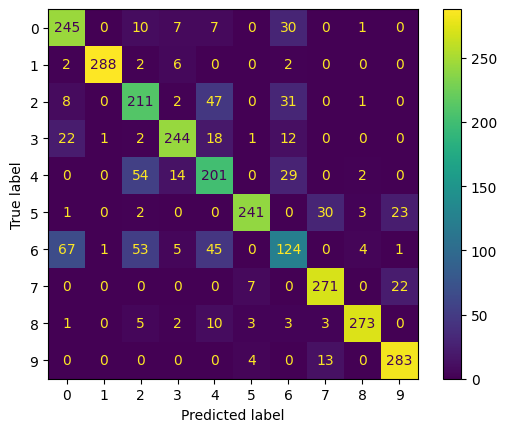

 Fold using k=5 and distance metric = <function euclidean at 0x72e3aa8f9bc0>
 Total avg Accuracy: 0.8064666666666666
 Total avg Macro Recall: 0.8064666666666666
 Total avg Macro Precision: 0.8081778932707964
Fold 0:
 Accuracy Score: 0.8283333333333334
 Recall per class: [0.86333333 0.96666667 0.78666667 0.85       0.72333333 0.76666667
 0.49       0.92666667 0.95333333 0.95666667]
 Precision per class: [0.76627219 0.99656357 0.7195122  0.84717608 0.64201183 0.97457627
 0.71707317 0.86335404 0.94389439 0.84911243]
 Macro Recall: 0.8283333333333334
 Macro Precision: 0.8319546167067646


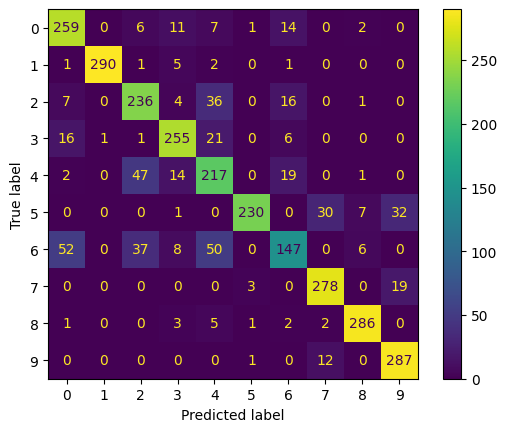

Fold 1:
 Accuracy Score: 0.813
 Recall per class: [0.86       0.95       0.71       0.81666667 0.76333333 0.71666667
 0.52333333 0.92       0.93       0.94      ]
 Precision per class: [0.74782609 0.98275862 0.76071429 0.85964912 0.62228261 0.96846847
 0.65145228 0.81656805 0.96206897 0.82697947]
 Macro Recall: 0.813
 Macro Precision: 0.819876796048456


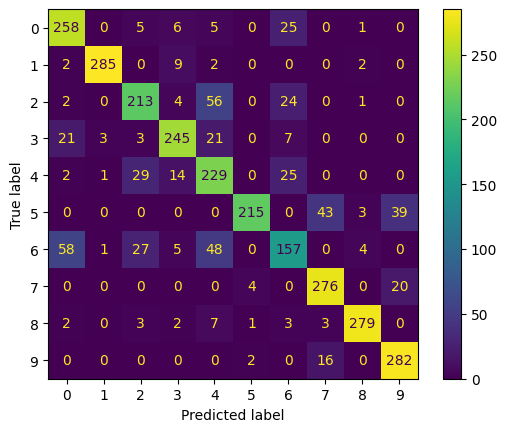

Fold 2:
 Accuracy Score: 0.822
 Recall per class: [0.85333333 0.96666667 0.69333333 0.86333333 0.78666667 0.69666667
 0.56333333 0.91       0.91333333 0.97333333]
 Precision per class: [0.75294118 1.         0.73239437 0.89003436 0.6519337  0.97663551
 0.68699187 0.84520124 0.93835616 0.81564246]
 Macro Recall: 0.8220000000000001
 Macro Precision: 0.8290130853398002


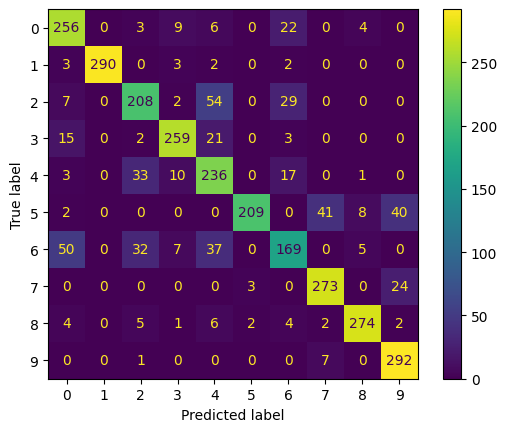

Fold 3:
 Accuracy Score: 0.8223333333333334
 Recall per class: [0.82666667 0.97666667 0.73666667 0.83       0.78       0.75333333
 0.51333333 0.91333333 0.93333333 0.96      ]
 Precision per class: [0.72727273 0.98322148 0.74161074 0.87062937 0.65915493 0.99122807
 0.65811966 0.8404908  0.97560976 0.82997118]
 Macro Recall: 0.8223333333333332
 Macro Precision: 0.8277308705739529


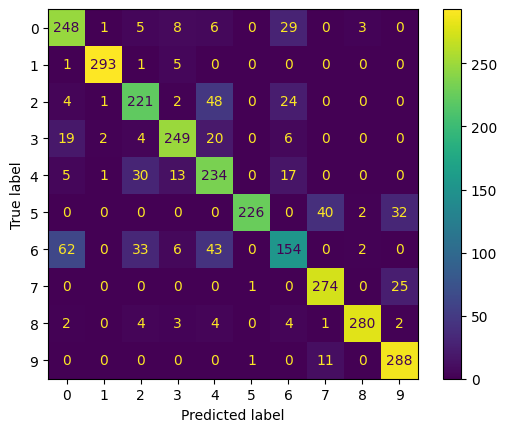

Fold 4:
 Accuracy Score: 0.819
 Recall per class: [0.82       0.98       0.73666667 0.86       0.73       0.72
 0.50333333 0.92333333 0.94       0.97666667]
 Precision per class: [0.74320242 0.98989899 0.70833333 0.84313725 0.66363636 0.96860987
 0.66519824 0.85758514 0.94630872 0.83002833]
 Macro Recall: 0.819
 Macro Precision: 0.8215938654808388


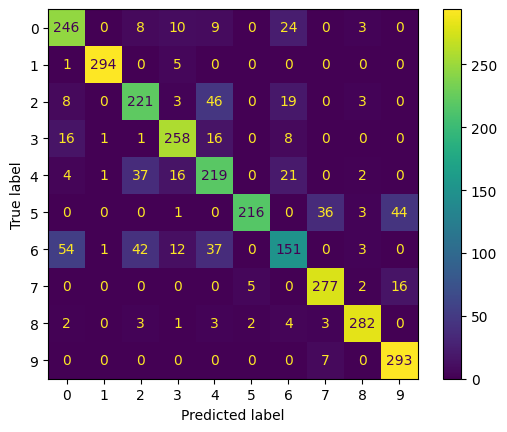

Fold 5:
 Accuracy Score: 0.815
 Recall per class: [0.82333333 0.96       0.75333333 0.87       0.72666667 0.71
 0.49       0.91       0.94       0.96666667]
 Precision per class: [0.72861357 0.98293515 0.72903226 0.82594937 0.68125    0.96818182
 0.64757709 0.86942675 0.94630872 0.79889807]
 Macro Recall: 0.8149999999999998
 Macro Precision: 0.8178172806801023


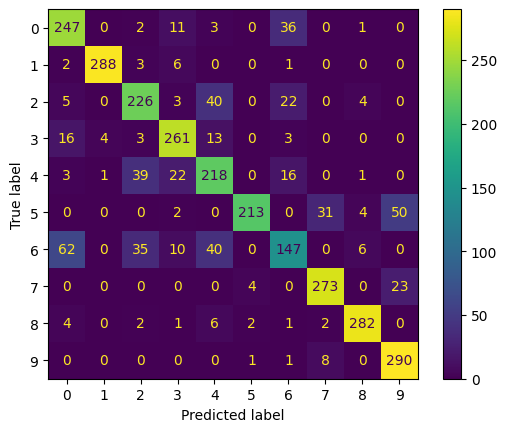

Fold 6:
 Accuracy Score: 0.816
 Recall per class: [0.83666667 0.96333333 0.72       0.88333333 0.74333333 0.70666667
 0.48666667 0.91666667 0.96       0.94333333]
 Precision per class: [0.77230769 0.98634812 0.69677419 0.84935897 0.67575758 0.95927602
 0.64317181 0.86477987 0.93811075 0.79271709]
 Macro Recall: 0.8160000000000001
 Macro Precision: 0.8178602093340711


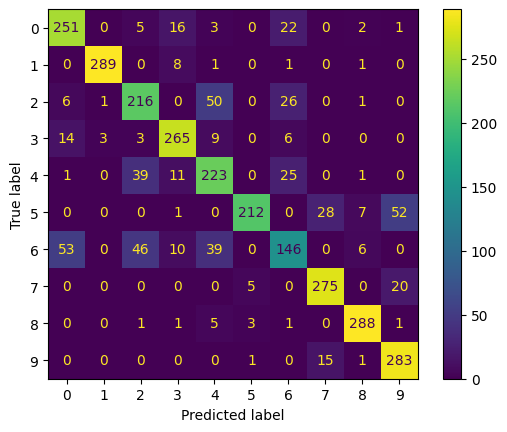

Fold 7:
 Accuracy Score: 0.8276666666666667
 Recall per class: [0.85666667 0.96666667 0.75333333 0.85333333 0.77       0.74666667
 0.48333333 0.91666667 0.95666667 0.97333333]
 Precision per class: [0.75146199 0.98305085 0.71069182 0.86486486 0.68545994 0.96969697
 0.7038835  0.87301587 0.93485342 0.82719547]
 Macro Recall: 0.8276666666666666
 Macro Precision: 0.8304174690654786


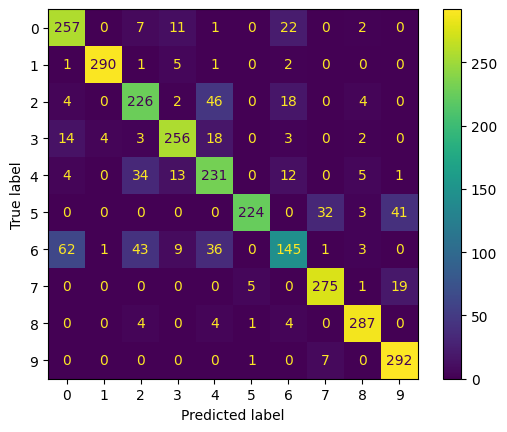

Fold 8:
 Accuracy Score: 0.808
 Recall per class: [0.83       0.97333333 0.70333333 0.83666667 0.73666667 0.72
 0.46333333 0.91       0.94       0.96666667]
 Precision per class: [0.71757925 0.98648649 0.69636964 0.89007092 0.64057971 0.96428571
 0.63181818 0.84       0.91856678 0.82621083]
 Macro Recall: 0.808
 Macro Precision: 0.8111967503860409


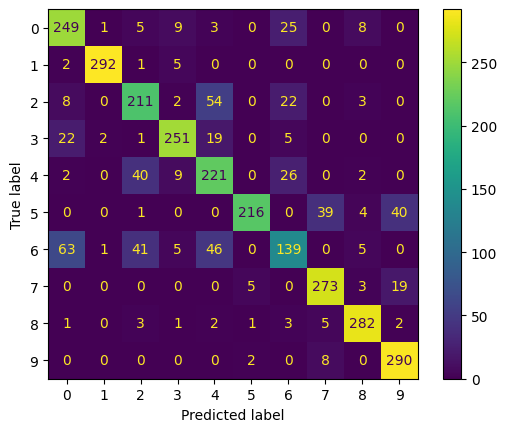

Fold 9:
 Accuracy Score: 0.805
 Recall per class: [0.77333333 0.96333333 0.75       0.81666667 0.77333333 0.71666667
 0.44       0.92333333 0.93666667 0.95666667]
 Precision per class: [0.7030303  0.97635135 0.703125   0.84775087 0.64804469 0.99078341
 0.61971831 0.83939394 0.94612795 0.82      ]
 Macro Recall: 0.805
 Macro Precision: 0.8094325817690278


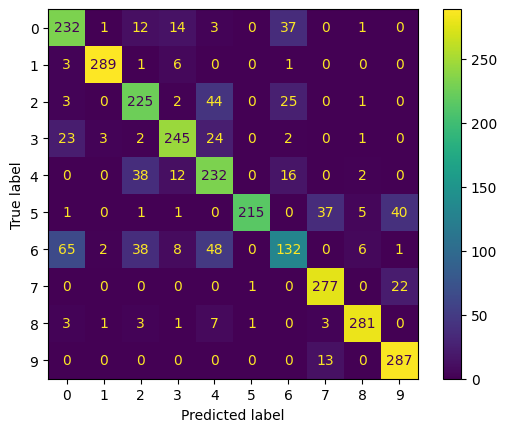

 Fold using k=5 and distance metric = <function cos_distance at 0x72e3aa8f9c60>
 Total avg Accuracy: 0.8176333333333334
 Total avg Macro Recall: 0.8176333333333334
 Total avg Macro Precision: 0.8216893525384533
Fold 0:
 Accuracy Score: 0.8196666666666667
 Recall per class: [0.83666667 0.95333333 0.74666667 0.84       0.65       0.85
 0.51       0.91666667 0.93666667 0.95666667]
 Precision per class: [0.72126437 0.98281787 0.67878788 0.82894737 0.66552901 0.95505618
 0.64556962 0.86750789 0.96563574 0.89130435]
 Macro Recall: 0.8196666666666668
 Macro Precision: 0.8202420267801218


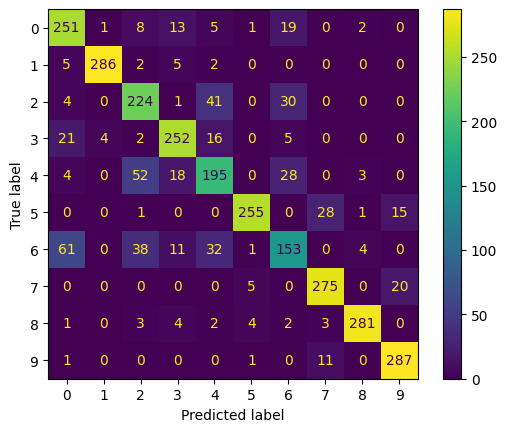

Fold 1:
 Accuracy Score: 0.821
 Recall per class: [0.86       0.95       0.7        0.81333333 0.69666667 0.84
 0.55666667 0.92333333 0.92333333 0.94666667]
 Precision per class: [0.74782609 0.98275862 0.72164948 0.86219081 0.66987179 0.9509434
 0.57388316 0.84969325 0.97879859 0.9044586 ]
 Macro Recall: 0.8210000000000001
 Macro Precision: 0.8242073794345639


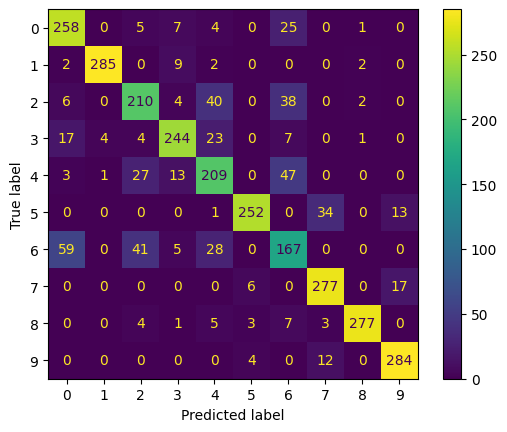

Fold 2:
 Accuracy Score: 0.8136666666666666
 Recall per class: [0.82       0.96666667 0.66       0.84666667 0.68333333 0.84
 0.52666667 0.92666667 0.90333333 0.96333333]
 Precision per class: [0.72566372 0.99656357 0.66       0.86101695 0.63271605 0.95454545
 0.59848485 0.86335404 0.97132616 0.89751553]
 Macro Recall: 0.8136666666666666
 Macro Precision: 0.8161186322354826


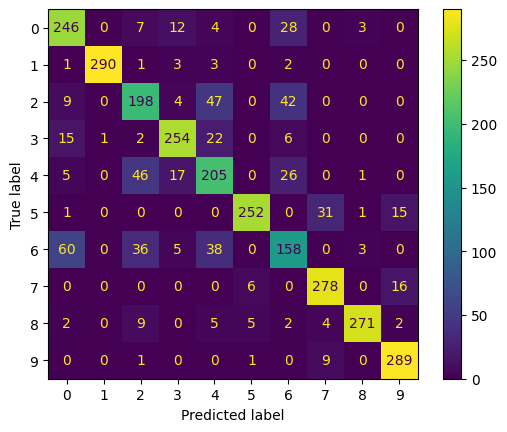

Fold 3:
 Accuracy Score: 0.8283333333333334
 Recall per class: [0.84333333 0.97       0.73       0.83333333 0.74       0.86333333
 0.51       0.92666667 0.91       0.95666667]
 Precision per class: [0.75522388 0.97651007 0.68867925 0.86805556 0.65875371 0.95571956
 0.64016736 0.87974684 0.98201439 0.896875  ]
 Macro Recall: 0.8283333333333334
 Macro Precision: 0.8301745602893051


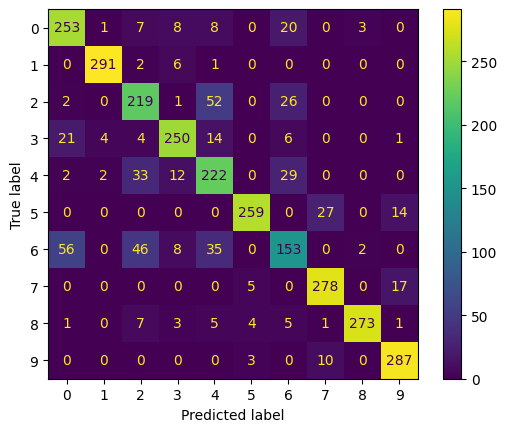

Fold 4:
 Accuracy Score: 0.816
 Recall per class: [0.85       0.97       0.7        0.81333333 0.68       0.81
 0.54666667 0.92       0.92333333 0.94666667]
 Precision per class: [0.71428571 0.98310811 0.66246057 0.84722222 0.70344828 0.93822394
 0.60966543 0.86520376 0.97535211 0.8847352 ]
 Macro Recall: 0.8160000000000001
 Macro Precision: 0.8183705330958443


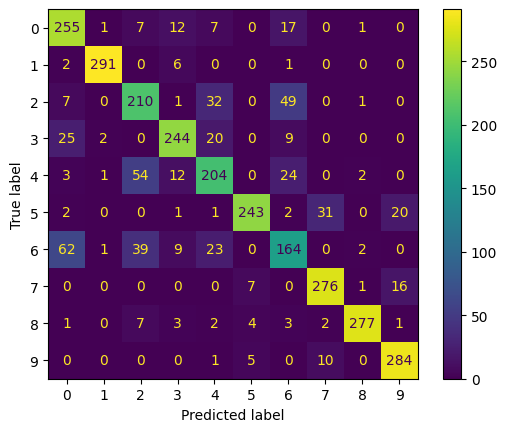

Fold 5:
 Accuracy Score: 0.8183333333333334
 Recall per class: [0.80333333 0.95666667 0.71333333 0.86       0.69666667 0.85
 0.52333333 0.92       0.91       0.95      ]
 Precision per class: [0.72372372 0.98965517 0.71812081 0.82165605 0.67202572 0.95505618
 0.58801498 0.87898089 0.96466431 0.88235294]
 Macro Recall: 0.8183333333333334
 Macro Precision: 0.8194250780833696


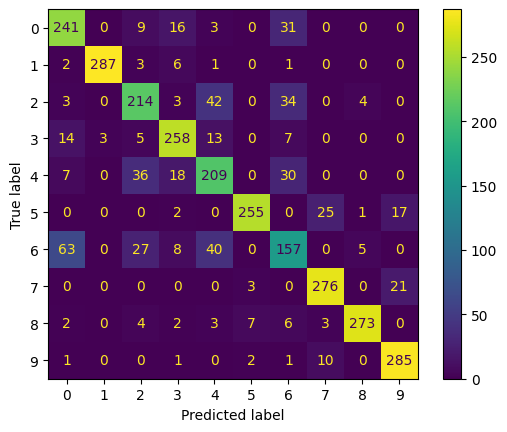

Fold 6:
 Accuracy Score: 0.8216666666666667
 Recall per class: [0.8        0.95       0.72666667 0.85666667 0.69       0.84666667
 0.53333333 0.93333333 0.94       0.94      ]
 Precision per class: [0.78947368 0.97938144 0.69206349 0.84818482 0.68543046 0.93726937
 0.56338028 0.88328076 0.96575342 0.87850467]
 Macro Recall: 0.8216666666666667
 Macro Precision: 0.8222722410667384


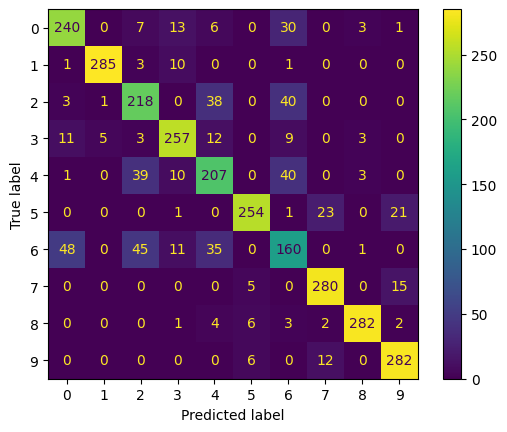

Fold 7:
 Accuracy Score: 0.83
 Recall per class: [0.85666667 0.96666667 0.74       0.84666667 0.67333333 0.88
 0.49666667 0.93666667 0.95       0.95333333]
 Precision per class: [0.74927114 0.98976109 0.68307692 0.82200647 0.69415808 0.97416974
 0.62343096 0.89490446 0.95637584 0.9022082 ]
 Macro Recall: 0.8300000000000001
 Macro Precision: 0.8289362903804773


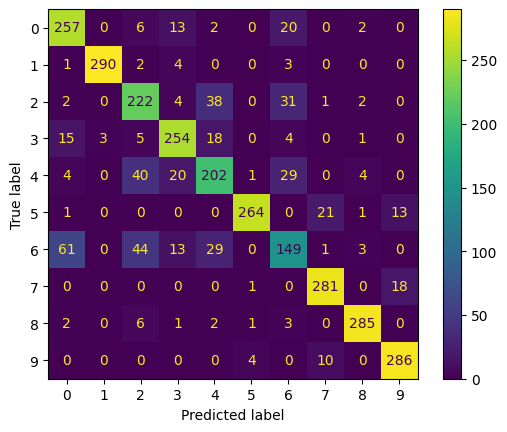

Fold 8:
 Accuracy Score: 0.8176666666666667
 Recall per class: [0.83666667 0.94666667 0.71666667 0.85       0.65666667 0.86666667
 0.5        0.91666667 0.92333333 0.96333333]
 Precision per class: [0.71509972 0.98954704 0.70723684 0.84437086 0.63961039 0.95238095
 0.60240964 0.88996764 0.95517241 0.88379205]
 Macro Recall: 0.8176666666666665
 Macro Precision: 0.8179587537268436


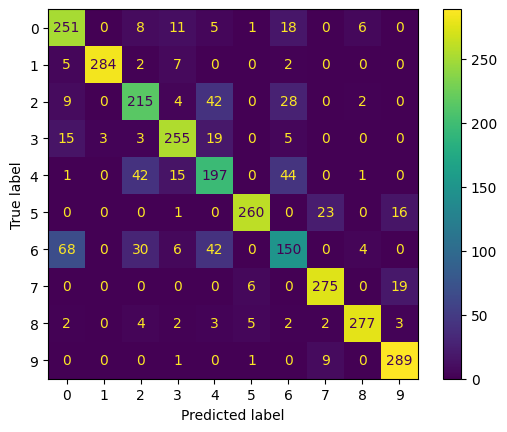

Fold 9:
 Accuracy Score: 0.808
 Recall per class: [0.8        0.94333333 0.73666667 0.81333333 0.69333333 0.84666667
 0.44666667 0.91333333 0.92666667 0.96      ]
 Precision per class: [0.70588235 0.97586207 0.6519174  0.85017422 0.66242038 0.96212121
 0.56302521 0.89542484 0.95205479 0.87272727]
 Macro Recall: 0.808
 Macro Precision: 0.8091609750284341


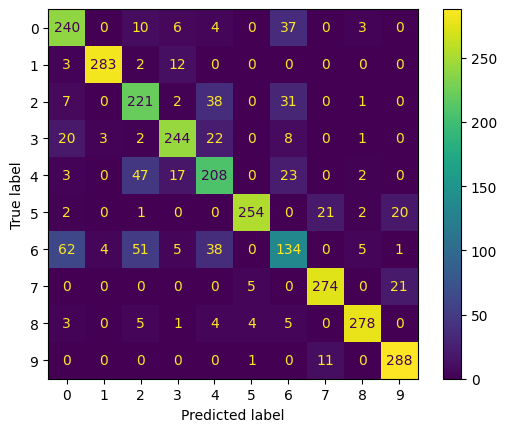

 Fold using k=5 and distance metric = <function manhatan at 0x72e3aa8f9da0>
 Total avg Accuracy: 0.8194333333333332
 Total avg Macro Recall: 0.8194333333333335
 Total avg Macro Precision: 0.8206866470121181
Fold 0:
 Accuracy Score: 0.8103333333333333
 Recall per class: [0.84666667 0.94666667 0.70666667 0.87       0.64       0.84
 0.49       0.9        0.91333333 0.95      ]
 Precision per class: [0.7277937  0.99649123 0.69736842 0.815625   0.62745098 0.93333333
 0.60245902 0.86538462 0.96819788 0.87155963]
 Macro Recall: 0.8103333333333333
 Macro Precision: 0.8105663803787607


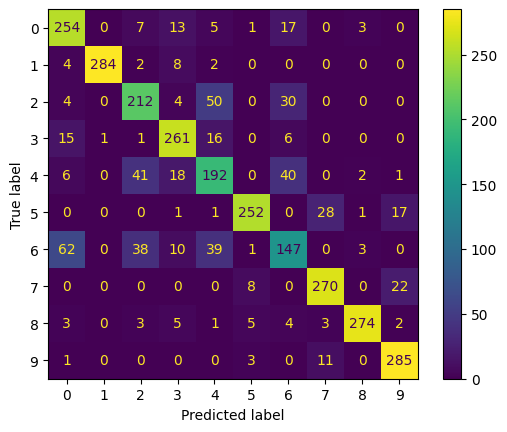

Fold 1:
 Accuracy Score: 0.8116666666666666
 Recall per class: [0.83666667 0.93333333 0.68333333 0.84       0.70666667 0.83
 0.54666667 0.91666667 0.9        0.92333333]
 Precision per class: [0.76060606 0.98245614 0.71678322 0.85714286 0.6443769  0.92222222
 0.55782313 0.83586626 0.98540146 0.89644013]
 Macro Recall: 0.8116666666666668
 Macro Precision: 0.8159118376755012


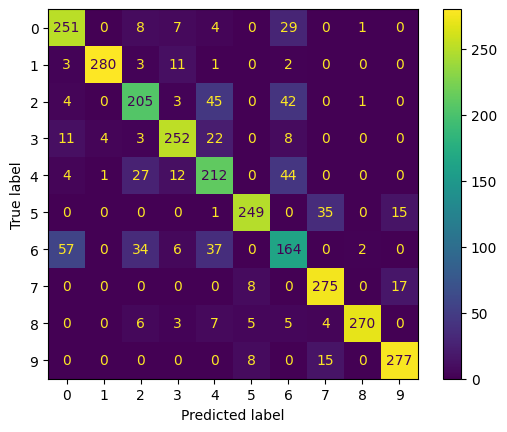

Fold 2:
 Accuracy Score: 0.806
 Recall per class: [0.80666667 0.96333333 0.64333333 0.86       0.68666667 0.82666667
 0.53666667 0.91       0.88333333 0.94333333]
 Precision per class: [0.7202381  0.99655172 0.6819788  0.85430464 0.63190184 0.93233083
 0.57092199 0.84782609 0.96363636 0.88993711]
 Macro Recall: 0.806
 Macro Precision: 0.8089627464609382


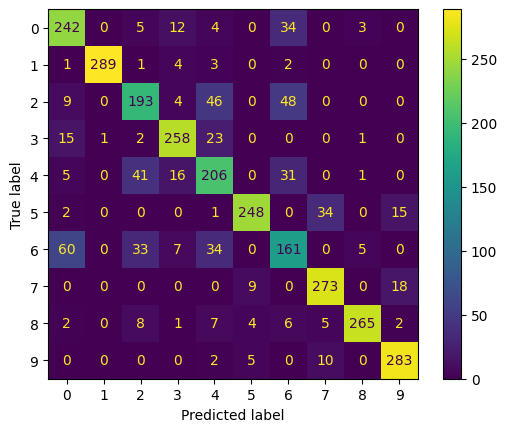

Fold 3:
 Accuracy Score: 0.8106666666666666
 Recall per class: [0.81       0.95333333 0.68666667 0.81666667 0.70333333 0.84666667
 0.52       0.91       0.9        0.96      ]
 Precision per class: [0.74085366 0.98961938 0.69594595 0.78525641 0.64723926 0.94423792
 0.59541985 0.8778135  0.97472924 0.87272727]
 Macro Recall: 0.8106666666666668
 Macro Precision: 0.812384244067679


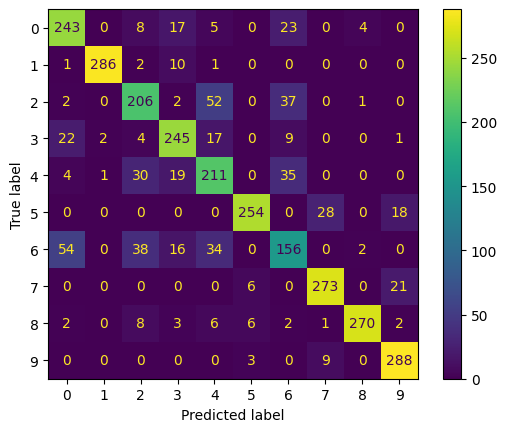

Fold 4:
 Accuracy Score: 0.8096666666666666
 Recall per class: [0.83333333 0.96666667 0.67333333 0.81333333 0.7        0.80666667
 0.53333333 0.91666667 0.92       0.93333333]
 Precision per class: [0.69637883 0.98976109 0.70629371 0.85614035 0.67307692 0.92366412
 0.57553957 0.85139319 0.9787234  0.875     ]
 Macro Recall: 0.8096666666666668
 Macro Precision: 0.8125971186074095


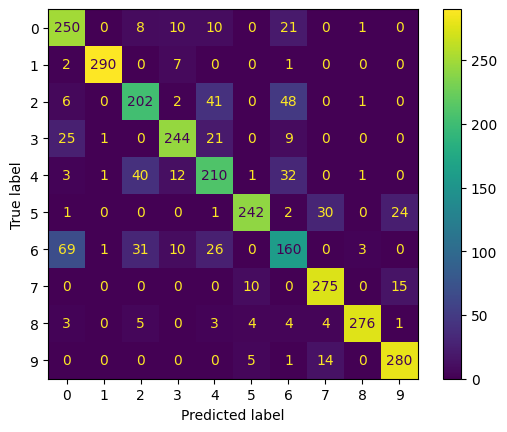

Fold 5:
 Accuracy Score: 0.8123333333333334
 Recall per class: [0.81333333 0.94666667 0.67333333 0.86666667 0.70333333 0.83333333
 0.52       0.92       0.89666667 0.95      ]
 Precision per class: [0.70930233 0.98954704 0.72924188 0.82018927 0.64923077 0.93632959
 0.58426966 0.87898089 0.96071429 0.88509317]
 Macro Recall: 0.8123333333333334
 Macro Precision: 0.8142898880916182


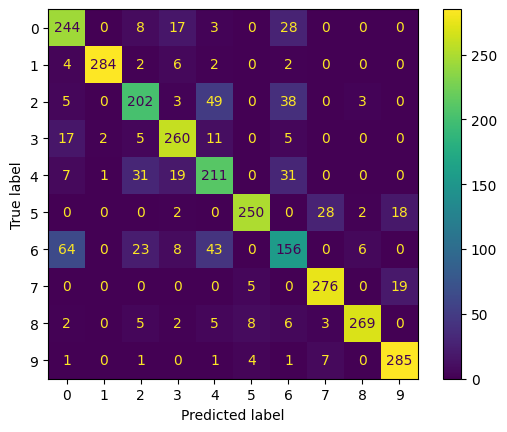

Fold 6:
 Accuracy Score: 0.8046666666666666
 Recall per class: [0.83333333 0.92666667 0.66       0.83666667 0.68333333 0.82333333
 0.52       0.93       0.91666667 0.91666667]
 Precision per class: [0.75757576 0.9858156  0.6875     0.80707395 0.64263323 0.91821561
 0.56521739 0.85846154 0.96830986 0.87025316]
 Macro Recall: 0.8046666666666666
 Macro Precision: 0.8061056111097363


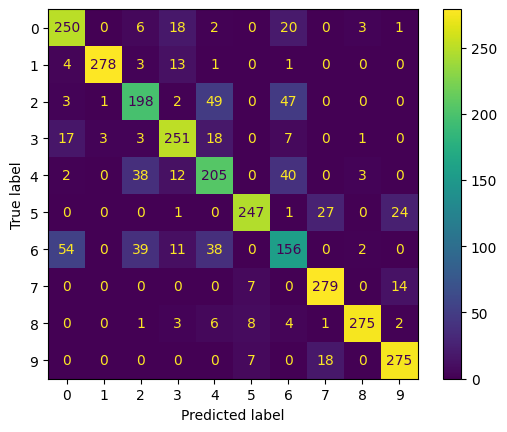

Fold 7:
 Accuracy Score: 0.8146666666666667
 Recall per class: [0.84       0.97333333 0.67666667 0.84       0.66333333 0.87
 0.47666667 0.92       0.94333333 0.94333333]
 Precision per class: [0.72       0.98983051 0.68350168 0.82894737 0.67457627 0.94223827
 0.55859375 0.88178914 0.94333333 0.90415335]
 Macro Recall: 0.8146666666666667
 Macro Precision: 0.812696367407788


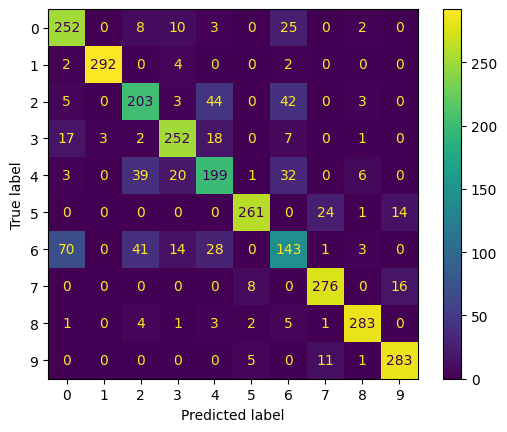

Fold 8:
 Accuracy Score: 0.81
 Recall per class: [0.81       0.93666667 0.67333333 0.86333333 0.68333333 0.83333333
 0.53333333 0.90333333 0.89333333 0.97      ]
 Precision per class: [0.73192771 0.99293286 0.69896194 0.85478548 0.61746988 0.93984962
 0.59925094 0.86858974 0.94699647 0.87387387]
 Macro Recall: 0.8099999999999999
 Macro Precision: 0.8124638513100827


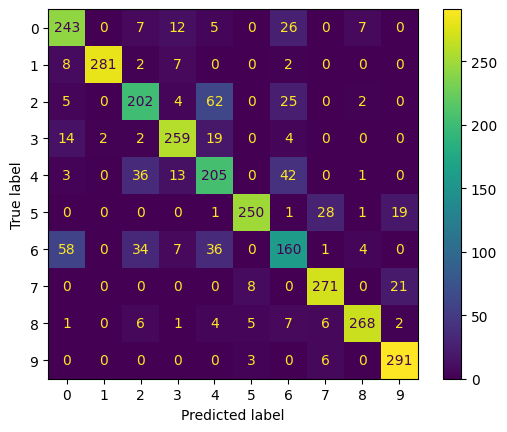

Fold 9:
 Accuracy Score: 0.7946666666666666
 Recall per class: [0.81333333 0.95666667 0.69666667 0.81       0.69333333 0.79
 0.42333333 0.90333333 0.91       0.95      ]
 Precision per class: [0.70724638 0.98965517 0.63914373 0.8556338  0.62275449 0.95180723
 0.54042553 0.84952978 0.96126761 0.85585586]
 Macro Recall: 0.7946666666666667
 Macro Precision: 0.7973319576831581


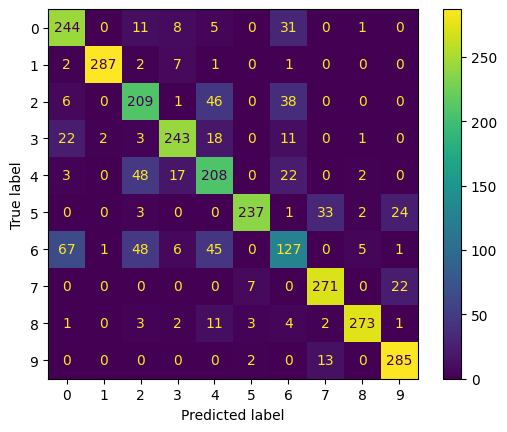

 Fold using k=7 and distance metric = <function euclidean at 0x72e3aa8f9bc0>
 Total avg Accuracy: 0.8084666666666667
 Total avg Macro Recall: 0.8084666666666667
 Total avg Macro Precision: 0.8103310002792672
Fold 0:
 Accuracy Score: 0.829
 Recall per class: [0.86666667 0.96       0.80333333 0.86333333 0.74666667 0.73333333
 0.48333333 0.93       0.94333333 0.96      ]
 Precision per class: [0.74712644 0.99653979 0.73700306 0.86333333 0.6568915  0.969163
 0.73232323 0.86645963 0.93708609 0.83236994]
 Macro Recall: 0.829
 Macro Precision: 0.8338296006366536


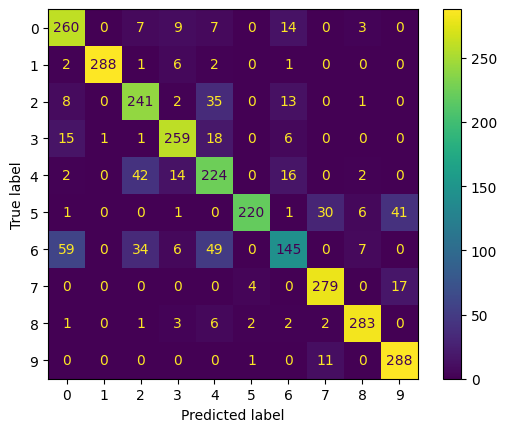

Fold 1:
 Accuracy Score: 0.819
 Recall per class: [0.86       0.95333333 0.73       0.82666667 0.79333333 0.71333333
 0.51       0.92333333 0.93333333 0.94666667]
 Precision per class: [0.74782609 0.9862069  0.77935943 0.85813149 0.63636364 0.98165138
 0.66812227 0.82195846 0.9556314  0.8255814 ]
 Macro Recall: 0.8190000000000002
 Macro Precision: 0.8260832436894823


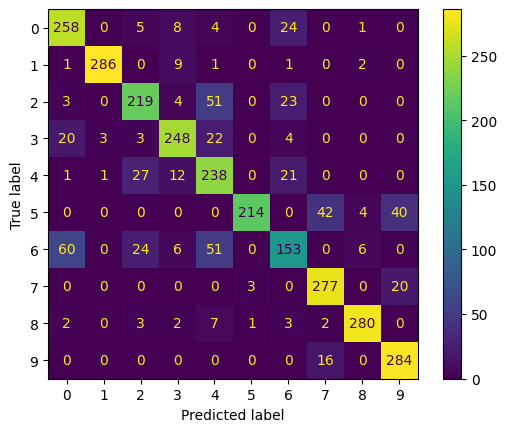

Fold 2:
 Accuracy Score: 0.8173333333333334
 Recall per class: [0.85       0.96666667 0.68666667 0.86       0.76       0.68
 0.58       0.91333333 0.91333333 0.96333333]
 Precision per class: [0.75443787 1.         0.73049645 0.86868687 0.64589235 0.98076923
 0.68774704 0.83536585 0.93515358 0.80726257]
 Macro Recall: 0.8173333333333334
 Macro Precision: 0.824581181713589


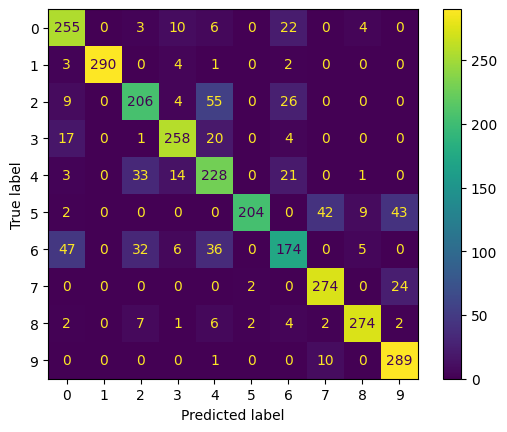

Fold 3:
 Accuracy Score: 0.818
 Recall per class: [0.81666667 0.97333333 0.75       0.83666667 0.79666667 0.70666667
 0.50333333 0.90666667 0.92666667 0.96333333]
 Precision per class: [0.73573574 0.98983051 0.74503311 0.87762238 0.66388889 0.98604651
 0.6371308  0.82926829 0.9754386  0.80501393]
 Macro Recall: 0.818
 Macro Precision: 0.8245008753370786


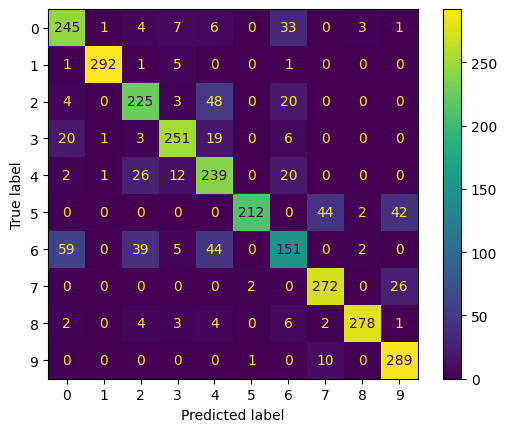

Fold 4:
 Accuracy Score: 0.817
 Recall per class: [0.81666667 0.97666667 0.73       0.86       0.74666667 0.68
 0.52       0.92       0.94666667 0.97333333]
 Precision per class: [0.75153374 0.98986486 0.71103896 0.84039088 0.68085106 0.96682464
 0.66382979 0.85448916 0.94983278 0.79781421]
 Macro Recall: 0.817
 Macro Precision: 0.8206470090984228


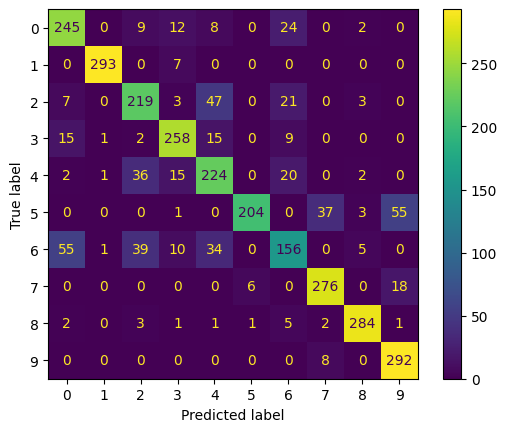

Fold 5:
 Accuracy Score: 0.818
 Recall per class: [0.82333333 0.95666667 0.75666667 0.85333333 0.77333333 0.68333333
 0.50666667 0.92       0.94       0.96666667]
 Precision per class: [0.73293769 0.9862543  0.76174497 0.83660131 0.67836257 0.98086124
 0.65517241 0.86520376 0.94314381 0.79019074]
 Macro Recall: 0.818
 Macro Precision: 0.8230472795696079


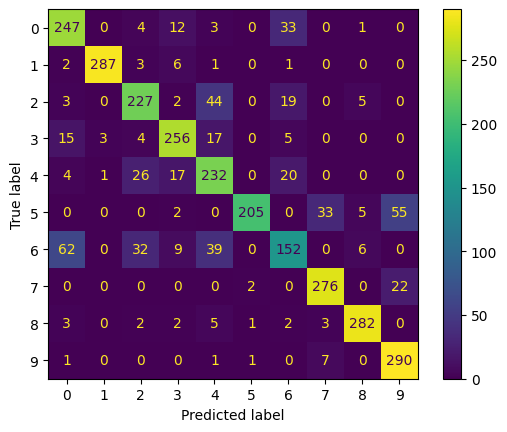

Fold 6:
 Accuracy Score: 0.8163333333333334
 Recall per class: [0.83666667 0.95666667 0.72666667 0.87333333 0.76       0.69
 0.50333333 0.91666667 0.96       0.94      ]
 Precision per class: [0.77230769 0.9862543  0.73648649 0.84789644 0.67455621 0.9627907
 0.63179916 0.87025316 0.93506494 0.7768595 ]
 Macro Recall: 0.8163333333333334
 Macro Precision: 0.8194268592082491


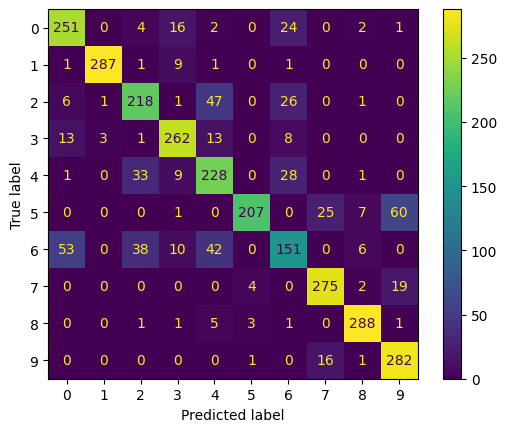

Fold 7:
 Accuracy Score: 0.824
 Recall per class: [0.85666667 0.96333333 0.74333333 0.85666667 0.76666667 0.71666667
 0.48666667 0.92       0.96       0.97      ]
 Precision per class: [0.76261128 0.98634812 0.73114754 0.8538206  0.68047337 0.97727273
 0.66972477 0.86520376 0.9201278  0.81741573]
 Macro Recall: 0.8240000000000001
 Macro Precision: 0.8264145696137252


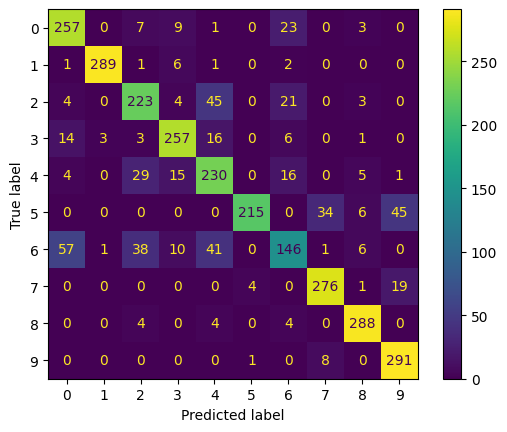

Fold 8:
 Accuracy Score: 0.8063333333333333
 Recall per class: [0.83666667 0.97       0.72333333 0.82666667 0.73       0.7
 0.46666667 0.9        0.94       0.97      ]
 Precision per class: [0.70903955 0.98979592 0.73310811 0.87323944 0.63294798 0.98130841
 0.63926941 0.83850932 0.92459016 0.79508197]
 Macro Recall: 0.8063333333333335
 Macro Precision: 0.811689025352176


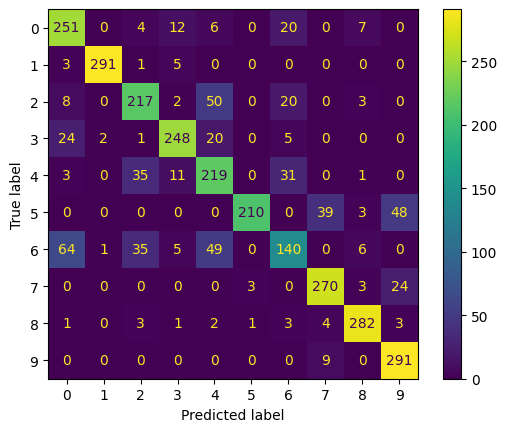

Fold 9:
 Accuracy Score: 0.801
 Recall per class: [0.77       0.96333333 0.74       0.82333333 0.76666667 0.68666667
 0.44666667 0.91666667 0.93333333 0.96333333]
 Precision per class: [0.71962617 0.98634812 0.71612903 0.84300341 0.63186813 0.98564593
 0.59555556 0.84355828 0.93333333 0.80501393]
 Macro Recall: 0.8009999999999999
 Macro Precision: 0.8060081899875107


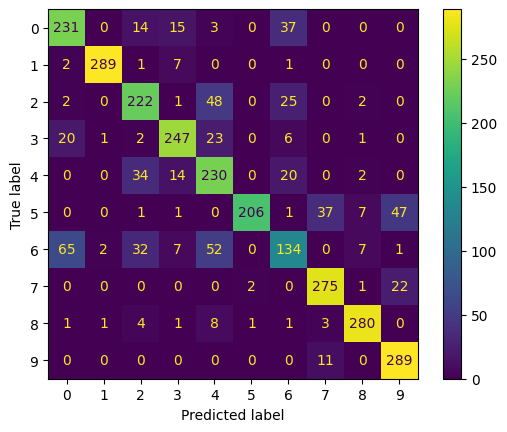

 Fold using k=7 and distance metric = <function cos_distance at 0x72e3aa8f9c60>
 Total avg Accuracy: 0.8166
 Total avg Macro Recall: 0.8166
 Total avg Macro Precision: 0.8216227834206495
Fold 0:
 Accuracy Score: 0.8243333333333334
 Recall per class: [0.85333333 0.95333333 0.73333333 0.86       0.65666667 0.85666667
 0.51       0.92       0.94       0.96      ]
 Precision per class: [0.75516224 0.97945205 0.68535826 0.84039088 0.66107383 0.96254682
 0.6322314  0.88461538 0.9559322  0.88073394]
 Macro Recall: 0.8243333333333333
 Macro Precision: 0.8237497011513744


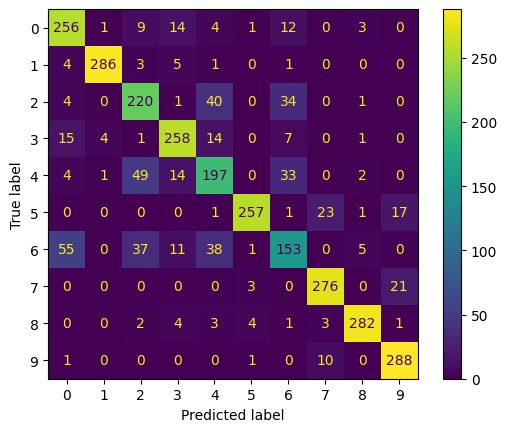

Fold 1:
 Accuracy Score: 0.8256666666666667
 Recall per class: [0.86333333 0.94666667 0.69333333 0.83333333 0.71333333 0.84333333
 0.56333333 0.93       0.92666667 0.94333333]
 Precision per class: [0.74855491 0.98269896 0.73239437 0.88339223 0.69032258 0.95833333
 0.56333333 0.85582822 0.9754386  0.90415335]
 Macro Recall: 0.8256666666666668
 Macro Precision: 0.8294449886872647


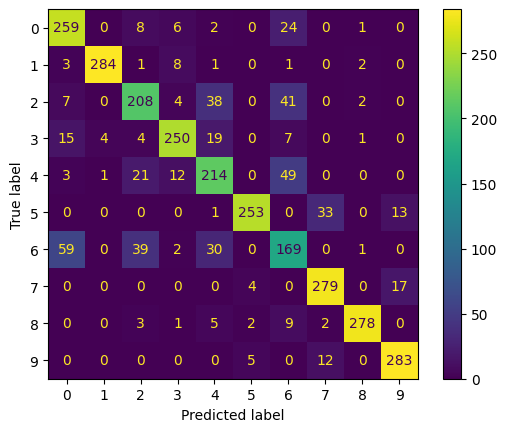

Fold 2:
 Accuracy Score: 0.817
 Recall per class: [0.82666667 0.96333333 0.68       0.86666667 0.68333333 0.82333333
 0.53       0.93       0.91       0.95666667]
 Precision per class: [0.72303207 0.99655172 0.66019417 0.86956522 0.66775244 0.95736434
 0.60456274 0.85582822 0.95789474 0.896875  ]
 Macro Recall: 0.817
 Macro Precision: 0.8189620665682963


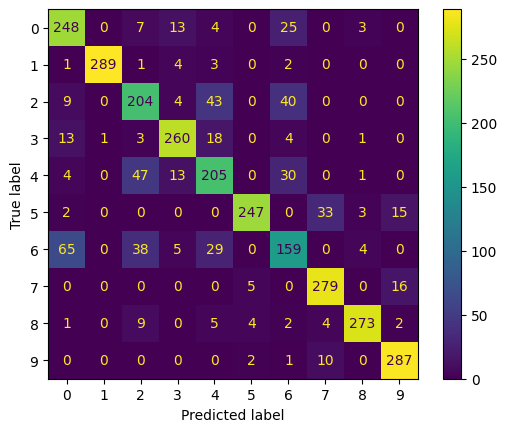

Fold 3:
 Accuracy Score: 0.8243333333333334
 Recall per class: [0.81       0.97333333 0.70333333 0.83333333 0.73666667 0.86333333
 0.52333333 0.92666667 0.91       0.96333333]
 Precision per class: [0.74539877 0.98316498 0.70099668 0.84745763 0.65578635 0.96641791
 0.61328125 0.88253968 0.97153025 0.89197531]
 Macro Recall: 0.8243333333333334
 Macro Precision: 0.8258548811918732


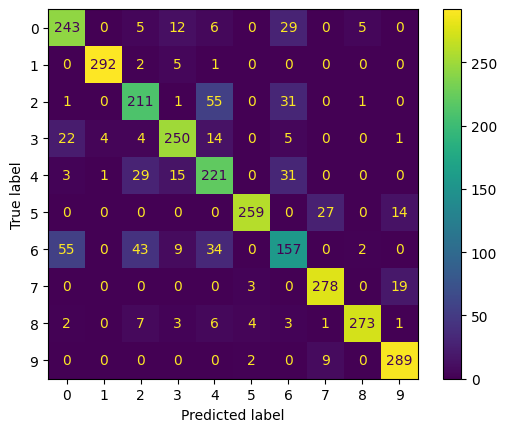

Fold 4:
 Accuracy Score: 0.8173333333333334
 Recall per class: [0.85       0.97       0.69       0.82666667 0.68333333 0.80666667
 0.54666667 0.93       0.92       0.95      ]
 Precision per class: [0.72443182 0.98310811 0.67647059 0.8641115  0.68333333 0.9379845
 0.59636364 0.86377709 0.97526502 0.890625  ]
 Macro Recall: 0.8173333333333332
 Macro Precision: 0.8195470586055187


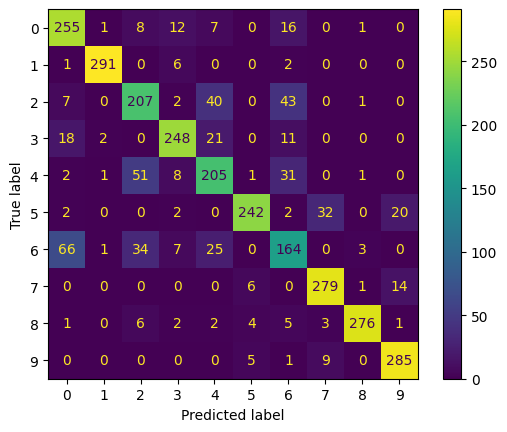

Fold 5:
 Accuracy Score: 0.8206666666666667
 Recall per class: [0.83       0.95333333 0.7        0.85666667 0.71       0.85333333
 0.51666667 0.92       0.91333333 0.95333333]
 Precision per class: [0.73020528 0.98961938 0.7        0.82371795 0.7029703  0.94814815
 0.58052434 0.88745981 0.96819788 0.88271605]
 Macro Recall: 0.8206666666666667
 Macro Precision: 0.8213559130535423


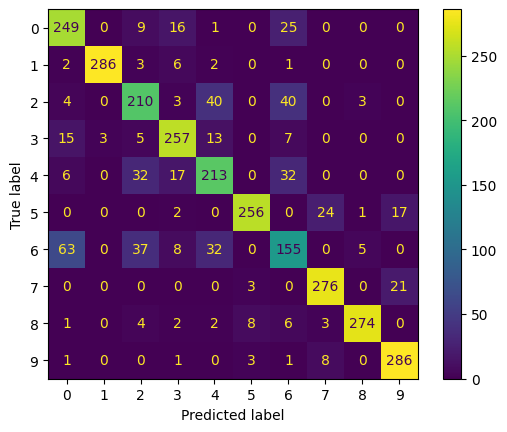

Fold 6:
 Accuracy Score: 0.8196666666666667
 Recall per class: [0.82       0.95       0.72666667 0.84333333 0.69333333 0.84
 0.51       0.93666667 0.94666667 0.93      ]
 Precision per class: [0.77358491 0.9760274  0.69871795 0.84899329 0.67532468 0.94029851
 0.56666667 0.87538941 0.95945946 0.88012618]
 Macro Recall: 0.8196666666666668
 Macro Precision: 0.8194588440207682


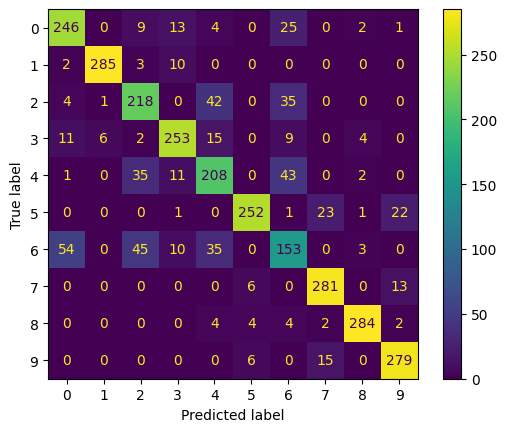

Fold 7:
 Accuracy Score: 0.8293333333333334
 Recall per class: [0.88333333 0.96333333 0.72666667 0.81666667 0.69       0.88333333
 0.47666667 0.94       0.95       0.96333333]
 Precision per class: [0.7320442  0.9829932  0.70779221 0.84775087 0.65923567 0.97069597
 0.61904762 0.90675241 0.95317726 0.90595611]
 Macro Recall: 0.8293333333333333
 Macro Precision: 0.828544550950476


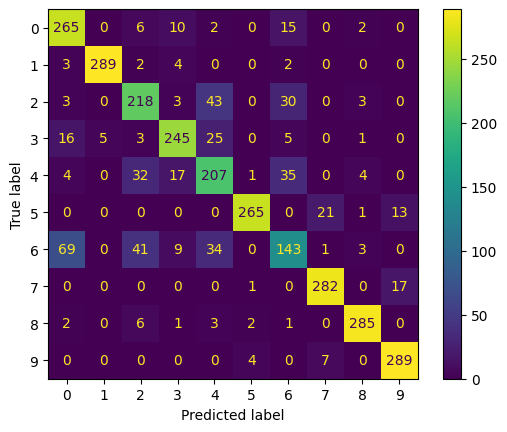

Fold 8:
 Accuracy Score: 0.8176666666666667
 Recall per class: [0.84       0.93333333 0.72       0.86       0.66333333 0.85666667
 0.49333333 0.92333333 0.92       0.96666667]
 Precision per class: [0.72413793 0.98591549 0.70819672 0.82165605 0.65460526 0.95185185
 0.60162602 0.88498403 0.94845361 0.89230769]
 Macro Recall: 0.8176666666666665
 Macro Precision: 0.8173734653643248


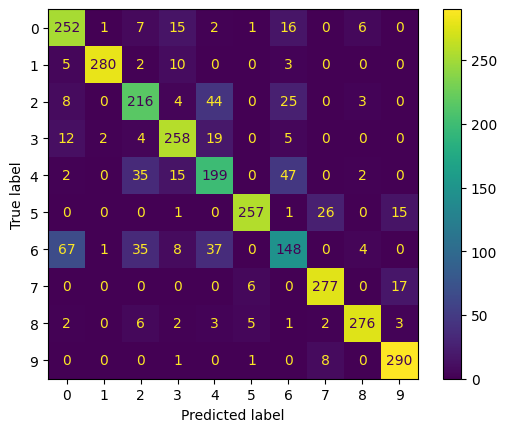

Fold 9:
 Accuracy Score: 0.8076666666666666
 Recall per class: [0.81       0.94666667 0.71333333 0.82666667 0.70333333 0.82666667
 0.44666667 0.91666667 0.92666667 0.96      ]
 Precision per class: [0.70845481 0.98269896 0.66666667 0.86713287 0.64525994 0.95752896
 0.54918033 0.88709677 0.96193772 0.86746988]
 Macro Recall: 0.8076666666666668
 Macro Precision: 0.8093426900443204


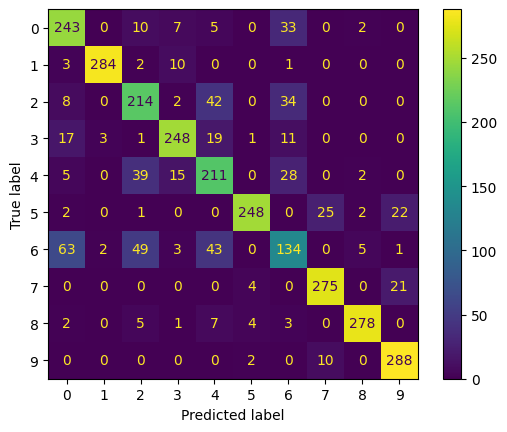

 Fold using k=7 and distance metric = <function manhatan at 0x72e3aa8f9da0>
 Total avg Accuracy: 0.8203666666666667
 Total avg Macro Recall: 0.8203666666666667
 Total avg Macro Precision: 0.8213634159637759
Fold 0:
 Accuracy Score: 0.8116666666666666
 Recall per class: [0.85       0.94666667 0.71666667 0.87333333 0.64       0.83
 0.48666667 0.9        0.92       0.95333333]
 Precision per class: [0.73487032 0.99649123 0.68037975 0.82389937 0.63576159 0.93258427
 0.61344538 0.86261981 0.96503497 0.87195122]
 Macro Recall: 0.8116666666666668
 Macro Precision: 0.8117037893049707


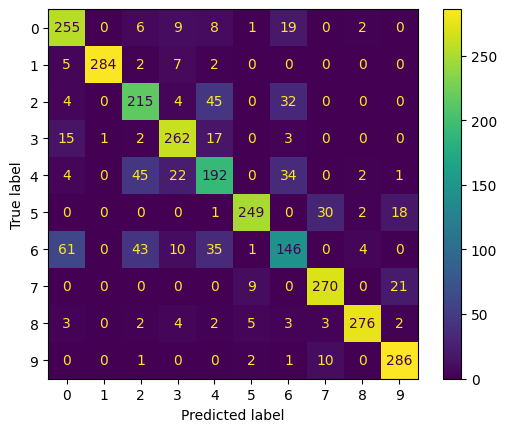

Fold 1:
 Accuracy Score: 0.811
 Recall per class: [0.85333333 0.93666667 0.67       0.83666667 0.7        0.82666667
 0.55       0.90666667 0.90666667 0.92333333]
 Precision per class: [0.75073314 0.98251748 0.73357664 0.84797297 0.63636364 0.92193309
 0.57093426 0.83435583 0.98194946 0.88782051]
 Macro Recall: 0.8109999999999999
 Macro Precision: 0.8148157013102117


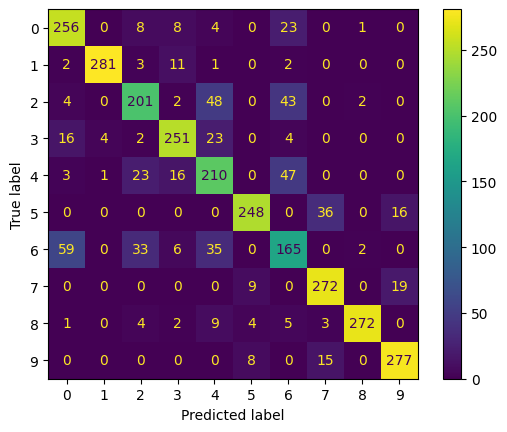

Fold 2:
 Accuracy Score: 0.808
 Recall per class: [0.83       0.96       0.64333333 0.86333333 0.69       0.83333333
 0.52333333 0.91       0.88333333 0.94333333]
 Precision per class: [0.72173913 0.99653979 0.6942446  0.86333333 0.63692308 0.92250923
 0.5647482  0.86119874 0.9566787  0.884375  ]
 Macro Recall: 0.808
 Macro Precision: 0.810228980245774


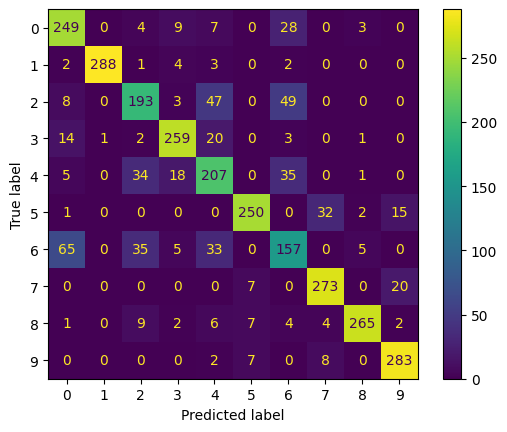

Fold 3:
 Accuracy Score: 0.81
 Recall per class: [0.82333333 0.95       0.69666667 0.80666667 0.71333333 0.82666667
 0.51666667 0.90666667 0.9        0.96      ]
 Precision per class: [0.73511905 0.98275862 0.69666667 0.80936455 0.65443425 0.94296578
 0.58935361 0.86075949 0.98181818 0.87009063]
 Macro Recall: 0.8100000000000002
 Macro Precision: 0.8123330835800016


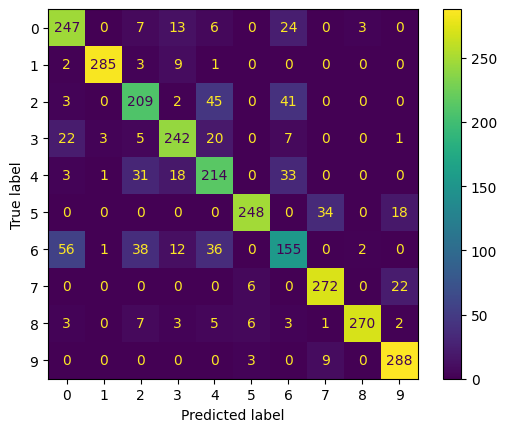

Fold 4:
 Accuracy Score: 0.8063333333333333
 Recall per class: [0.83333333 0.96333333 0.68333333 0.81666667 0.68666667 0.79666667
 0.53333333 0.91       0.91666667 0.92333333]
 Precision per class: [0.72254335 0.98972603 0.6996587  0.8390411  0.66451613 0.90188679
 0.57142857 0.85579937 0.9751773  0.86292835]
 Macro Recall: 0.8063333333333335
 Macro Precision: 0.8082705698789109


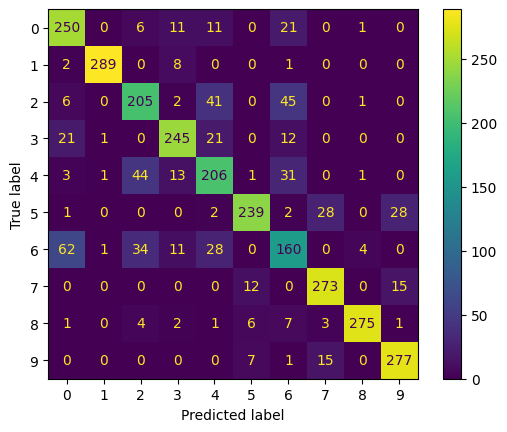

Fold 5:
 Accuracy Score: 0.8163333333333334
 Recall per class: [0.84       0.94666667 0.67666667 0.87333333 0.71666667 0.81333333
 0.53666667 0.91666667 0.89333333 0.95      ]
 Precision per class: [0.72413793 0.99300699 0.73550725 0.82649842 0.66153846 0.93129771
 0.60526316 0.86206897 0.96750903 0.87962963]
 Macro Recall: 0.8163333333333334
 Macro Precision: 0.8186457542905712


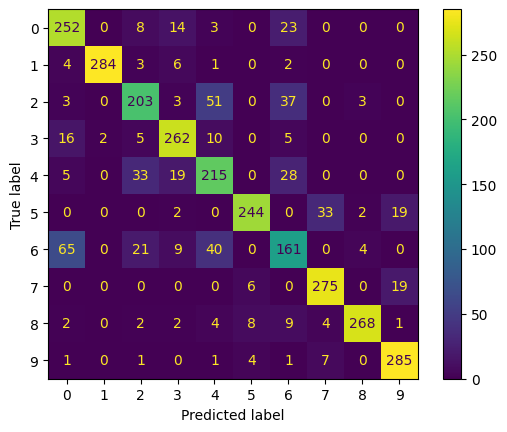

Fold 6:
 Accuracy Score: 0.8013333333333333
 Recall per class: [0.84       0.92333333 0.65666667 0.85333333 0.69       0.81
 0.49666667 0.93       0.89666667 0.91666667]
 Precision per class: [0.74777448 0.99283154 0.70863309 0.81528662 0.62917933 0.91353383
 0.54379562 0.8429003  0.9676259  0.87579618]
 Macro Recall: 0.8013333333333333
 Macro Precision: 0.8037356905730547


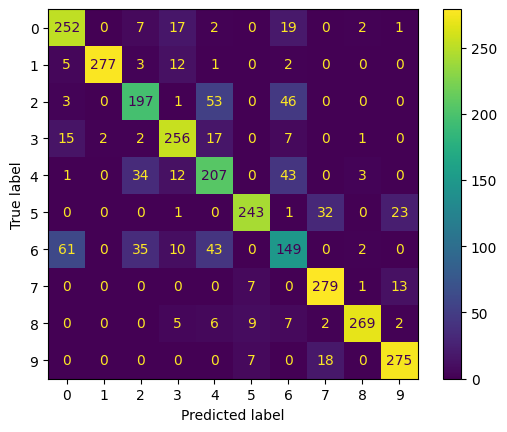

Fold 7:
 Accuracy Score: 0.8146666666666667
 Recall per class: [0.85       0.95       0.67       0.83333333 0.66333333 0.86333333
 0.50666667 0.92       0.94       0.95      ]
 Precision per class: [0.73487032 0.98615917 0.6722408  0.82236842 0.66333333 0.94181818
 0.58914729 0.88745981 0.94       0.89905363]
 Macro Recall: 0.8146666666666664
 Macro Precision: 0.81364509470887


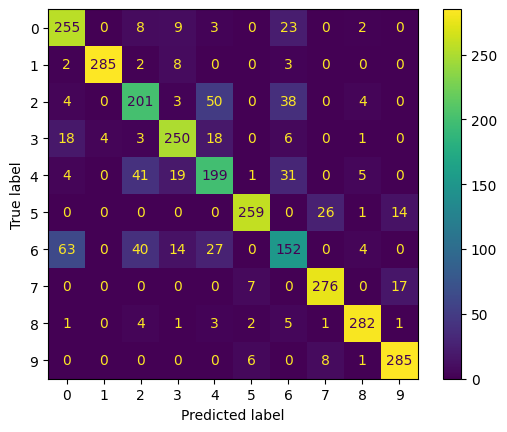

Fold 8:
 Accuracy Score: 0.8103333333333333
 Recall per class: [0.83666667 0.94333333 0.68       0.85666667 0.67666667 0.82
 0.52666667 0.90666667 0.89       0.96666667]
 Precision per class: [0.76060606 0.99298246 0.70103093 0.83986928 0.61329305 0.93536122
 0.60769231 0.85804416 0.94680851 0.86567164]
 Macro Recall: 0.8103333333333331
 Macro Precision: 0.8121359617876275


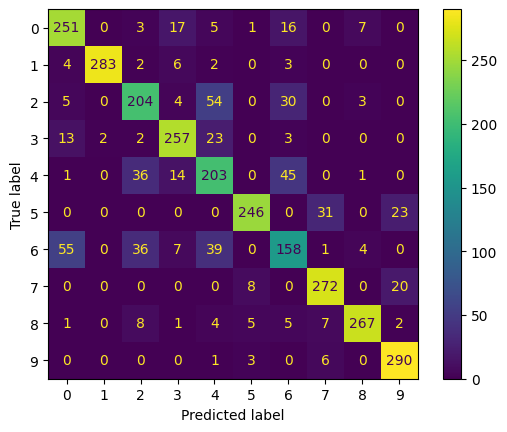

Fold 9:
 Accuracy Score: 0.7973333333333333
 Recall per class: [0.81       0.95333333 0.7        0.81333333 0.69333333 0.79666667
 0.44       0.90666667 0.90666667 0.95333333]
 Precision per class: [0.72321429 0.99305556 0.65420561 0.85915493 0.62089552 0.95219124
 0.53225806 0.85534591 0.95774648 0.85373134]
 Macro Recall: 0.7973333333333332
 Macro Precision: 0.8001798934394397


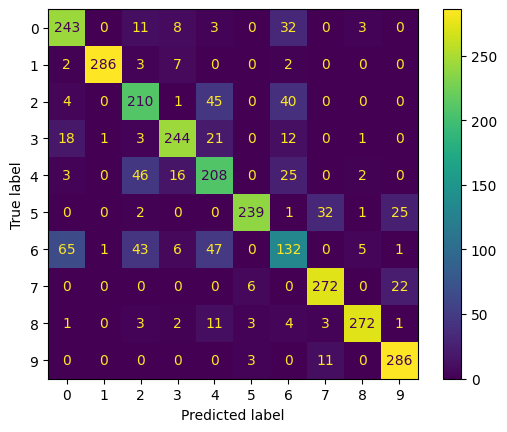

 Fold using k=9 and distance metric = <function euclidean at 0x72e3aa8f9bc0>
 Total avg Accuracy: 0.8087
 Total avg Macro Recall: 0.8087
 Total avg Macro Precision: 0.8105694519119432
Fold 0:
 Accuracy Score: 0.821
 Recall per class: [0.86333333 0.96333333 0.77333333 0.85666667 0.74333333 0.70666667
 0.48       0.92       0.94666667 0.95666667]
 Precision per class: [0.74425287 0.99655172 0.74121406 0.86241611 0.63714286 0.96803653
 0.71287129 0.85448916 0.93421053 0.81303116]
 Macro Recall: 0.821
 Macro Precision: 0.8264216288419186


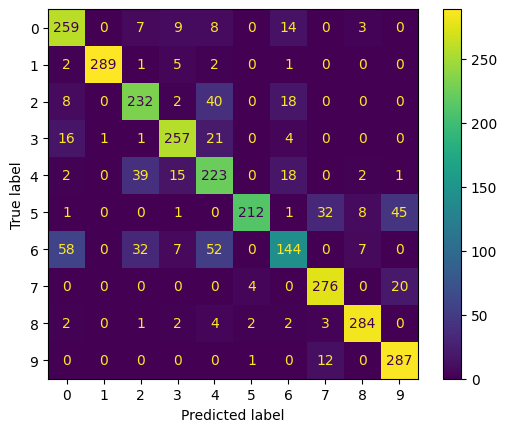

Fold 1:
 Accuracy Score: 0.8173333333333334
 Recall per class: [0.86       0.95333333 0.71333333 0.84       0.79333333 0.69333333
 0.5        0.93333333 0.94       0.94666667]
 Precision per class: [0.74137931 0.98961938 0.76702509 0.86006826 0.63806971 0.98113208
 0.67264574 0.82352941 0.94630872 0.82318841]
 Macro Recall: 0.8173333333333334
 Macro Precision: 0.8242966099368726


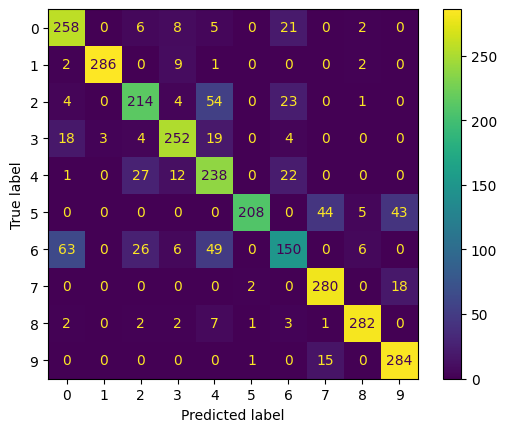

Fold 2:
 Accuracy Score: 0.8186666666666667
 Recall per class: [0.85333333 0.96       0.68333333 0.86666667 0.77333333 0.68
 0.58       0.9        0.91666667 0.97333333]
 Precision per class: [0.75516224 1.         0.74275362 0.87542088 0.65352113 0.97142857
 0.68235294 0.8490566  0.92592593 0.8       ]
 Macro Recall: 0.8186666666666668
 Macro Precision: 0.8255621909562304


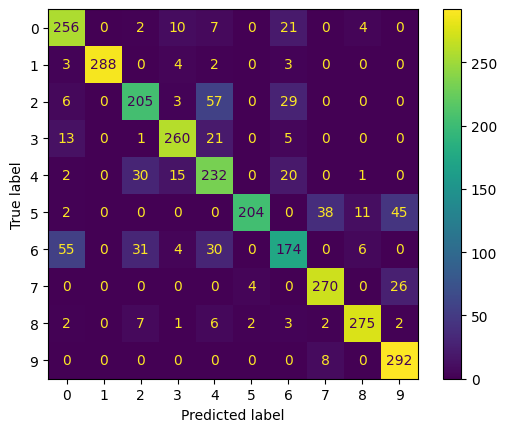

Fold 3:
 Accuracy Score: 0.8156666666666667
 Recall per class: [0.81333333 0.97       0.75       0.84333333 0.78       0.69666667
 0.50666667 0.90666667 0.92666667 0.96333333]
 Precision per class: [0.73716012 0.98979592 0.75       0.86054422 0.65730337 0.98584906
 0.63598326 0.83180428 0.9754386  0.79834254]
 Macro Recall: 0.8156666666666667
 Macro Precision: 0.8222221367162218


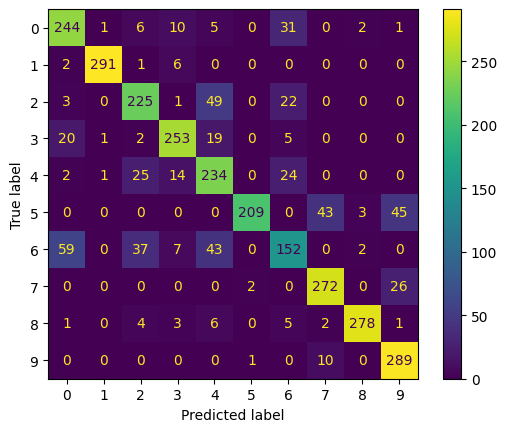

Fold 4:
 Accuracy Score: 0.817
 Recall per class: [0.84       0.97333333 0.71       0.84666667 0.77333333 0.67333333
 0.51333333 0.91666667 0.95333333 0.97      ]
 Precision per class: [0.74336283 0.98648649 0.7220339  0.85234899 0.68035191 0.96650718
 0.66666667 0.85139319 0.95016611 0.79291553]
 Macro Recall: 0.817
 Macro Precision: 0.8212232792943535


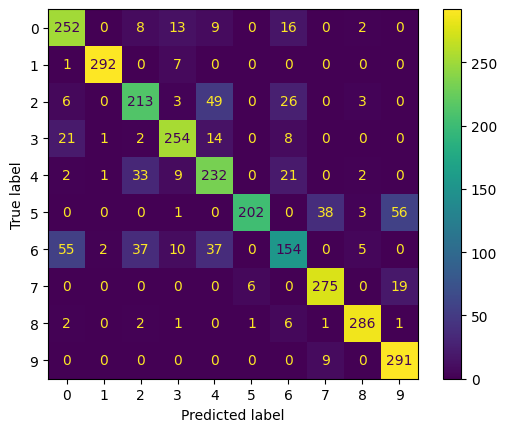

Fold 5:
 Accuracy Score: 0.8136666666666666
 Recall per class: [0.83666667 0.95666667 0.74       0.86       0.76666667 0.66666667
 0.49       0.91333333 0.94333333 0.96333333]
 Precision per class: [0.73607038 0.98287671 0.76816609 0.84313725 0.65714286 0.97560976
 0.64757709 0.86163522 0.94333333 0.77688172]
 Macro Recall: 0.8136666666666666
 Macro Precision: 0.8192430418068456


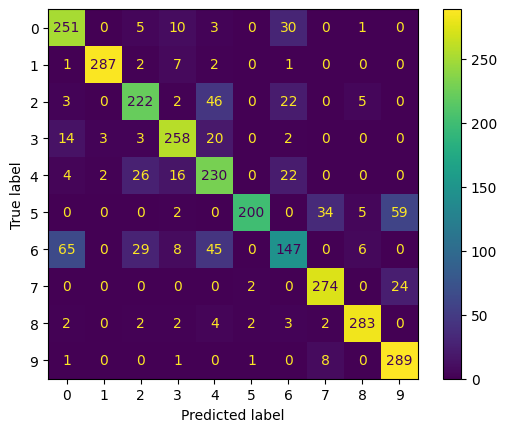

Fold 6:
 Accuracy Score: 0.8106666666666666
 Recall per class: [0.81       0.95       0.72333333 0.87666667 0.75666667 0.67333333
 0.51       0.91666667 0.95333333 0.93666667]
 Precision per class: [0.77142857 0.98615917 0.72093023 0.8538961  0.66764706 0.97584541
 0.61693548 0.86206897 0.93159609 0.76775956]
 Macro Recall: 0.8106666666666668
 Macro Precision: 0.8154266650319487


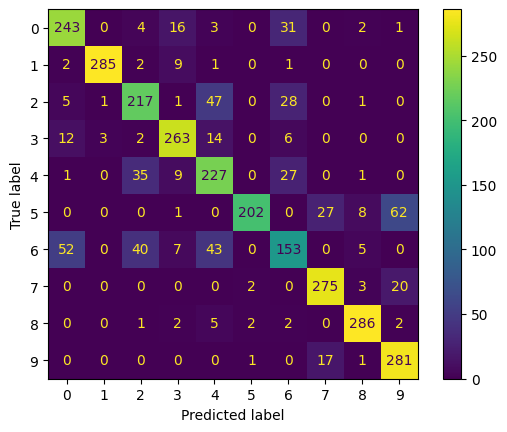

Fold 7:
 Accuracy Score: 0.8216666666666667
 Recall per class: [0.85       0.96333333 0.73333333 0.85       0.77666667 0.70333333
 0.48666667 0.92666667 0.95666667 0.97      ]
 Precision per class: [0.74127907 0.98972603 0.74576271 0.85       0.6734104  0.98598131
 0.68544601 0.85802469 0.91111111 0.81512605]
 Macro Recall: 0.8216666666666667
 Macro Precision: 0.8255867384343578


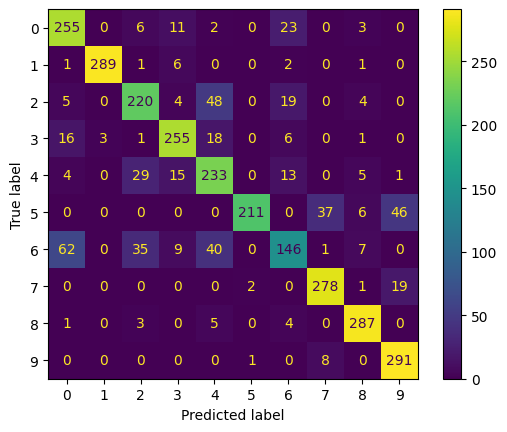

Fold 8:
 Accuracy Score: 0.8073333333333333
 Recall per class: [0.83666667 0.97       0.72       0.83333333 0.74       0.69333333
 0.46666667 0.9        0.94       0.97333333]
 Precision per class: [0.72543353 0.98644068 0.73469388 0.86805556 0.62184874 0.98578199
 0.64516129 0.84375    0.93069307 0.79132791]
 Macro Recall: 0.8073333333333332
 Macro Precision: 0.8133186640010008


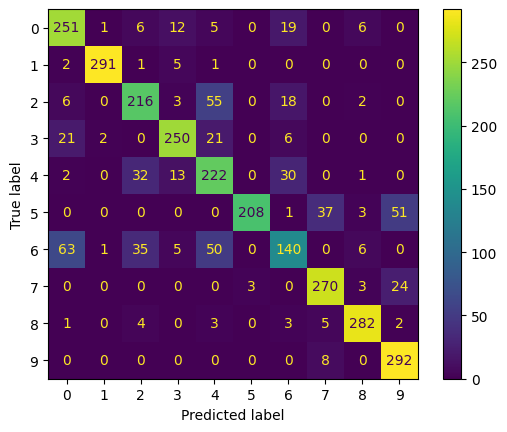

Fold 9:
 Accuracy Score: 0.799
 Recall per class: [0.79333333 0.96333333 0.71       0.82       0.77333333 0.67333333
 0.44333333 0.91       0.93666667 0.96666667]
 Precision per class: [0.72121212 0.98634812 0.72945205 0.84827586 0.61866667 0.98058252
 0.59641256 0.84       0.92739274 0.79889807]
 Macro Recall: 0.799
 Macro Precision: 0.8047240718834097


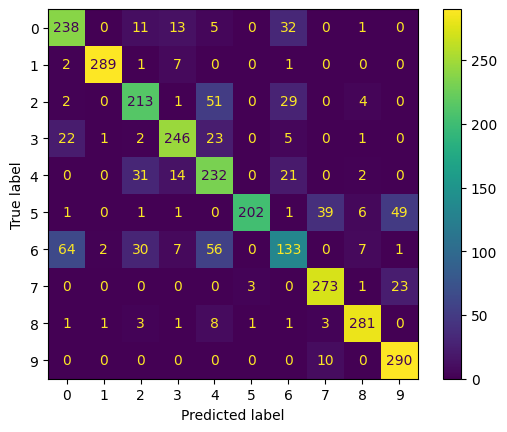

 Fold using k=9 and distance metric = <function cos_distance at 0x72e3aa8f9c60>
 Total avg Accuracy: 0.8141999999999999
 Total avg Macro Recall: 0.8141999999999999
 Total avg Macro Precision: 0.819802502690316
Fold 0:
 Accuracy Score: 0.8226666666666667
 Recall per class: [0.85333333 0.95333333 0.73       0.86333333 0.66       0.84333333
 0.51       0.92       0.93666667 0.95666667]
 Precision per class: [0.74202899 0.97610922 0.67592593 0.84090909 0.68275862 0.96197719
 0.6322314  0.87619048 0.95578231 0.8803681 ]
 Macro Recall: 0.8226666666666667
 Macro Precision: 0.8224281316594604


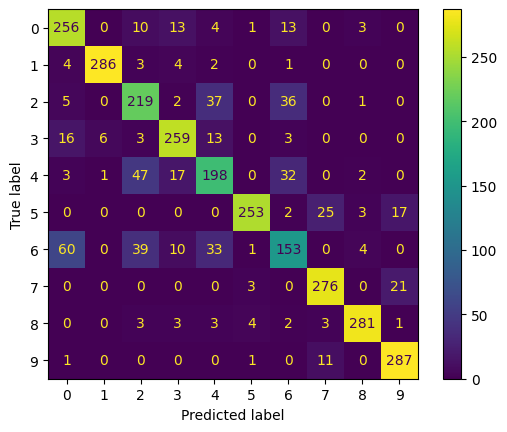

Fold 1:
 Accuracy Score: 0.823
 Recall per class: [0.85       0.94666667 0.69       0.84333333 0.71666667 0.84
 0.54666667 0.92333333 0.92333333 0.95      ]
 Precision per class: [0.73913043 0.98269896 0.73144876 0.86643836 0.68910256 0.95454545
 0.56551724 0.85758514 0.97192982 0.89905363]
 Macro Recall: 0.8229999999999998
 Macro Precision: 0.8257450367803463


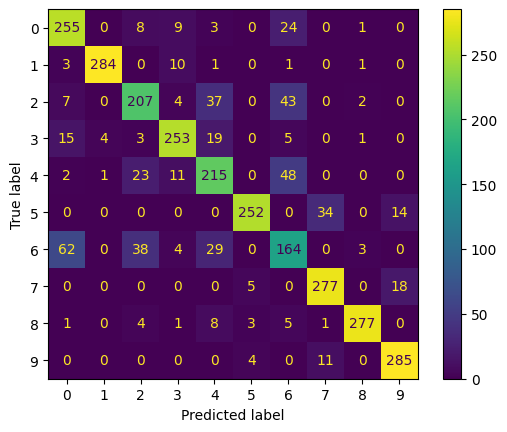

Fold 2:
 Accuracy Score: 0.8156666666666667
 Recall per class: [0.83       0.96       0.68       0.87       0.67666667 0.83
 0.52       0.93333333 0.9        0.95666667]
 Precision per class: [0.71965318 1.         0.65806452 0.87       0.65909091 0.96138996
 0.59770115 0.85889571 0.95744681 0.896875  ]
 Macro Recall: 0.8156666666666667
 Macro Precision: 0.8179117229258053


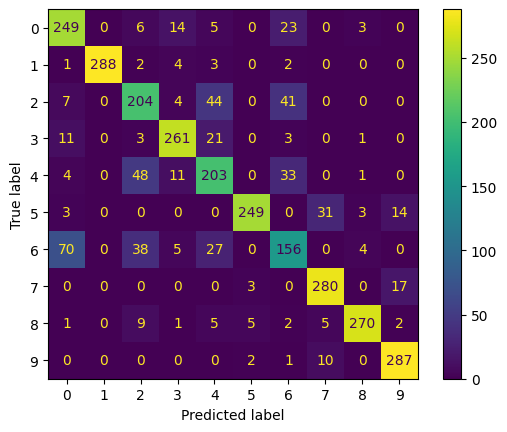

Fold 3:
 Accuracy Score: 0.821
 Recall per class: [0.82666667 0.97333333 0.69666667 0.83666667 0.72       0.84666667
 0.51666667 0.92       0.91       0.96333333]
 Precision per class: [0.72941176 0.98316498 0.6852459  0.85958904 0.675      0.95849057
 0.60077519 0.88178914 0.96808511 0.88109756]
 Macro Recall: 0.821
 Macro Precision: 0.8222649255181066


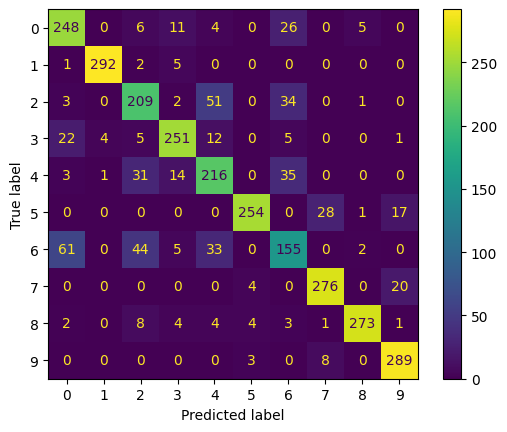

Fold 4:
 Accuracy Score: 0.8166666666666667
 Recall per class: [0.83       0.96666667 0.7        0.82666667 0.69333333 0.8
 0.55       0.92333333 0.92333333 0.95333333]
 Precision per class: [0.72173913 0.98305085 0.67524116 0.85813149 0.69798658 0.93385214
 0.6        0.85758514 0.97535211 0.88544892]
 Macro Recall: 0.8166666666666667
 Macro Precision: 0.8188387509000593


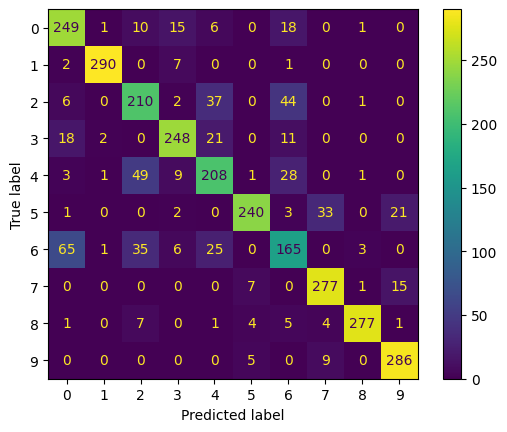

Fold 5:
 Accuracy Score: 0.8256666666666667
 Recall per class: [0.83       0.95       0.70333333 0.88       0.72       0.85
 0.52333333 0.92666667 0.92333333 0.95      ]
 Precision per class: [0.73235294 0.99303136 0.72260274 0.82242991 0.70819672 0.95864662
 0.59022556 0.88253968 0.96515679 0.88785047]
 Macro Recall: 0.8256666666666665
 Macro Precision: 0.8263032792346664


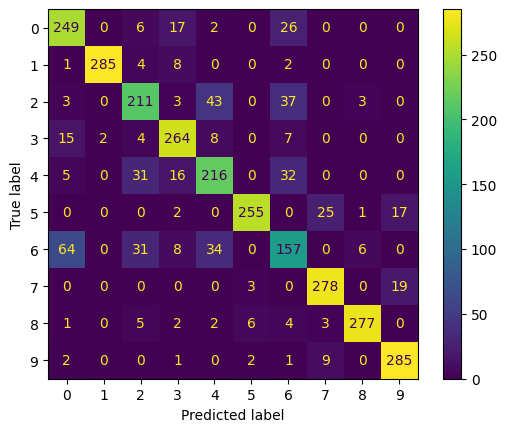

Fold 6:
 Accuracy Score: 0.8196666666666667
 Recall per class: [0.83666667 0.94666667 0.70333333 0.84666667 0.71       0.84333333
 0.50666667 0.93       0.93666667 0.93666667]
 Precision per class: [0.77469136 0.98269896 0.70805369 0.83278689 0.6635514  0.94756554
 0.57794677 0.87735849 0.95578231 0.87538941]
 Macro Recall: 0.8196666666666668
 Macro Precision: 0.8195824821075529


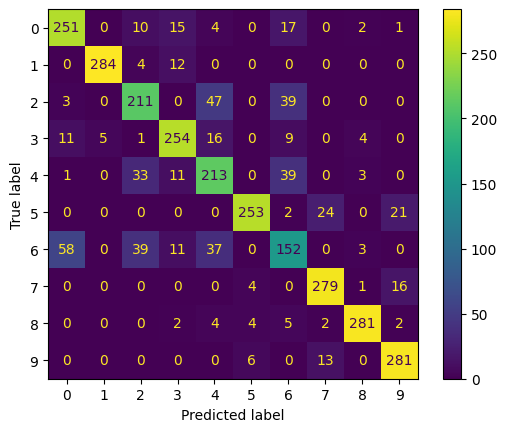

Fold 7:
 Accuracy Score: 0.8343333333333334
 Recall per class: [0.87       0.96       0.72666667 0.82666667 0.69333333 0.89333333
 0.51666667 0.93666667 0.95333333 0.96666667]
 Precision per class: [0.74147727 0.98293515 0.72425249 0.84067797 0.67973856 0.96750903
 0.62       0.90938511 0.95333333 0.9148265 ]
 Macro Recall: 0.8343333333333334
 Macro Precision: 0.8334135416493853


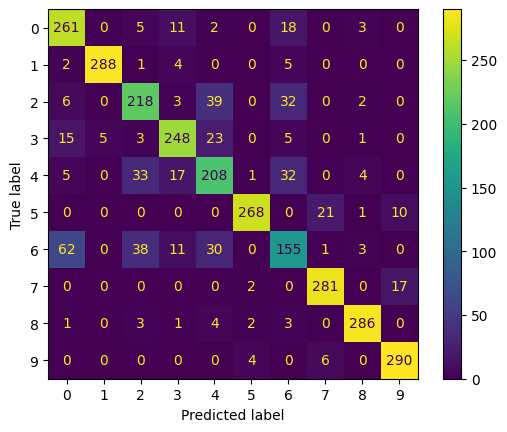

Fold 8:
 Accuracy Score: 0.8173333333333334
 Recall per class: [0.83333333 0.93666667 0.72       0.86       0.66       0.85333333
 0.50666667 0.92       0.91333333 0.97      ]
 Precision per class: [0.73313783 0.98943662 0.70588235 0.82428115 0.65346535 0.96240602
 0.59375    0.88178914 0.94482759 0.88719512]
 Macro Recall: 0.8173333333333334
 Macro Precision: 0.817617115984181


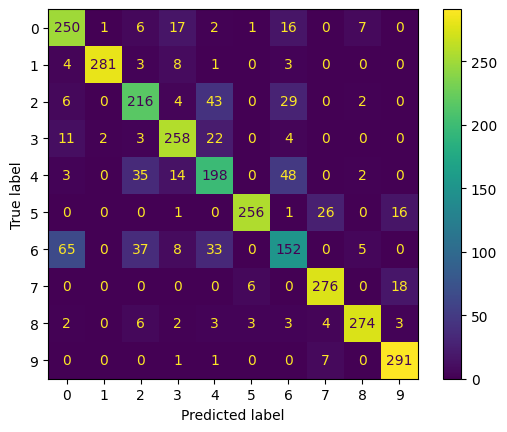

Fold 9:
 Accuracy Score: 0.8026666666666666
 Recall per class: [0.81666667 0.94333333 0.70333333 0.82666667 0.68       0.81
 0.44       0.91666667 0.92333333 0.96666667]
 Precision per class: [0.7122093  0.97923875 0.64923077 0.84641638 0.65594855 0.95669291
 0.53012048 0.88141026 0.96180556 0.86567164]
 Macro Recall: 0.8026666666666668
 Macro Precision: 0.8038744610259225


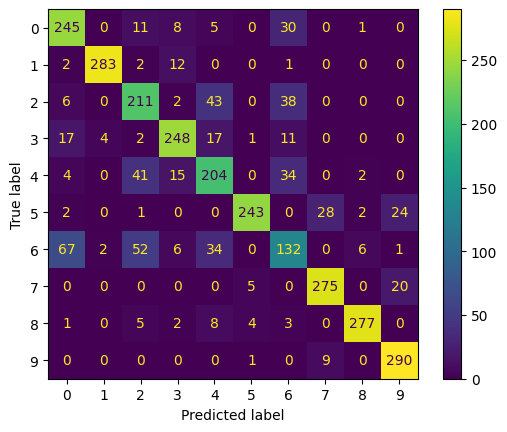

 Fold using k=9 and distance metric = <function manhatan at 0x72e3aa8f9da0>
 Total avg Accuracy: 0.8198666666666666
 Total avg Macro Recall: 0.8198666666666666
 Total avg Macro Precision: 0.8207979447785485
Fold 0:
 Accuracy Score: 0.8163333333333334
 Recall per class: [0.85       0.94666667 0.72       0.87       0.66333333 0.83333333
 0.50666667 0.90333333 0.91333333 0.95666667]
 Precision per class: [0.75221239 0.99649123 0.69230769 0.81818182 0.66112957 0.92936803
 0.61044177 0.86031746 0.96140351 0.8803681 ]
 Macro Recall: 0.8163333333333332
 Macro Precision: 0.8162221560103479


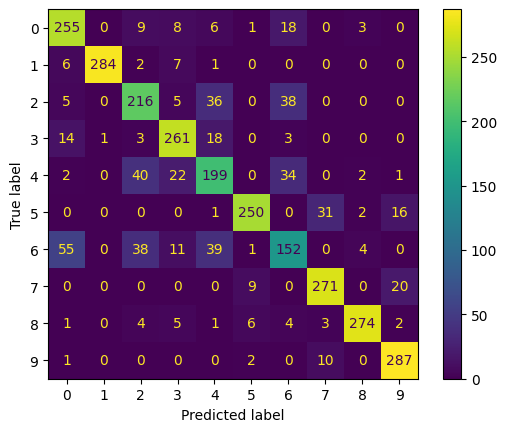

Fold 1:
 Accuracy Score: 0.8113333333333334
 Recall per class: [0.85333333 0.93666667 0.64666667 0.84       0.70666667 0.83
 0.56333333 0.91666667 0.90333333 0.91666667]
 Precision per class: [0.74853801 0.98596491 0.72659176 0.84848485 0.65432099 0.91881919
 0.56146179 0.83333333 0.98188406 0.89576547]
 Macro Recall: 0.8113333333333334
 Macro Precision: 0.8155164366244272


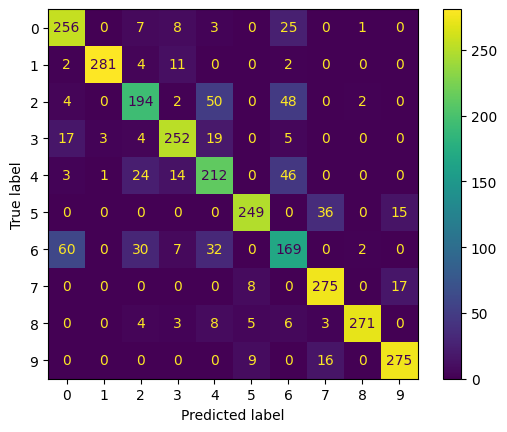

Fold 2:
 Accuracy Score: 0.803
 Recall per class: [0.83       0.96333333 0.64333333 0.85666667 0.68       0.82333333
 0.50333333 0.91       0.88333333 0.93666667]
 Precision per class: [0.71551724 0.99655172 0.6942446  0.83986928 0.62385321 0.92857143
 0.56981132 0.84782609 0.94982079 0.88087774]
 Macro Recall: 0.8030000000000002
 Macro Precision: 0.8046943429648555


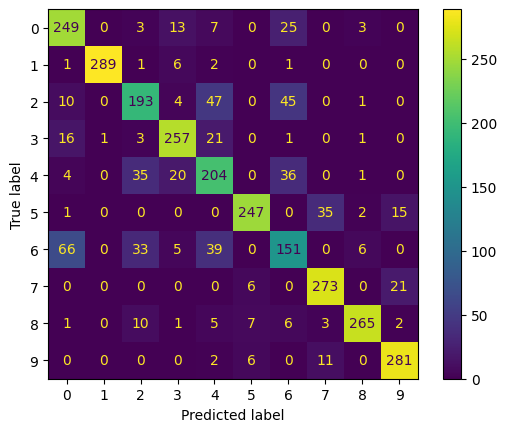

Fold 3:
 Accuracy Score: 0.8073333333333333
 Recall per class: [0.82333333 0.94666667 0.67666667 0.80333333 0.71       0.82333333
 0.52666667 0.91       0.89666667 0.95666667]
 Precision per class: [0.71387283 0.98269896 0.68581081 0.81418919 0.665625   0.94636015
 0.58736059 0.85579937 0.98175182 0.86969697]
 Macro Recall: 0.8073333333333332
 Macro Precision: 0.8103165709915142


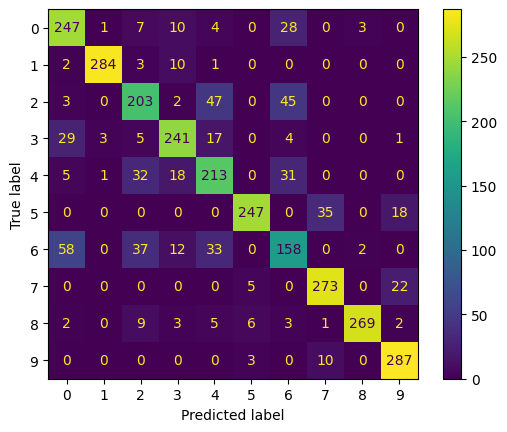

Fold 4:
 Accuracy Score: 0.8093333333333333
 Recall per class: [0.83666667 0.95666667 0.69333333 0.82666667 0.69333333 0.79
 0.53333333 0.91333333 0.91666667 0.93333333]
 Precision per class: [0.71509972 0.98965517 0.70748299 0.83783784 0.67752443 0.91153846
 0.58394161 0.85625    0.9751773  0.85889571]
 Macro Recall: 0.8093333333333333
 Macro Precision: 0.811340322637994


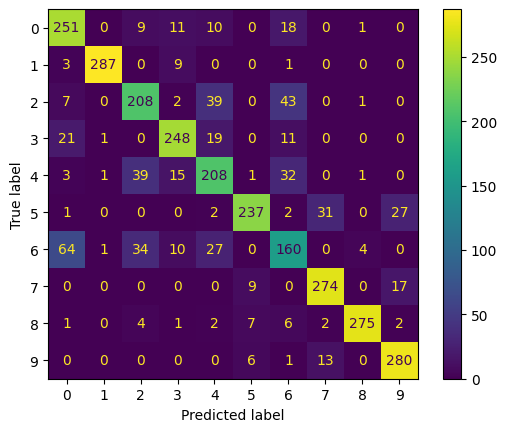

Fold 5:
 Accuracy Score: 0.8133333333333334
 Recall per class: [0.84       0.94333333 0.67666667 0.88333333 0.71333333 0.81333333
 0.51       0.91       0.89333333 0.95      ]
 Precision per class: [0.71794872 0.99298246 0.73818182 0.82298137 0.66666667 0.92424242
 0.5862069  0.86666667 0.95714286 0.87423313]
 Macro Recall: 0.8133333333333332
 Macro Precision: 0.8147252998835208


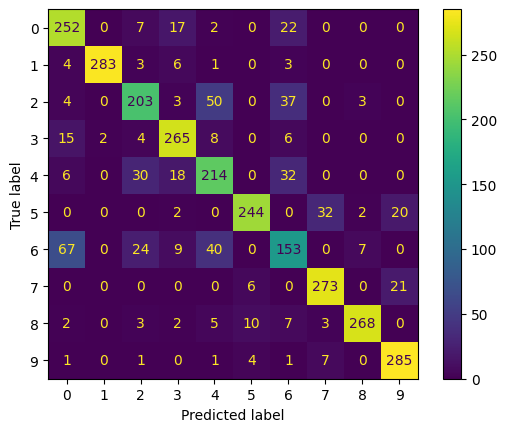

Fold 6:
 Accuracy Score: 0.804
 Recall per class: [0.82       0.92       0.66       0.86       0.70333333 0.81666667
 0.50333333 0.92333333 0.91333333 0.92      ]
 Precision per class: [0.74772036 0.99280576 0.71223022 0.8164557  0.63939394 0.92105263
 0.54909091 0.84969325 0.96478873 0.86792453]
 Macro Recall: 0.804
 Macro Precision: 0.8061156024460985


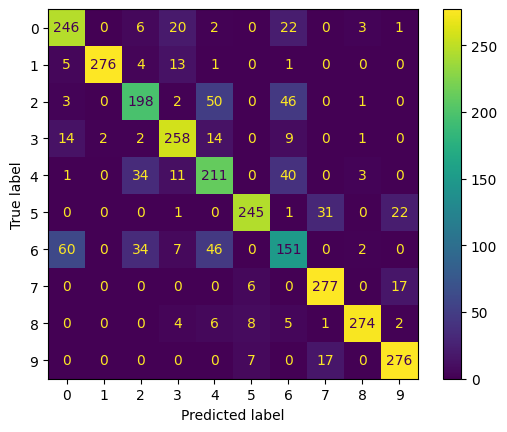

Fold 7:
 Accuracy Score: 0.8166666666666667
 Recall per class: [0.85666667 0.95       0.67333333 0.83       0.68       0.86333333
 0.49       0.92       0.94333333 0.96      ]
 Precision per class: [0.74063401 0.98275862 0.68013468 0.82724252 0.66449511 0.94871795
 0.58102767 0.89032258 0.94019934 0.89719626]
 Macro Recall: 0.8166666666666668
 Macro Precision: 0.8152728740089197


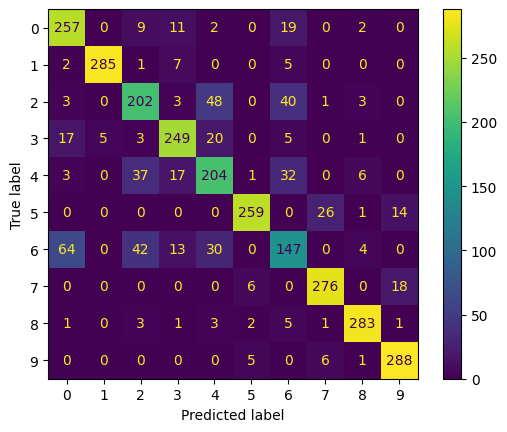

Fold 8:
 Accuracy Score: 0.8063333333333333
 Recall per class: [0.83666667 0.93666667 0.64666667 0.84333333 0.68333333 0.81333333
 0.53333333 0.90666667 0.89666667 0.96666667]
 Precision per class: [0.74041298 0.99293286 0.71062271 0.84333333 0.5994152  0.93846154
 0.60150376 0.85266458 0.9471831  0.86826347]
 Macro Recall: 0.8063333333333332
 Macro Precision: 0.8094793536484236


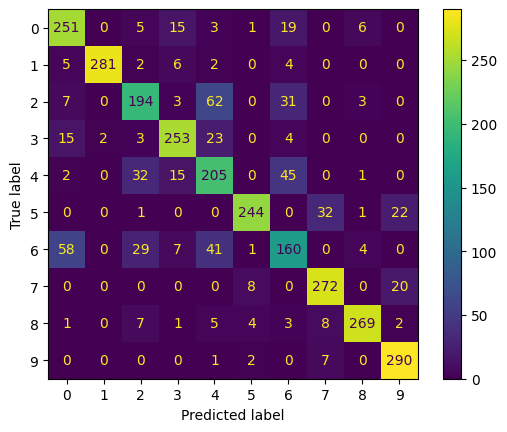

Fold 9:
 Accuracy Score: 0.798
 Recall per class: [0.82       0.95333333 0.69       0.83       0.67666667 0.77666667
 0.45       0.91       0.90666667 0.96666667]
 Precision per class: [0.73214286 0.99305556 0.64890282 0.84982935 0.62654321 0.95491803
 0.52734375 0.85579937 0.96797153 0.85294118]
 Macro Recall: 0.798
 Macro Precision: 0.8009447657974743


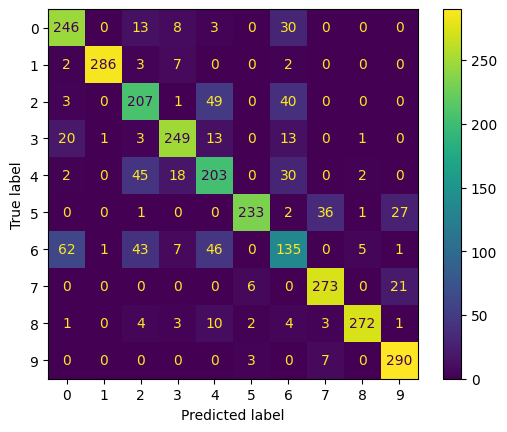

 Fold using k=11 and distance metric = <function euclidean at 0x72e3aa8f9bc0>
 Total avg Accuracy: 0.8085666666666667
 Total avg Macro Recall: 0.8085666666666667
 Total avg Macro Precision: 0.8104627725013576
Fold 0:
 Accuracy Score: 0.8186666666666667
 Recall per class: [0.85666667 0.95666667 0.76333333 0.87333333 0.75333333 0.7
 0.45333333 0.92333333 0.95       0.95666667]
 Precision per class: [0.75146199 0.99652778 0.72698413 0.85064935 0.64204545 0.96774194
 0.70466321 0.84969325 0.92833876 0.81534091]
 Macro Recall: 0.8186666666666668
 Macro Precision: 0.8233446769019542


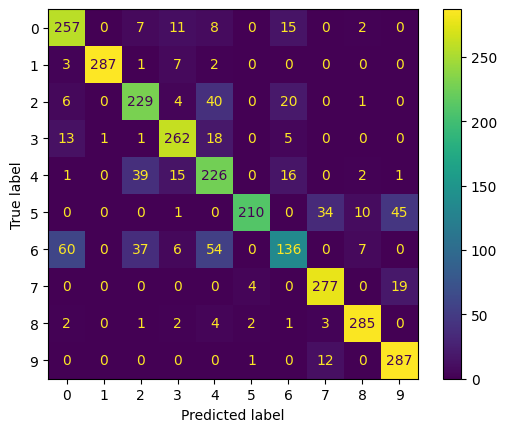

Fold 1:
 Accuracy Score: 0.8156666666666667
 Recall per class: [0.87666667 0.95       0.72       0.83333333 0.77666667 0.68333333
 0.5        0.92666667 0.94       0.95      ]
 Precision per class: [0.74504249 0.98958333 0.77697842 0.85910653 0.62634409 0.97156398
 0.67567568 0.81524927 0.94314381 0.82608696]
 Macro Recall: 0.8156666666666667
 Macro Precision: 0.8228774551559763


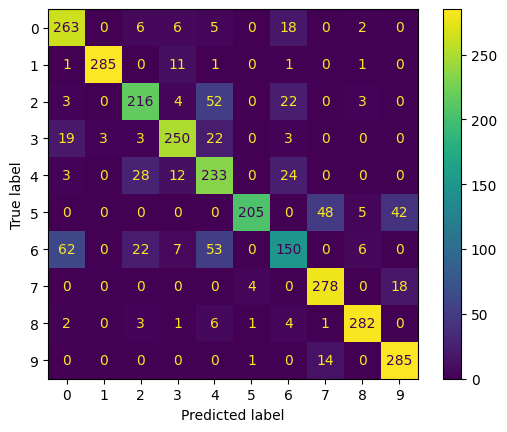

Fold 2:
 Accuracy Score: 0.815
 Recall per class: [0.87       0.96       0.69666667 0.86       0.77333333 0.66666667
 0.54666667 0.89333333 0.91333333 0.97      ]
 Precision per class: [0.74358974 1.         0.74113475 0.86868687 0.64623955 0.97087379
 0.7008547  0.84012539 0.92255892 0.79291553]
 Macro Recall: 0.8150000000000001
 Macro Precision: 0.822697925137328


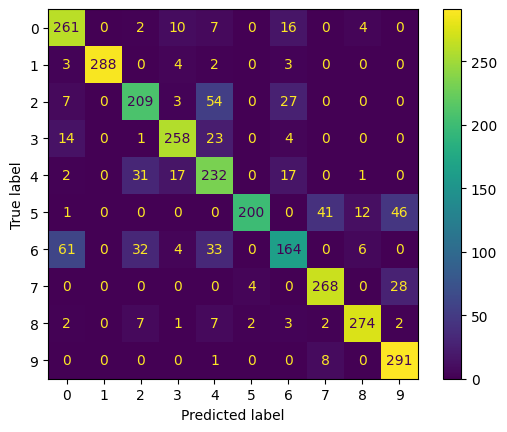

Fold 3:
 Accuracy Score: 0.8146666666666667
 Recall per class: [0.83666667 0.96666667 0.73333333 0.84333333 0.79333333 0.67
 0.50666667 0.90666667 0.92666667 0.96333333]
 Precision per class: [0.74260355 0.98639456 0.75085324 0.85762712 0.66111111 0.98529412
 0.65800866 0.82674772 0.96527778 0.78532609]
 Macro Recall: 0.8146666666666667
 Macro Precision: 0.8219243940949743


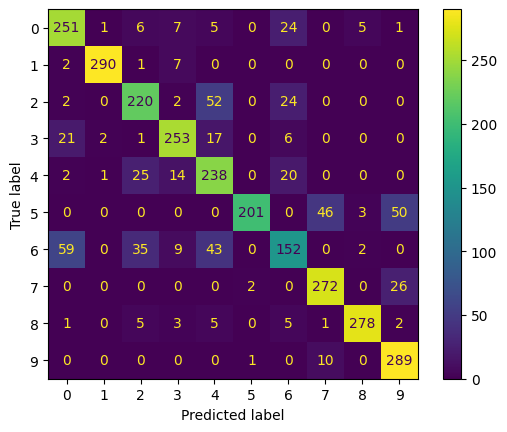

Fold 4:
 Accuracy Score: 0.82
 Recall per class: [0.84       0.97333333 0.71333333 0.84666667 0.78333333 0.65333333
 0.54       0.92333333 0.95666667 0.97      ]
 Precision per class: [0.75223881 0.98983051 0.72789116 0.85810811 0.68115942 0.97029703
 0.69827586 0.83939394 0.94407895 0.79291553]
 Macro Recall: 0.8200000000000001
 Macro Precision: 0.825418930917472


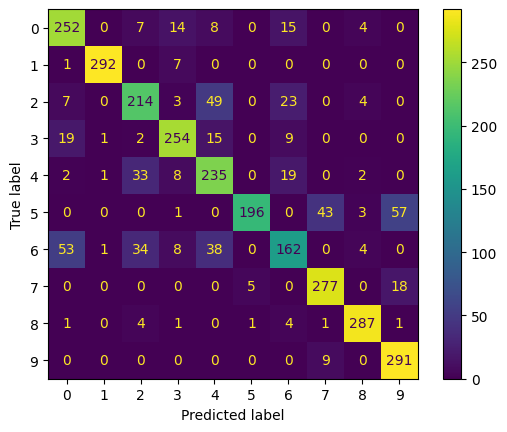

Fold 5:
 Accuracy Score: 0.809
 Recall per class: [0.83       0.95666667 0.74       0.86333333 0.77       0.64
 0.48666667 0.9        0.94666667 0.95666667]
 Precision per class: [0.74107143 0.97952218 0.7628866  0.84364821 0.65811966 0.97461929
 0.65470852 0.84639498 0.92810458 0.76127321]
 Macro Recall: 0.8089999999999999
 Macro Precision: 0.8150348655956592


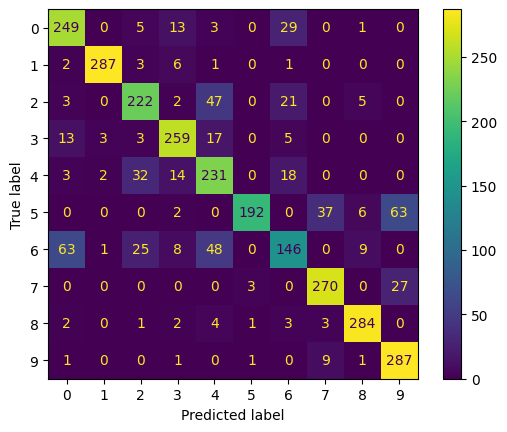

Fold 6:
 Accuracy Score: 0.8126666666666666
 Recall per class: [0.82666667 0.94666667 0.72333333 0.88       0.79666667 0.66333333
 0.48666667 0.90666667 0.95       0.94666667]
 Precision per class: [0.76307692 0.98611111 0.73809524 0.85714286 0.67323944 0.97073171
 0.64035088 0.86075949 0.91935484 0.76549865]
 Macro Recall: 0.8126666666666666
 Macro Precision: 0.8174361135227572


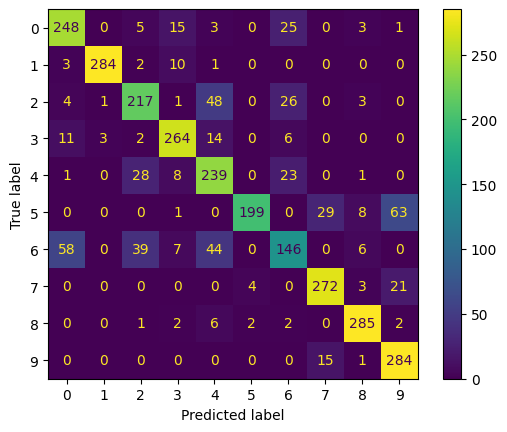

Fold 7:
 Accuracy Score: 0.819
 Recall per class: [0.85666667 0.96333333 0.72666667 0.85       0.78333333 0.69
 0.47       0.92333333 0.95       0.97666667]
 Precision per class: [0.72804533 0.99312715 0.75172414 0.85284281 0.67335244 0.97641509
 0.68115942 0.86292835 0.9047619  0.80716253]
 Macro Recall: 0.819
 Macro Precision: 0.823151915910733


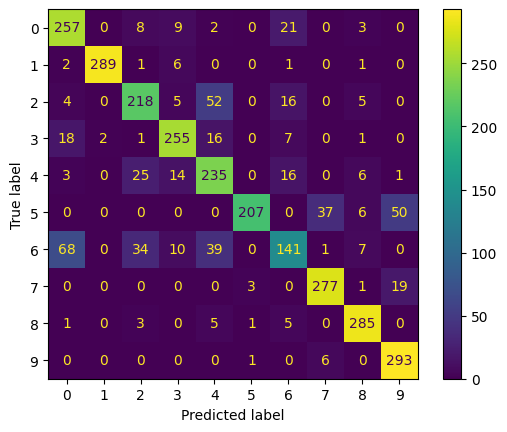

Fold 8:
 Accuracy Score: 0.808
 Recall per class: [0.84333333 0.97       0.71333333 0.83666667 0.74333333 0.67
 0.47666667 0.9        0.94666667 0.98      ]
 Precision per class: [0.73976608 0.98979592 0.74048443 0.86254296 0.62116992 0.99014778
 0.65       0.84375    0.92508143 0.784     ]
 Macro Recall: 0.808
 Macro Precision: 0.8146738517541424


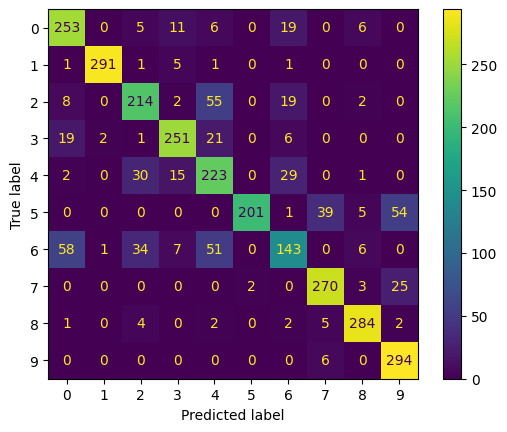

Fold 9:
 Accuracy Score: 0.8006666666666666
 Recall per class: [0.81       0.96333333 0.72333333 0.82333333 0.75666667 0.67333333
 0.44666667 0.91333333 0.93       0.96666667]
 Precision per class: [0.72972973 0.98634812 0.71617162 0.85467128 0.62362637 0.98536585
 0.6036036  0.83030303 0.93       0.8033241 ]
 Macro Recall: 0.8006666666666666
 Macro Precision: 0.8063143710949692


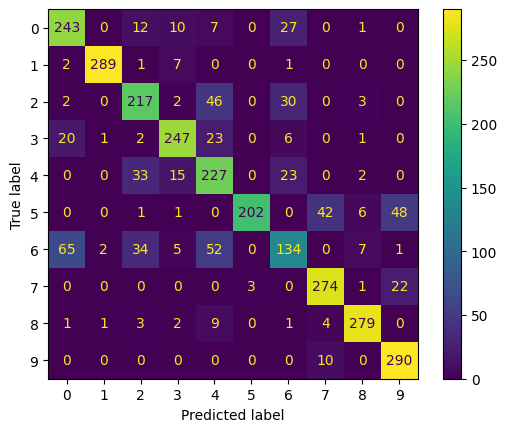

 Fold using k=11 and distance metric = <function cos_distance at 0x72e3aa8f9c60>
 Total avg Accuracy: 0.8133333333333332
 Total avg Macro Recall: 0.8133333333333332
 Total avg Macro Precision: 0.8192874500085967
Fold 0:
 Accuracy Score: 0.8213333333333334
 Recall per class: [0.85       0.95333333 0.73666667 0.86666667 0.65666667 0.85
 0.48333333 0.92333333 0.93333333 0.96      ]
 Precision per class: [0.75       0.97945205 0.69936709 0.84415584 0.65666667 0.95864662
 0.59183673 0.87658228 0.9556314  0.88888889]
 Macro Recall: 0.8213333333333335
 Macro Precision: 0.8201227572147165


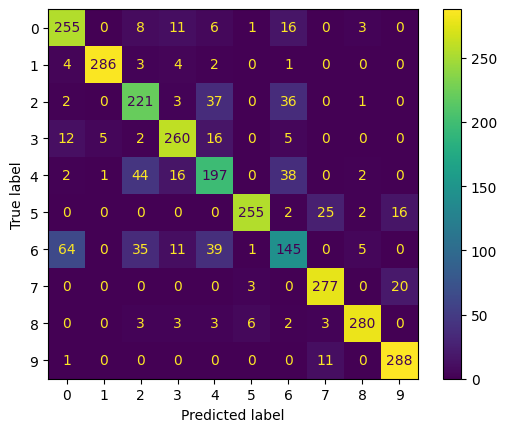

Fold 1:
 Accuracy Score: 0.8223333333333334
 Recall per class: [0.84333333 0.94666667 0.69       0.84       0.72       0.84333333
 0.54666667 0.92333333 0.92333333 0.94666667]
 Precision per class: [0.74193548 0.97931034 0.7366548  0.86597938 0.675      0.95833333
 0.56944444 0.85493827 0.97192982 0.89873418]
 Macro Recall: 0.8223333333333335
 Macro Precision: 0.8252260065571624


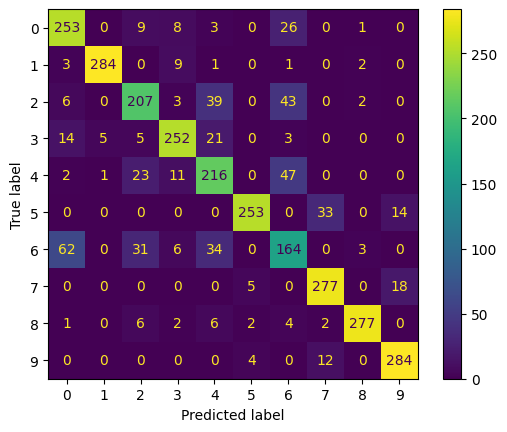

Fold 2:
 Accuracy Score: 0.816
 Recall per class: [0.83666667 0.96       0.69       0.87333333 0.68666667 0.81
 0.52333333 0.93       0.89666667 0.95333333]
 Precision per class: [0.72543353 1.         0.67868852 0.87919463 0.66237942 0.95669291
 0.59469697 0.83783784 0.95390071 0.89655172]
 Macro Recall: 0.8160000000000001
 Macro Precision: 0.8185376256974497


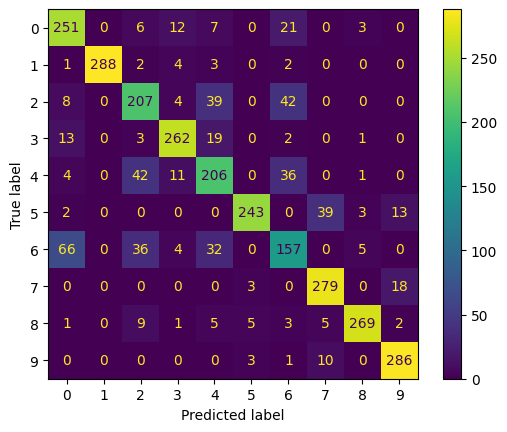

Fold 3:
 Accuracy Score: 0.8226666666666667
 Recall per class: [0.83       0.97       0.72       0.83333333 0.72       0.84666667
 0.52       0.91333333 0.91       0.96333333]
 Precision per class: [0.73451327 0.98310811 0.7012987  0.84175084 0.68138801 0.95849057
 0.61660079 0.87539936 0.97153025 0.87311178]
 Macro Recall: 0.8226666666666667
 Macro Precision: 0.8237191687273826


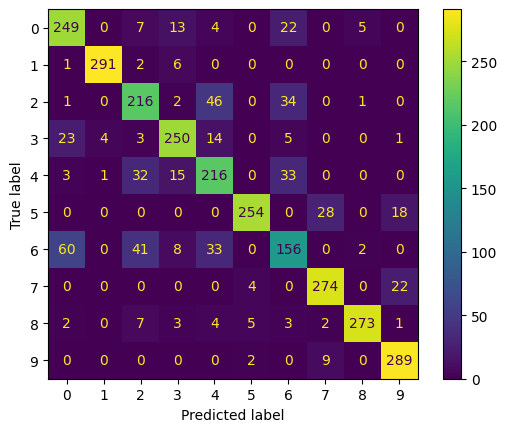

Fold 4:
 Accuracy Score: 0.8153333333333334
 Recall per class: [0.82       0.96666667 0.71333333 0.82666667 0.70666667 0.79
 0.54       0.92333333 0.92666667 0.94      ]
 Precision per class: [0.72352941 0.97972973 0.67936508 0.8641115  0.69736842 0.92941176
 0.59778598 0.85493827 0.9754386  0.87306502]
 Macro Recall: 0.8153333333333335
 Macro Precision: 0.817474376631169


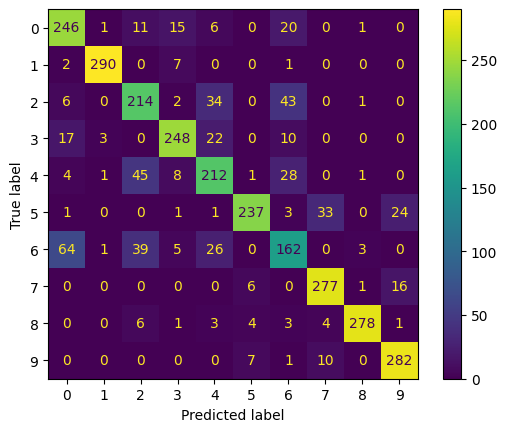

Fold 5:
 Accuracy Score: 0.827
 Recall per class: [0.84333333 0.95       0.71       0.87333333 0.71       0.85333333
 0.52666667 0.92666667 0.92666667 0.95      ]
 Precision per class: [0.73546512 0.98958333 0.73702422 0.82389937 0.68709677 0.96603774
 0.60536398 0.87974684 0.96193772 0.890625  ]
 Macro Recall: 0.827
 Macro Precision: 0.8276780088557821


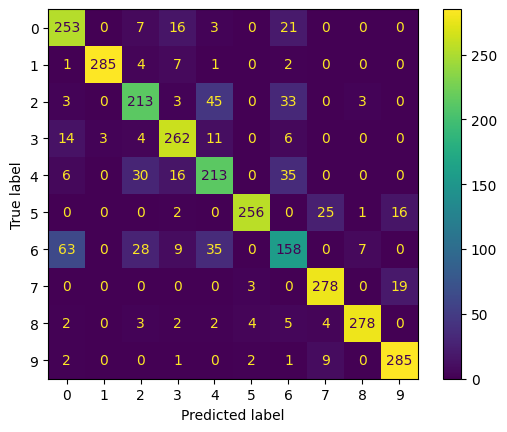

Fold 6:
 Accuracy Score: 0.8176666666666667
 Recall per class: [0.82       0.94       0.72       0.85       0.70333333 0.83333333
 0.5        0.93333333 0.94333333 0.93333333]
 Precision per class: [0.77115987 0.9825784  0.71760797 0.81469649 0.66144201 0.94339623
 0.57692308 0.875      0.95608108 0.875     ]
 Macro Recall: 0.8176666666666665
 Macro Precision: 0.8173885121554468


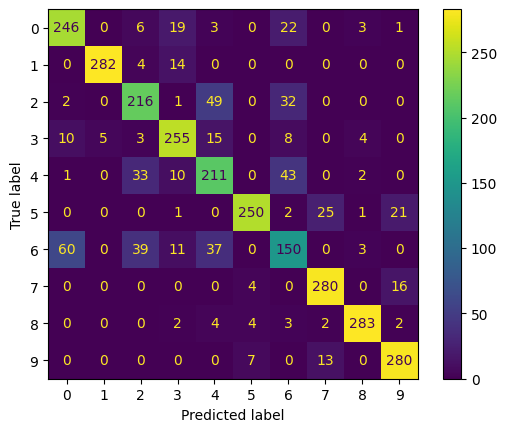

Fold 7:
 Accuracy Score: 0.831
 Recall per class: [0.88666667 0.95333333 0.70666667 0.82       0.70333333 0.88
 0.50333333 0.93333333 0.95333333 0.97      ]
 Precision per class: [0.75568182 0.98281787 0.72108844 0.82828283 0.66352201 0.96703297
 0.62396694 0.8974359  0.95016611 0.909375  ]
 Macro Recall: 0.8310000000000001
 Macro Precision: 0.8299369883407655


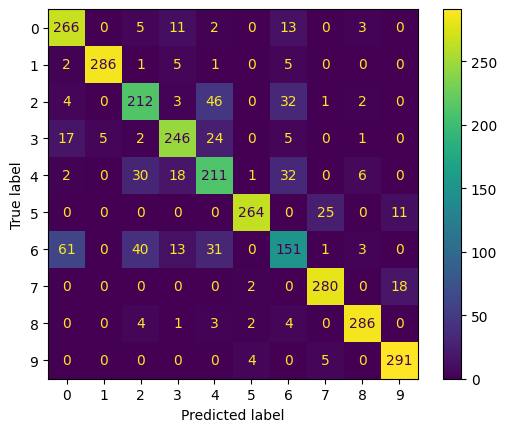

Fold 8:
 Accuracy Score: 0.8186666666666667
 Recall per class: [0.84333333 0.94       0.68333333 0.86666667 0.68666667 0.84333333
 0.52       0.92       0.91333333 0.97      ]
 Precision per class: [0.73760933 0.98947368 0.70934256 0.83601286 0.65396825 0.95833333
 0.60465116 0.87898089 0.94158076 0.88181818]
 Macro Recall: 0.8186666666666665
 Macro Precision: 0.8191771015590514


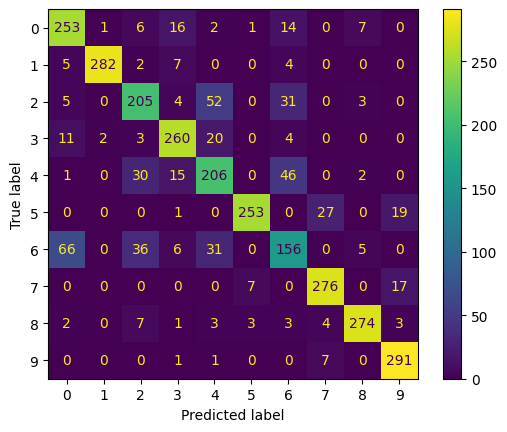

Fold 9:
 Accuracy Score: 0.806
 Recall per class: [0.81       0.94       0.72666667 0.82333333 0.69       0.81666667
 0.45       0.91333333 0.92333333 0.96666667]
 Precision per class: [0.72106825 0.97916667 0.66060606 0.85172414 0.65714286 0.96078431
 0.54435484 0.88102894 0.95189003 0.86567164]
 Macro Recall: 0.806
 Macro Precision: 0.8073437739102005


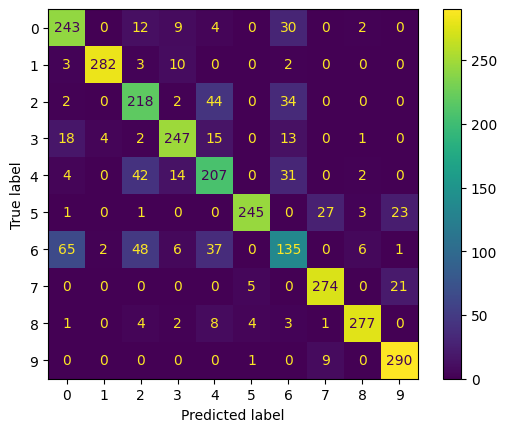

 Fold using k=11 and distance metric = <function manhatan at 0x72e3aa8f9da0>
 Total avg Accuracy: 0.8198000000000001
 Total avg Macro Recall: 0.8198000000000001
 Total avg Macro Precision: 0.8206604319649127


In [32]:
# Create the StratifiedKfold object with 10 folds
skf = StratifiedKFold(n_splits=10)
possible_k = [5,7,9,11]
possible_distance_metric = [euclidean,cos_distance,manhatan]
for k in possible_k:
    for distance_metric in possible_distance_metric:
        knn = Knn(k,distance_metric)
        accuracy = []
        macro_recall = []
        macro_precision = []
        for i, (train_index, test_index) in enumerate(skf.split(x_train_half_per_axis, y_train_half_per_axis)):
            print(f"Fold {i}:")
            x_train_fold , x_test_fold = x_train_half_per_axis[train_index], x_train_half_per_axis[test_index]
            y_train_fold , y_test_fold = y_train_half_per_axis[train_index], y_train_half_per_axis[test_index]
            knn.fit(x_train_fold,y_train_fold)
            y_pred = knn.predict(x_test_fold)
            acc,re,pre = evaluation(y_pred,y_test_fold)
            accuracy.append(acc)
            macro_recall.append(re)
            macro_precision.append(pre)
        print(f" Fold using k={k} and distance metric = {distance_metric}")
        print(f" Total avg Accuracy: {np.mean(accuracy)}")
        print(f" Total avg Macro Recall: {np.mean(macro_recall)}")
        print(f" Total avg Macro Precision: {np.mean(macro_precision)}") 

### k=7, distance = manhatan using mean per axis

 Knn with k = 7 and distance = manhatan
 Accuracy Score: 0.8239
 Recall per class: [0.826 0.95  0.734 0.831 0.711 0.854 0.52  0.93  0.925 0.958]
 Precision per class: [0.75022707 0.98650052 0.69507576 0.86024845 0.68629344 0.96715742
 0.58624577 0.87653157 0.94871795 0.89365672]
 Macro Recall: 0.8238999999999999
 Macro Precision: 0.8250654655870597


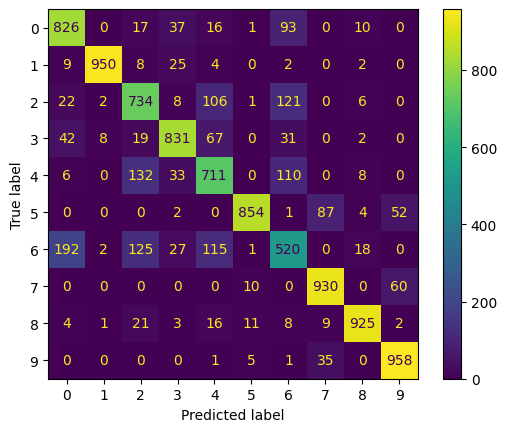

(0.8239, 0.8238999999999999, 0.8250654655870597)


In [22]:
knn_7 = Knn(7,manhatan)
knn_7.fit(x_train_per_axis,y_train)
y_preds_7 = knn_7.predict(x_test_per_axis)
print(f" Knn with k = 7 and distance = manhatan")
print(evaluation(y_preds_7, y_test))

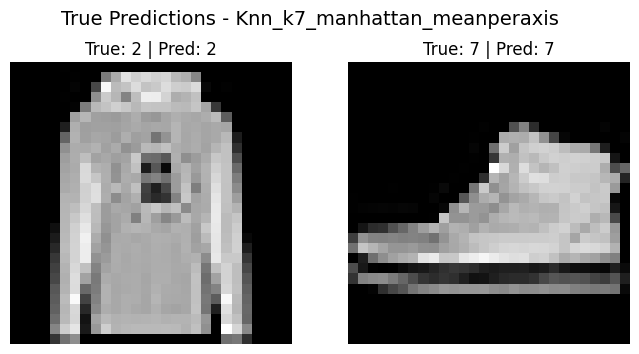

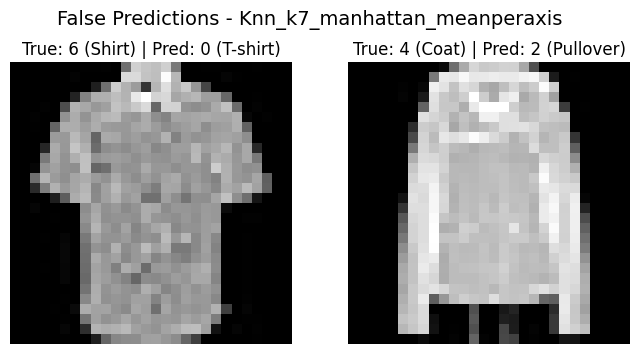

In [23]:
plot_and_save_analysis(y_test,y_preds_7,flattening(x_test),"Knn_k7_manhattan_meanperaxis")

## Evaluate the algorithm on MNIST dataset

In [27]:
(mnist_x_train, mnist_y_train) , (mnist_x_test, mnist_y_test) = tf.keras.datasets.mnist.load_data()


 Knn with PCA 90%, k = 11 and distance = manhatan
 Accuracy Score: 0.9642
 Recall per class: [0.99081633 0.99471366 0.94864341 0.96633663 0.95010183 0.96636771
 0.98538622 0.95428016 0.9301848  0.95242815]
 Precision per class: [0.95948617 0.93926789 0.97997998 0.96252465 0.97492163 0.96636771
 0.97019527 0.95335277 0.98800436 0.95621891]
 Macro Recall: 0.9639258901977131
 Macro Precision: 0.9650319340329648


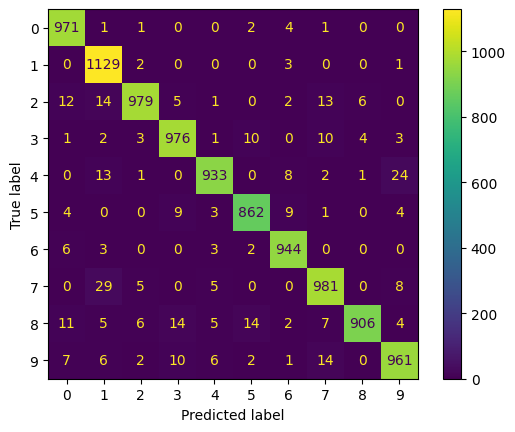

(0.9642, 0.9639258901977131, 0.9650319340329648)


In [28]:
# Flaten the 28x28 image to 784 vector
x_mnist_train_flat = flattening(mnist_x_train)
x_mnist_test_flat = flattening(mnist_x_test)

# Normalize the pixels values
x_mnist_train_flat, x_mnist_test_flat = norm(x_mnist_train_flat,x_mnist_test_flat)

knn_optimal_90_mnist = Knn(11,manhatan)
pca_optimal_90_mnist = PCA(n_components=0.9)
x_train_opt_90_mnist = pca_optimal_90_mnist.fit_transform(x_mnist_train_flat)
x_test_opt_90_mnist = pca_optimal_90_mnist.transform(x_mnist_test_flat)
knn_optimal_90_mnist.fit(x_train_opt_90_mnist,mnist_y_train)
y_preds_opt_90_mnist = knn_optimal_90_mnist.predict(x_test_opt_90_mnist)
print(f" Knn with PCA 90%, k = 11 and distance = manhatan")
print(evaluation(y_preds_opt_90_mnist, mnist_y_test))

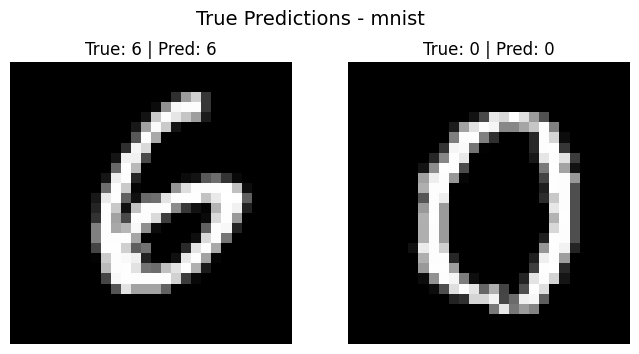

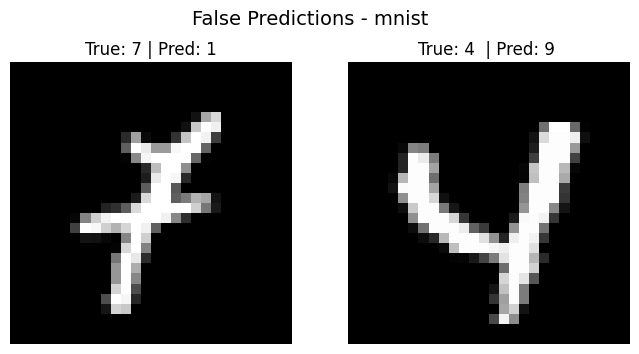

In [ ]:
plot_and_save_analysis(mnist_y_test,y_preds_opt_90_mnist,x_mnist_test_flat,"mnist")


## Nearest Centroid Classifier

### Data preprocessing

In [52]:
x_train_nca = flattening(x_train) 
x_test_nca = flattening(x_test)
x_train_nca , x_test_nca = norm(x_train_nca , x_test_nca)

### 1st try using euclidean distance and flattening

 Nearest Centroid with flattening distance = euclidean:
For 60,000 train samples the training time needed is: 0.441 sec
For 10,000 test samples the predict time needed is: 0.015 sec
For 1 test sample the predict time needed is approximently: 1773772355.300 sec, 1596554775.249 msec
 Accuracy Score: 0.6768
 Recall per class: [0.685 0.879 0.45  0.767 0.562 0.776 0.217 0.82  0.744 0.868]
 Precision per class: [0.71205821 0.97342193 0.54021609 0.68850987 0.51606979 0.49679898
 0.33487654 0.76208178 0.92652553 0.85940594]
 Macro Recall: 0.6768000000000001
 Macro Precision: 0.680996466165492


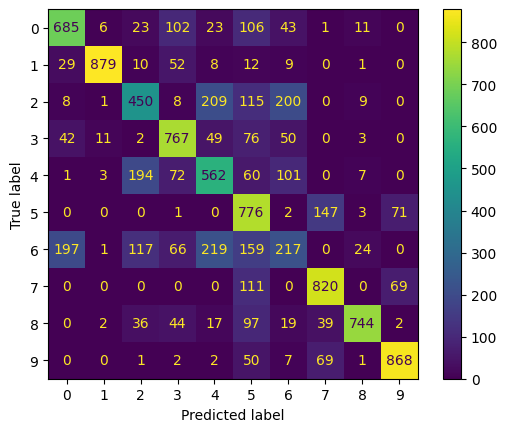

(0.6768, 0.6768000000000001, 0.680996466165492)


In [21]:
nca = NearestCentroid()
fit_time = time.time()
nca.fit(x_train_nca,y_train)
end_fit_time = time.time()
pred_time = time.time()
y_nca_pred = nca.predict(x_test_nca)
end_pred_time = time.time()
print(f" Nearest Centroid with flattening distance = euclidean:")
print(f"For 60,000 train samples the training time needed is: {end_fit_time-fit_time:.3f} sec")
print(f"For 10,000 test samples the predict time needed is: {end_pred_time-pred_time:.3f} sec")
print(f"For 1 test sample the predict time needed is approximently: {end_pred_time-pred_time/10000 :.3f} sec, {end_pred_time-pred_time/10000 * 1000:.3f} msec")
print(evaluation(y_nca_pred,y_test))

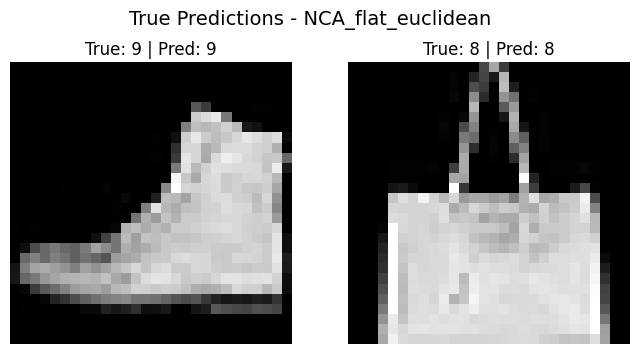

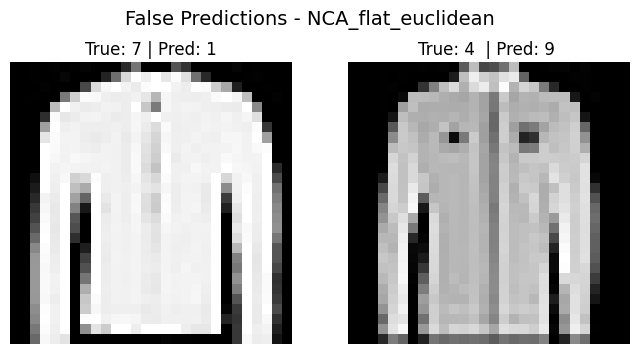

In [23]:
plot_and_save_analysis(y_test,y_nca_pred,x_test_nca,"NCA_flat_euclidean")

### 2nd try using pca and euclidean

 Nearest Centroid with PCA , distance = euclidean:
For 10,000 test samples the predict time needed is: 0.015 sec
 Accuracy Score: 0.6759
 Recall per class: [0.685 0.878 0.448 0.766 0.562 0.773 0.216 0.819 0.744 0.868]
 Precision per class: [0.71205821 0.97231451 0.53975904 0.68761221 0.51606979 0.49519539
 0.33230769 0.75974026 0.92652553 0.85940594]
 Macro Recall: 0.6759000000000001
 Macro Precision: 0.6800988561935944


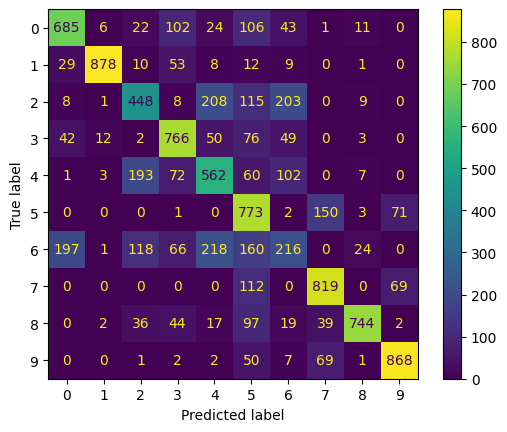

(0.6759, 0.6759000000000001, 0.6800988561935944)


In [26]:
nca_2 = NearestCentroid()
pca_90 = PCA(n_components=0.9)
x_train_nca_90 = pca_90.fit_transform(x_train_nca)
x_test_nca_90 = pca_90.transform(x_test_nca)
nca_2.fit(x_train_nca_90,y_train)
pred_time = time.time()
y_nca2_pred = nca_2.predict(x_test_nca_90)
end_pred_time = time.time()
print(f" Nearest Centroid with PCA , distance = euclidean:")
print(f"For 10,000 test samples the predict time needed is: {end_pred_time-pred_time:.3f} sec")
print(evaluation(y_nca2_pred,y_test))


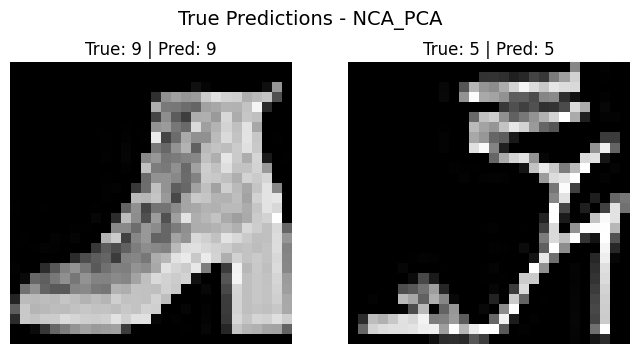

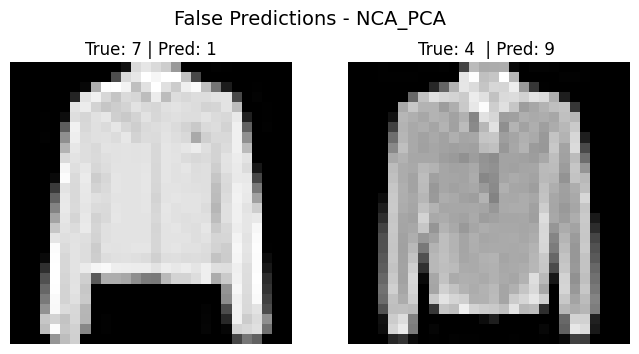

In [14]:
plot_and_save_analysis(y_test,y_nca2_pred,x_test_nca,"NCA_PCA")

## Knn and KMeans

### Use Kmeans with 3 means per class

 Accuracy Score: 0.7609
 Recall per class: [0.762 0.921 0.679 0.786 0.594 0.856 0.43  0.847 0.845 0.889]
 Precision per class: [0.68896926 0.97770701 0.59771127 0.8136646  0.63191489 0.81060606
 0.46186896 0.84027778 0.917481   0.8943662 ]
 Macro Recall: 0.7609
 Macro Precision: 0.7634567015045606


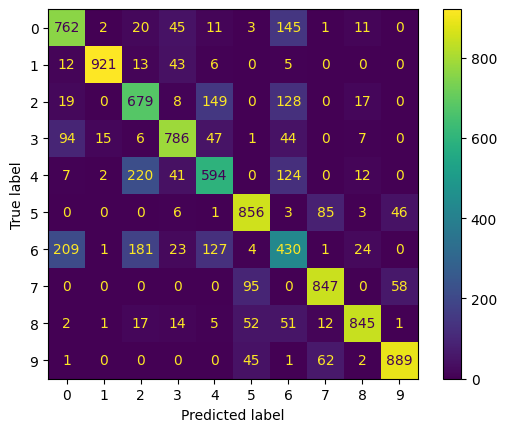

(0.7609, 0.7609, 0.7634567015045606)


In [61]:
knn_means = Knn(1,manhatan)
pca_means = PCA(n_components=0.9)
x_train_means = pca_means.fit_transform(x_train_nca)
x_test_means = pca_means.transform(x_test_nca)
x_means = []
y_means = []
for i in range(10):
    x_class = x_train_means[y_train==i]
    kmeans = KMeans(n_clusters=3,random_state=42,n_init='auto').fit(x_class) 
    for cluster in kmeans.cluster_centers_:
        x_means.append(cluster)
        y_means.append(i)
x_means = np.array(x_means)
y_means = np.array(y_means)

knn_means.fit(x_means,y_means)
last_pred = knn_means.predict(x_test_means)
print(evaluation(last_pred,y_test))

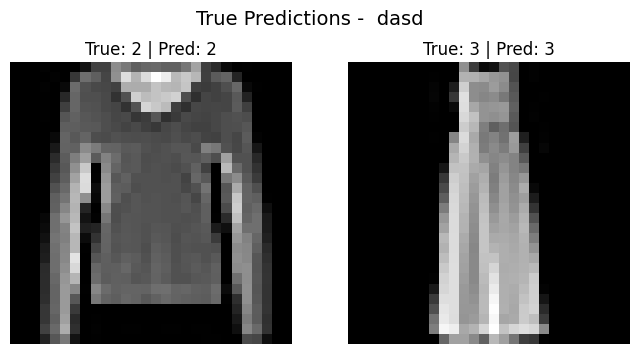

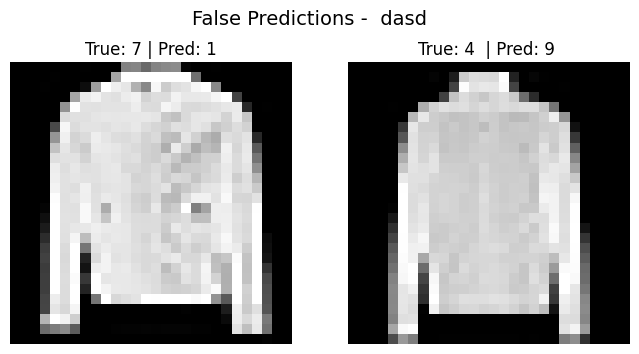

In [63]:
plot_and_save_analysis(y_test,last_pred,x_test_nca," dasd")